In [1]:
import numpy as np
import matplotlib.colors
import matplotlib.pyplot as plt
import matplotlib.lines as lines
import networkx as nx
import pandas as pd
import os
from itertools import combinations
import time
import keyboard
from IPython.display import clear_output

import multiprocess as mp
from tqdm import tqdm # progress bar

In [2]:
time_limit = 10

### Center node selection (SP, MPG)

In [3]:
def find_center_node(G,users):

    G_trimmed = G.copy()
    for n in G.nodes():
        if G.degree(n) == 1 and n not in users:
            G_trimmed.remove_node(n)
    weighed_ecc = {}
    weighed_sum = {}
    for c in [n for n in G_trimmed.nodes() if (G_trimmed.degree(n)>=len(users) and n not in users)]: # due to disjointness, center node must have deg > #users
        distance_list = []
        for u in users:
            distance_list.append(len(nx.shortest_path(G_trimmed, source=c, target=u, weight='weight')))
        weighed_ecc[c] = max(distance_list)
        weighed_sum[c] = sum(distance_list)

    # classicaly, graph center minimizes eccentricity
    if len(weighed_ecc)==0 and len(weighed_sum)==0:
        print('No valid central node.')
        return (None,None)
    
    min_ecc = min(weighed_ecc.values())
    min_ecc_nodes = [node for node, ecc in weighed_ecc.items() if ecc == min_ecc]
    #print(f'center ecc candidates: {min_ecc_nodes}')
    if len(min_ecc_nodes) == 1:
        center_ecc = min_ecc_nodes[0]
    elif len(min_ecc_nodes) > 1:
        center_ecc = min(min_ecc_nodes, key=weighed_sum.get)
    
    min_sum = min(weighed_sum.values())
    min_sum_nodes = [node for node, sum in weighed_sum.items() if sum == min_sum]
    #print(f'center sum candidates: {min_sum_nodes}')
    if len(min_sum_nodes) == 1:
        center_sum = min_sum_nodes[0]
    elif len(min_sum_nodes) > 1:
        center_sum = min(min_sum_nodes, key=weighed_ecc.get)

    return (center_ecc,center_sum)  

### Shortest Path

In [4]:
# Dijkstra

def disjoint_path_priority(G,users,c,index):
        G_trimmed = G.copy()
        users_TBD = list(users)
        shortest_paths_disj = []
        shortest_paths_disj_edges = []

        while len(users_TBD) > 0:
            shortest_paths = {}
            shortest_paths_cost = {}
        
            for u in users_TBD:
                G_no_u = G_trimmed.copy()
                try:
                    G_no_u.remove_nodes_from([v for v in list(users) if v!=u])
                    G_no_u.add_node(u)
                    shortest_path = nx.shortest_path(G_no_u,source=c,target=u, weight='weight')
                    shortest_paths[u] = shortest_path
                    shortest_paths_cost[u] = nx.path_weight(G_no_u, shortest_paths[u], weight="weight")
                except nx.NetworkXNoPath as e:
                    return []
            
            sorted_paths = sorted(shortest_paths, key=shortest_paths.get, reverse=True)
            
            try:
                chosen_shortest_path_user = sorted_paths[index]
            except IndexError:
                chosen_shortest_path_user = sorted_paths[-1]
            
            chosen_shortest_path = shortest_paths[chosen_shortest_path_user]
            shortest_paths_disj.append(chosen_shortest_path)
            users_TBD.remove(chosen_shortest_path_user)

            for i in range(len(chosen_shortest_path)-1):
                G_trimmed.remove_edge(chosen_shortest_path[i],chosen_shortest_path[i+1])

        for path in shortest_paths_disj:
            for i in range(len(path)-1):
                shortest_paths_disj_edges.append((path[i],path[i+1]))
        return shortest_paths_disj_edges


def find_disjoint_path_edges(G,users,c,check_connected=False):
        for j in [0,-1]+list(range(1,len(users)-1)): # first longest, then shortest, ...
             disj_paths_edges = disjoint_path_priority(G,users,c,j)
             if disj_paths_edges != []:
                  return disj_paths_edges
        return []

In [5]:
# Evan's implementation

from networkx.algorithms.connectivity import build_auxiliary_edge_connectivity
from networkx.algorithms.flow import build_residual_network, shortest_augmenting_path

    
def make_star_from_paths(G, best_paths):
    J = G.__class__()
    J.add_nodes_from(
        G.nodes(data=True)
    )  # Graph J with nodes from G and no edges (yet!)
    for path in best_paths:
        for u, v in zip(path, path[1:]):
            J.add_edge(u, v)  # add edge to new graph J
            J.edges[u, v].update(G.get_edge_data(u, v))
    return J

def is_valid_star(disjoint_paths, users):
    users_valid = {u: False for u in users}
    for path in disjoint_paths:
        if path[0] in users:
            users_valid[path[0]] = True
        if path[-2] in users: # -1 as exclude super-sink
            users_valid[path[-2]] = True
    return all([is_valid for is_valid in users_valid.values()])


def get_source_and_star(G_base, users, w, first_guess=None):

    
    #     """
    #     improved version of get_source and get_star ... use this instead of get source OR get star!
    #     https://networkx.org/documentation/stable/reference/algorithms/generated/networkx.algorithms.connectivity.disjoint_paths.edge_disjoint_paths.html

    #     Input Pararmeters:
    #     G      - Networkx graph G(V,E) which defines the topology of the network. see graphs.py for more details
    #     users  - List of nodes in G which between which a GHZ should be shared. users[0] is the centre of the star which should be calculated before sending to SP_protocol
    #     Outputs:
    #     best_source - the best source node in graph for SP (and maybe but not confirmed MPG)
    #     best_paths  - the list of paths from source - destinations
    #     J      - Networkx graph J(V,E') with edges of the star-path connecting each destination user with the source node
    #
    # Note shortest path currently min-hop distance
    G = G_base.copy()
    candidate_nodes = [
        node for node in G.nodes if G.degree(node) >= len(users)
    ]  # any node with degree >= number of user
    candidate_nodes += [
         node for node in users if G.degree(node) == len(users) - 1
    ]  # + also users with degree >= num users - 1 (excluding ones already added)
    super_destination = ("x", "x")
    [
        G.add_edge(node, super_destination, weight=0, p=1) for node in users
    ]  # any p > than that of network?
    if first_guess is not None:
        candidate_nodes = [first_guess] + candidate_nodes

    H = build_auxiliary_edge_connectivity(G)
    # Note that the auxiliary digraph has an edge attribute named capacity
    R = build_residual_network(H, "capacity")

    best_source = None
    best_paths = []  # default empty?
    min_length = np.inf
    for node in candidate_nodes:
        disjoint_paths = list(
            nx.edge_disjoint_paths(
                G,
                node,
                super_destination,
                auxiliary=H,
                residual=R,
                flow_func=shortest_augmenting_path,
            )
        )
        success = is_valid_star(disjoint_paths, users)

        if w == 'hops':
            tot_length = sum( [len(path) - 1 for path in disjoint_paths] )
        elif w == 'weight':
            tot_length = sum( [nx.path_weight(G, path, 'weight') for path in disjoint_paths] )
        elif w == 'p':
            tot_length = sum( [nx.path_weight(G, path, 'p') for path in disjoint_paths] )


        if (tot_length < min_length) and success:
            min_length = tot_length
            best_source = node
            best_paths = disjoint_paths
            # print(x)
    G.remove_edges_from(list(G.edges(super_destination)))
    G.remove_node(super_destination)

    if best_source is None:
        #return None, [], None
        raise ValueError(f"valid source for users {users} not found. Perhaps there were no valid candidate nodes? {candidate_nodes}")

    best_paths_remove_super_sink = [path[:-1] for path in best_paths]
    best_paths_edges = [list(zip(path, path[1:])) for path in best_paths_remove_super_sink]
    best_paths_edges = [edge for edges in best_paths_edges for edge in edges]

    J = make_star_from_paths(G, best_paths_remove_super_sink)
    return best_source, best_paths_edges, J

### Node coloring

In [6]:
def node_colors(G,users,center=None):
    color_map = []
    for node in G.nodes():
        if node in users:
            color_map.append('yellowgreen')
        elif node == center:
            color_map.append('yellow')
        else:
            color_map.append('white')
    return color_map



def mod_node_colors(G,users,center1,center2):
    color_map = []
    if center1 != center2:
        for node in G.nodes():
            if node in users:
                color_map.append('yellowgreen')
            elif node == center1:
                color_map.append('yellow')
                continue
            elif node == center2:
                color_map.append('red')
            else: 
                color_map.append('white')
    elif center1 == center2:
        center = center1
        for node in G.nodes():
            if node in users:
                color_map.append('yellowgreen')
            elif node == center:
                color_map.append('orange')
            else: 
                color_map.append('white')
    return color_map

def node_colors_freq(G,users,center=None,freq_dict={}):
    color_map = []
    for node in G.nodes():
        if node in users:
            color_map.append('yellowgreen')
        elif node == center:
            color_map.append('yellow')
        elif node in freq_dict:
            color_map.append((1 - freq_dict[node], 1 - freq_dict[node], 1, 1))
        else:
            color_map.append('white')
    return color_map

### User Selection

In [7]:
def is_element_in_all_sublists(element, l_l):
    for sublist in l_l:
        if element not in sublist:
            return False
    return True

def find_users(G,n):
    # Compute all-pairs shortest path lengths
    all_pairs_shortest_path_lengths = dict(nx.all_pairs_dijkstra_path_length(G))

    user_dict = {}
    
    # Iterate over all combinations of n nodes in the graph
    for nodes in combinations(G.nodes(), n):
        # Calculate the sum of shortest path lengths between each pair in the combination
        distance_sum = sum(all_pairs_shortest_path_lengths[u][v] for u, v in combinations(nodes, 2))
        
        user_dict[nodes] = distance_sum

    sorted_users_l = sorted(user_dict, key=user_dict.get, reverse=True)

    for candidate_users in sorted_users_l:

        bad_cand = False
        for nodes in combinations(candidate_users, 2):
            if bad_cand:
                break

            shortest = nx.shortest_path(G, *nodes)

            if len( set(shortest) & {u for u in candidate_users if u not in nodes} ) == 0:
                continue
            
            else: # check all paths (which takes a while)
                print('checking all paths...')

                all_paths_between = nx.all_simple_paths(G, *nodes, cutoff=20)

                all_paths_between_l = []
                for p in all_paths_between:
                    all_paths_between_l.append(p)

                for k in [u for u in candidate_users if u not in nodes]:
                    if is_element_in_all_sublists(k,all_paths_between_l):
                        #print(candidate_users, nodes, [_ for _ in all_paths_between_l], k)
                        #print('Invalid user choice. Reassigning users...')
                        bad_cand = True
                        break

        if bad_cand:
            continue

        return candidate_users
    

    print('no user config found')

### Protocols

In [8]:
# number of timeslots before qubit decays
T_c = np.inf # qubit coherence lifetime

In [9]:
def users_connected_center_disj(G,users,c):
    shortest_disj = find_disjoint_path_edges(G,users,c,check_connected=True)
    if len(shortest_disj) == 0:
        return [False,None]
    else:
        return [True,shortest_disj]
    
def users_connected(G,users):
    for u in users:
        for v in users:
            if v!= u:
                if not nx.has_path(G,u,v):
                    return False
    return True

In [10]:

def check_disjoint_flow(G_base,users,c,w):
    G = G_base.copy()
    
    super_destination = ("x", "x")
    [
        G.add_edge(node, super_destination, weight=0, p=1) for node in users
    ]  # any p > than that of network?
    
    H = build_auxiliary_edge_connectivity(G)
    # Note that the auxiliary digraph has an edge attribute named capacity
    R = build_residual_network(H, "capacity")
    
    try:
        disjoint_paths = list(
            nx.edge_disjoint_paths(
                G,
                c,
                super_destination,
                auxiliary=H,
                residual=R,
                flow_func=shortest_augmenting_path,
            )
        )
    except nx.NetworkXNoPath:
        return [False, None]
    
    success = is_valid_star(disjoint_paths, users)

    if success:
        paths_remove_super_sink = [path[:-1] for path in disjoint_paths]
        paths_edges = [list(zip(path, path[1:])) for path in paths_remove_super_sink]
        paths_edges = [edge for edges in paths_edges for edge in edges]
        return [True, paths_edges]
    elif not success:
        return [False, None]

    # to end
    return
    if w == 'hops':
        tot_length = sum( [len(path) - 1 for path in disjoint_paths] )
    elif w == 'weight':
        tot_length = sum( [nx.path_weight(G, path, 'weight') for path in disjoint_paths] )
    elif w == 'p':
        tot_length = sum( [nx.path_weight(G, path, 'p') for path in disjoint_paths] )

In [11]:
def protocol(prtcl,G,users,algo):            
    if prtcl not in {'SP','MPG','MPC'}:
        raise ValueError("prtclrithm must be SP, MPG or MPC.")
    
    if not isinstance(G, nx.Graph):
        raise TypeError("G must be a NetworkX graph.")
    
    if not isinstance(users, (list, set, tuple)):
        raise TypeError("users must be a list or set of nodes.")
    
    # initialise G'
    G_prime = nx.Graph()
    G_prime.add_nodes_from(G.nodes())

    # evan output
    if algo == 'flow_hops':
        evan_output = get_source_and_star(G,users,'hops')
    elif algo == 'flow_length':
        evan_output = get_source_and_star(G,users,'weight')
    elif algo == 'flow_p':
        evan_output = get_source_and_star(G,users,'p')

        

    # central node used in SP and MPG
    if prtcl in {'SP','MPG'}:   
        if algo == 'old':
            central = find_center_node(G,users)[0]
        elif algo in ['flow_hops','flow_length','flow_p']:
            central = evan_output[0]

    # SP: entanglement over shortest path edges
    # MPG,MPC: entangement over all edges
    if prtcl == 'SP':
        if algo == 'old':
            entangle_edges = find_disjoint_path_edges(G,users,central)
        elif algo in ['flow_hops','flow_length','flow_p']:
            entangle_edges = evan_output[1]
            
    elif prtcl in {'MPG','MPC'}:
        entangle_edges = G.edges(data=True)
    
    edge_memory = {}
    hasGHZ = False 
    iter = 0

    #start_time = time.time()
    while not hasGHZ:
        '''
        if time.time() - start_time > time_limit:
                 print(f'took >{time_limit}s')
                 return None
        '''
        
        iter += 1
        new_edges = []
        
        for e in entangle_edges:
            e_tuple = (e[0],e[1])
            if e in G_prime.edges():
                e_mem = edge_memory[e_tuple]
                if e_mem == 0:
                    G_prime.remove_edge(*e)
                elif e_mem > 0:
                    edge_memory[e_tuple] -= 1

            elif e not in G_prime.edges():
                edge_memory[e_tuple] = 0
                
                e_prob = G.get_edge_data(*e_tuple).get('p', 1.0)
                rng = np.random.random()
                if rng < e_prob:
                    if prtcl == 'SP':
                        G_prime.add_edge(*e_tuple)
                    elif prtcl in {'MPG','MPC'}:
                        G_prime.add_edge(*e_tuple,weight=e[2]['weight'])
                    edge_memory[e_tuple] = T_c

                    new_edges.append(e)
        

        # Plot each time a new edge is found
        plot_new_e = False
        if plot_new_e and len(new_edges)>0:
            nx.draw(G_prime, with_labels=True, edgecolors='black', font_size=5, node_size=70, pos=pos[i],node_color=real_topo_colors[i])
            plt.title(prtcl + ': iteration ' + str(iter))
            plt.show()
        
        # SP,MPG: checks if each user node connects to central node
        # MPC: checks if all user nodes are connected
        if prtcl == 'SP':
            hasGHZ = all([e in G_prime.edges() for e in entangle_edges])

        elif prtcl == 'MPG':
            if users_connected(G_prime,users):
                if algo == 'old':
                    UCCD = users_connected_center_disj(G_prime,users,central)
                    hasGHZ = UCCD[0]
                    valid_edges = UCCD[1]
                elif algo in ['flow_hops','flow_length','flow_p']:
                    if algo == 'flow_hops':
                        UCCD = check_disjoint_flow(G_prime,users,evan_output[0],'hops')
                    elif algo == 'flow_length':
                        UCCD = check_disjoint_flow(G_prime,users,evan_output[0],'weight')
                    elif algo == 'flow_p':
                        UCCD = check_disjoint_flow(G_prime,users,evan_output[0],'p')
                    
                hasGHZ = UCCD[0]
                valid_edges = UCCD[1]
        

        elif prtcl == 'MPC':
            hasGHZ = users_connected(G_prime,users)

            # update 19/8/24: users can act as repeaters!
            continue
            users_path_exist = []
            for nodes in combinations(users, 2):
                G_prime_no_u = G_prime.copy()
                for u in [u_ for u_ in users if u_ not in nodes]:
                    G_prime_no_u.remove_node(u)
                users_path_bool = nx.has_path(G_prime_no_u, *nodes)
                users_path_exist.append(users_path_bool)
            if all(users_path_exist):
                hasGHZ = True


    if hasGHZ:
        if prtcl == 'SP':
            return (G_prime,iter,entangle_edges)

        elif prtcl == 'MPG':
            return (G_prime,iter,valid_edges)

        elif prtcl == 'MPC':

            G_prime_connected = G_prime.copy()
            for node in G_prime.nodes():
                if not nx.has_path(G_prime,users[0],node): # connected to 1 user means connected to all users
                    G_prime_connected.remove_node(node)
            steiner = nx.algorithms.approximation.steinertree.steiner_tree(G_prime_connected, users, weight='weight',method='mehlhorn')
            
            return (G_prime,iter,steiner)

### Examples

In [12]:
grid5 = nx.grid_2d_graph(5, 5)

pos = {(x,y):(y,-x) for x,y in grid5.nodes()}

grid5_users = set([(0,0),(0,4),(4,0),(4,4)])

grid5_colors = node_colors(grid5,grid5_users)

# nx.draw(grid5, pos=pos, with_labels=True, node_size=1000,node_color=grid5_colors, edgecolors='black', font_size=8)

# find_center_node(grid5,grid5_users)

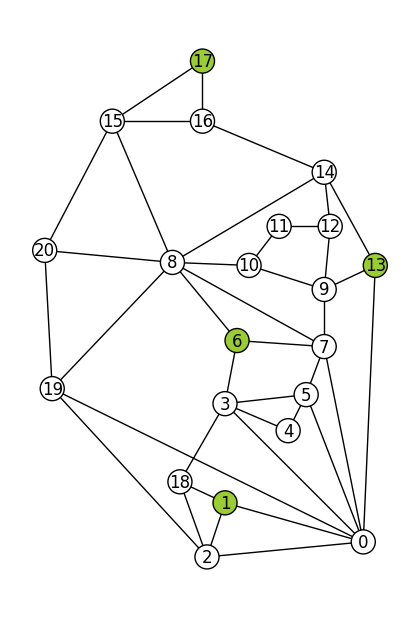

In [13]:
        # UK network
nodes_labels = [i for i in range(21)]
edges_labels = [   
                (0,1),(0,2),(0,3),(0,5),(0,7),(0,13),(0,19),
                (1,2),(1,18),
                (2,18),(2,19),
                (3,4),(3,5),(3,6),(3,18),
                (4,5),
                (5,7),
                (6,7),(6,8),
                (7,8),(7,9),
                (8,10),(8,14),(8,15),(8,19),(8,20),
                (9,10),(9,12),(9,13),
                (10,11),
                (11,12),
                (12,14),
                (13,14),
                (14,16),
                (15,16),(15,17),(15,20),
                (16,17),
                (19,20)
                ]


uk = nx.Graph()
uk.add_nodes_from(nodes_labels)
uk.add_edges_from(edges_labels)

uk_users = set([6,1,13,17])

pos = {
    0: (10.6,0.5),
    1: (6,1.8), 
    2: (5.4,0), 
    3: (6,5.1), 
    4: (8.1,4.2), 
    5: (8.7,5.4), 
    6: (6.4,7.2), 
    7: (9.3,7), 
    8: (4.25,9.8), 
    9: (9.3,8.9), 
    10: (6.8,9.7), 
    11: (7.8,11), 
    12: (9.5,11), 
    13: (11,9.7), 
    14: (9.3,12.8), 
    15: (2.25,14.5), 
    16: (5.25,14.5), 
    17: (5.25,16.5),  
    18: (4.5,2.5), 
    19: (0.25,5.6), 
    20: (0,10.2), 
}

UK_colors = node_colors(uk,uk_users)

plt.figure(figsize=(4,6)) 
nx.draw(uk,pos, node_color=UK_colors, with_labels=True, edgecolors='black')
plt.show()

## Real Topologies

### Reading data

In [14]:
def sort_key(s):
    s_list = s.split('_')
    return int(s_list[1])

def network_name(s):
    s_list = s.split('_')
    return s_list[-1][:-5]

nodes_pd = [] 
edges_pd = []

file_names = []

for file in sorted(os.listdir('real_topologies'), key=sort_key): # sorted so that they are accessed in order
    fp = 'real_topologies\\' + file
    xl = pd.ExcelFile(fp)
    df_nodes = pd.read_excel(xl, 'Nodes_' + network_name(file))
    df_edges = pd.read_excel(xl, 'Edges_' + network_name(file))
    nodes_pd.append(df_nodes)
    edges_pd.append(df_edges)
    file_names.append(network_name(file))

In [15]:
topo_no = 105 # some numbers are missing e.g. 41 45 56 69 73 91
real_topo = {}
pos = [{} for _ in range(topo_no)]

for i in range(len(nodes_pd)):
    # initialise graph
    real_topo[i] = nx.Graph()
    
    node_labels = nodes_pd[i]['Node_ID'].tolist()
    node_labels.sort()
    real_topo[i].add_nodes_from(node_labels)

    edge_source = edges_pd[i]['Source'].tolist()
    edge_destin = edges_pd[i]['Destination'].tolist()

    edge_weight = edges_pd[i]['Computed Length (km)'].tolist() # "weight" is length/distance of optical cable
    #print(edge_weight)

    # scale longest edge to...
    scale_factor = 100
    edge_weight_scaled = [w/max(edge_weight)*scale_factor for w in edge_weight]
    #print(edge_weight_scaled)
    edge_labels = [(edge_source[j],edge_destin[j],edge_weight_scaled[j]) for j in range(len(edge_source))]
    edge_labels.sort()

    real_topo[i].add_weighted_edges_from(edge_labels)

    # Positions
    pos_x = nodes_pd[i]['Longitude'].tolist()
    pos_y = nodes_pd[i]['Latitude'].tolist()
    for k,node in enumerate(node_labels):
        pos[i][node] = (pos_x[k],pos_y[k])

    # assigning probability
    for u, v in real_topo[i].edges():
        L = real_topo[i][u][v]['weight']
        p_op = 1 # operation probability
        p_ph = 10**(-0.2*L/10) # transmission probability, assuming attenuaion of 0.2 dB/km
        real_topo[i][u][v]['p'] = p_op * p_ph
        
    draw_graphs = False
    save_graphs = False
    if draw_graphs:
        nx.draw(real_topo[i], pos=pos[i], with_labels=True, edgecolors='black', node_color='white', font_size=5, node_size = 70)
        weights = nx.get_edge_attributes(real_topo[i],'weight')
        plt.title(file_names[i])
        if save_graphs:
            plt.savefig('images\\real_topo_img\\' + f'{i}_{file_names[i]}_blank.png', bbox_inches='tight')
        plt.show()

### Attributes

In [16]:
real_topo_users = {0: (4, 22, 25, 41), 1: (1, 3, 5, 6), 2: (1, 7, 15, 17), 3: (3, 7, 9, 11),  4: (11, 13, 17, 18), 5: (1, 7, 9, 11), 6: (2, 3, 10, 11), 7: (2, 16, 17, 19), 8: (1, 2, 11, 12), 10: (2, 8, 15, 16), 11: (5, 116, 133, 138), 12: (5, 13, 15, 17), 13: (5, 13, 15, 23), 14: (5, 13, 18, 19), 16: (1, 6, 8, 12), 17: (18, 21, 37, 41), 19: (1, 2, 3, 6), 21: (1, 13, 14, 30), 22: (1, 7, 12, 25), 26: (16, 17, 19, 23), 27: (8, 28, 40, 49), 28: (14, 15, 16, 21), 29: (11, 35, 61, 63), 30: (1, 9, 69, 95), 33: (1, 7, 13, 15), 34: (1, 2, 47, 48), 35: (1, 2, 3, 26), 36: (10, 21, 24, 29), 37: (5, 6, 15, 21), 38: (1, 2, 8, 9), 39: (1, 4, 13, 14), 40: (1, 5, 11, 17), 41: (16, 17, 19, 23), 42: (5, 11, 14, 15), 43: (18, 24, 28, 29), 45: (8, 10, 16, 19), 47: (2, 11, 16, 30), 48: (9, 10, 11, 13), 49: (8, 35, 96, 97), 50: (13, 23, 27, 31), 51: (3, 4, 14, 18), 52: (26, 27, 46, 52), 54: (4, 5, 17, 25), 55: (24, 29, 30, 45), 57: (4, 11, 13, 35), 58: (11, 18, 20, 28), 61: (1, 2, 23, 25), 62: (1, 3, 10, 14), 63: (9, 22, 42, 43), 64: (1, 5, 17, 18), 65: (1, 4, 10, 13), 67: (12, 16, 18, 19), 68: (1, 7, 13, 19), 70: (9, 12, 22, 34), 71: (9, 22, 31, 51), 72: (9, 13, 17, 20), 76: (8, 9, 16, 18), 77: (1, 13, 15, 32), 79: (1, 2, 24, 25), 80: (1, 11, 12, 18), 81: (3, 13, 15, 27), 82: (4, 6, 7, 8), 83: (4, 5, 9, 12), 84: (1, 4, 5, 14), 86: (2, 5, 8, 10), 88: (15, 19, 25, 30), 89: (1, 11, 14, 17), 90: (4, 6, 10, 16), 92: (1, 8, 15, 19), 93: (8, 28, 40, 49), 94: (1, 2, 8, 27), 95: (2, 3, 11, 21), 96: (8, 12, 16, 18), 97: (6, 11, 13, 20), 98: (5, 8, 12, 19), 100: (3, 6, 9, 10), 101: (2, 12, 16, 23), 102: (1, 4, 6, 7), 104: (7, 20, 22, 24)}
real_topo_centers = {0: 35, 1: 2, 2: 26, 3: 12, 4: 8, 5: 1, 6: 9, 7: 12, 8: 7, 10: 11, 11: 81, 12: 12, 13: 12, 14: 18, 16: 3, 17: 32, 19: 7, 21: 12, 22: 9, 26: 14, 27: 24, 28: 1, 29: 22, 30: 31, 33: 12, 34: 28, 35: 11, 36: 26, 37: 13, 38: 7, 39: 8, 40: 2, 41: 14, 42: 17, 43: 20, 45: 4, 47: 1, 48: 12, 49: 32, 50: 33, 51: 14, 54: 21, 55: 14, 57: 31, 58: 23, 61: 7, 62: 4, 63: 30, 64: 4, 65: 7, 68: 9, 70: 26, 71: 30, 72: 18, 76: 1, 77: 12, 79: 17, 81: 10, 82: 9, 83: 6, 84: 11, 86: 6, 88: 18, 89: 18, 92: 15, 93: 24, 94: 15, 95: 13, 96: 22, 97: 10, 98: 16, 100: 3, 101: 11, 102: 2, 104: 1}

In [17]:
topo_attributes_dict = [{} for _ in range(topo_no)]

for i in range(len(real_topo)):
    # in general, unweighed is in terms of hops, weighed is in terms of distance

    topo_attributes_dict[i]['name'] = file_names[i]
    
    topo_attributes_dict[i]['nodes'] = real_topo[i].number_of_nodes()
    topo_attributes_dict[i]['edges'] = real_topo[i].number_of_edges()
    topo_attributes_dict[i]['density'] = nx.density(real_topo[i]) # existing edges / potential edges

    topo_attributes_dict[i]['diameter_hops'] = nx.diameter(real_topo[i]) # max eccentricity
    topo_attributes_dict[i]['diameter_km'] = nx.diameter(real_topo[i], weight='weight') # max eccentricity
    
    topo_attributes_dict[i]['radius_hops'] = nx.radius(real_topo[i]) # min eccentricity
    topo_attributes_dict[i]['radius_km'] = nx.radius(real_topo[i], weight='weight') # min eccentricity
    
    node_degs = [real_topo[i].degree(node) for node in real_topo[i].nodes()]
    topo_attributes_dict[i]['avg_node_deg'] = np.mean(node_degs)
    topo_attributes_dict[i]['avg_node_deg_norm'] = np.mean(node_degs)/real_topo[i].number_of_nodes()
    topo_attributes_dict[i]['std_node_deg'] = np.std(node_degs)

    edge_betw_centrality_list = list(nx.edge_betweenness_centrality(real_topo[i], weight='weight').values())
    topo_attributes_dict[i]['max_edge_betw_centr_km'] = max(edge_betw_centrality_list)
    topo_attributes_dict[i]['avg_edge_betw_centr_km'] = np.mean(edge_betw_centrality_list)

    node_betw_centrality_list = list(nx.betweenness_centrality(real_topo[i], weight='weight').values())
    topo_attributes_dict[i]['max_node_betw_centr_km'] = max(node_betw_centrality_list)
    topo_attributes_dict[i]['avg_node_betw_centr_km'] = np.mean(node_betw_centrality_list)
    
    # load is same as betweenness centr
    #load_centrality_list = list(nx.load_centrality(real_topo[i], weight='weight').values())
    #topo_attributes_dict[i]['max_load_centr_km'] = max(load_centrality_list)
    #topo_attributes_dict[i]['avg_load_centr_km'] = np.mean(load_centrality_list)

    closeness_centrality_list = list(nx.closeness_centrality(real_topo[i]).values())
    topo_attributes_dict[i]['max_closen_centr'] = max(closeness_centrality_list)
    topo_attributes_dict[i]['avg_closen_centr'] = np.mean(closeness_centrality_list)

    deg_centrality_list = list(nx.degree_centrality(real_topo[i]).values())
    topo_attributes_dict[i]['max_deg_centr'] = max(deg_centrality_list)
    topo_attributes_dict[i]['avg_deg_centr'] = np.mean(deg_centrality_list)

    harmo_centrality_list = list(nx.harmonic_centrality(real_topo[i]).values())
    topo_attributes_dict[i]['max_harmo_centr'] = max(harmo_centrality_list)
    topo_attributes_dict[i]['avg_harmo_centr'] = np.mean(harmo_centrality_list)
    
    lapl_centrality_list = list(nx.laplacian_centrality(real_topo[i], weight='weight').values())
    topo_attributes_dict[i]['max_lapl_centr_km'] = max(lapl_centrality_list)
    topo_attributes_dict[i]['avg_lapl_centr_km'] = np.mean(lapl_centrality_list)

    
    unw_cluster_coeff_list = list(nx.clustering(real_topo[i]).values())
    topo_attributes_dict[i]['avg_cluster_coeff_hops'] = np.mean(unw_cluster_coeff_list)
    w_cluster_coeff_list = list(nx.clustering(real_topo[i], weight='weight').values())
    topo_attributes_dict[i]['avg_cluster_coeff_km'] = np.mean(w_cluster_coeff_list)
    
    topo_attributes_dict[i]['avg_local_eff'] = nx.local_efficiency(real_topo[i])
    topo_attributes_dict[i]['avg_global_eff'] = nx.global_efficiency(real_topo[i])
    topo_attributes_dict[i]['connectivity'] = nx.node_connectivity(real_topo[i])
    topo_attributes_dict[i]['avg_deg_connectivity'] = nx.average_degree_connectivity(real_topo[i])
    topo_attributes_dict[i]['deg_assortativity'] = nx.degree_assortativity_coefficient(real_topo[i])

    topo_attributes_dict[i]['avg_shortest_path_len_hops'] = nx.average_shortest_path_length(real_topo[i])
    topo_attributes_dict[i]['avg_shortest_path_len_km'] = nx.average_shortest_path_length(real_topo[i], weight='weight')

    shortest_pairs_nest = dict(nx.all_pairs_dijkstra_path_length(real_topo[i], weight='weight'))
    shortest_pairs_combine = {}
    for d in shortest_pairs_nest:
        for v in shortest_pairs_nest[d]:
            shortest_pairs_combine[(d,v)] = shortest_pairs_nest[d][v]
    topo_attributes_dict[i]['std_shortest_path_len_km'] = np.std(list(shortest_pairs_combine.values()))
    
    adj_spect = nx.adjacency_spectrum(real_topo[i], weight='weight')
    topo_attributes_dict[i]['spect_radius'] = np.real(max(adj_spect))

    lapl_spect = nx.laplacian_spectrum(real_topo[i], weight='weight')
    lapl_spect = np.sort(lapl_spect)
    topo_attributes_dict[i]['spect_gap'] = np.real(lapl_spect[-1]-lapl_spect[-2])
    topo_attributes_dict[i]['alg_conn'] = np.real(lapl_spect[1])
    #topo_attributes_dict[i]['alg_conn'] = nx.algebraic_connectivity(real_topo[i]) # weight doesnt change value
    
    norm_lapl_spect = nx.normalized_laplacian_spectrum(real_topo[i], weight='weight')
    topo_attributes_dict[i]['WSD_3'] = sum([(1-eigval)**3 for eigval in norm_lapl_spect])
    topo_attributes_dict[i]['WSD_4'] = sum([(1-eigval)**4 for eigval in norm_lapl_spect])

    topo_attributes_dict[i]['kem_const'] = nx.kemeny_constant(real_topo[i], weight='weight')


    edge_lens = (data['weight'] for u, v, data in real_topo[i].edges(data=True))
    edge_lens = sorted(edge_lens)
    topo_attributes_dict[i]['avg_edge_km'] = np.mean(edge_lens)
    topo_attributes_dict[i]['std_edge_km'] = np.std(edge_lens)
    topo_attributes_dict[i]['diff_mean&secondlargest_edge_km'] = edge_lens[-2]-np.mean(edge_lens)

    topo_attributes_dict[i]['mean_longest_4_edges_len'] = np.mean(edge_lens[-4:])
    topo_attributes_dict[i]['second_longest_edge'] = edge_lens[-2]
    

    topo_attributes_dict[i]['frac_edges>90'] = sum(1 for e in edge_lens if e > 90) / len(edge_lens)
    topo_attributes_dict[i]['frac_edges>80'] = sum(1 for e in edge_lens if e > 80) / len(edge_lens)
    topo_attributes_dict[i]['frac_edges>50'] = sum(1 for e in edge_lens if e > 50) / len(edge_lens)
    topo_attributes_dict[i]['frac_edges<10'] = sum(1 for e in edge_lens if e < 10) / len(edge_lens)
    topo_attributes_dict[i]['frac_edges<20'] = sum(1 for e in edge_lens if e < 20) / len(edge_lens)


    if i in real_topo_users:
        users_degs = [real_topo[i].degree(node) for node in real_topo_users[i]]
        topo_attributes_dict[i]['avg_user_deg'] = np.mean(users_degs)
        topo_attributes_dict[i]['avg_user_deg_norm'] = np.mean(users_degs)/real_topo[i].number_of_nodes()
        #topo_attributes_dict[i]['std_user_deg'] = np.std(users_degs)
        users_connectivities = []
        users_efficiencies = []
        for nodes in combinations(real_topo_users[i], 2):
            users_connectivities.append( nx.node_connectivity(real_topo[i], s=nodes[0], t=nodes[1]) )
            users_efficiencies.append( nx.efficiency(real_topo[i], u=nodes[0], v=nodes[1]) )
        topo_attributes_dict[i]['avg_user_connectivity'] = np.mean(users_connectivities)
        topo_attributes_dict[i]['avg_user_efficiency'] = np.mean(users_efficiencies)
            

    if i in real_topo_centers:
        topo_attributes_dict[i]['center_deg'] = real_topo[i].degree(real_topo_centers[i])
        topo_attributes_dict[i]['center_deg_centr'] = nx.degree_centrality(real_topo[i])[real_topo_centers[i]]
        topo_attributes_dict[i]['center_betw_centr_hops'] = nx.betweenness_centrality(real_topo[i], weight='weight')[real_topo_centers[i]]
        topo_attributes_dict[i]['center_betw_centr_km'] = nx.betweenness_centrality(real_topo[i])[real_topo_centers[i]]

    

topo_attributes_df = pd.DataFrame(topo_attributes_dict)

pd.set_option('expand_frame_repr', False) # stay on same line
#print(topo_attributes_df)

c:\Users\jazzo\AppData\Local\Programs\Python\Python313\Lib\site-packages\networkx\algorithms\assortativity\correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


In [18]:
%store topo_attributes_df

Stored 'topo_attributes_df' (DataFrame)


### Test data

### Protocol execution

In [19]:
# these graphs are problematic
bad_indices = []
for index, row in topo_attributes_df.iterrows():  #FILENAME NUMBERS
    if row['name'] in ['FUNET', #9
                        'SAGO', #15
                        'NEXTGEN', #18
                        'ATMNET', #20
                        'GTSCZECHREPUBLIC', #23
                        'SANREN', #24
                        'EPOCH', #25 
                        'HOSTWAYINTERNATIONAL', #31
                        'HIBERNIANIRELAND', #32
                        'BREN', #44 
                        'UNIC', #46 
                        'ABILENE', #53
                        'MARWAN', #56
                        'BBNPLANET', #59
                        'JGN2PLUS', #60
                        'HIBERNIAIRELAND', #66
                        'NEWNET', #69 
                        'SAVVIS', #73
                        'ISTAR', #74
                        'HIBERNIAUK', #75
                        'TELECOMSERBIA', #78
                        'PSINET', #80 (?)
                        'LAMBDARAIL', #85
                        'RNPBRAZIL', #87
                        'HIBERNIACANADA', #91
                        'DARKSTRAND', #99
                        'GBLNET' #103
                        ]:
        bad_indices.append(index)

# temporarily ignore these graphs
temp_filter = []
for index, row in topo_attributes_df.iterrows():
    if row['name'] in ['HIBERNIAGLOBAL', #52
                       'OPTUNETSWEDEN', #67
                       #'MEMOREX', #68
                       #'METRONA', #77
                       'PACKETEXCHANGE' #90
                        ]:
        temp_filter.append(index)

In [20]:
real_topo_users = {}
real_topo_colors = {}
real_topo_colors_no_cent = {}

# results from "findusers" command
real_topo_users = {0: (4, 22, 25, 41), 1: (1, 3, 5, 6), 2: (1, 7, 15, 17), 3: (3, 7, 9, 11),  4: (11, 13, 17, 18), 5: (1, 7, 9, 11), 6: (2, 3, 10, 11), 7: (2, 16, 17, 19), 8: (1, 2, 11, 12), 10: (2, 8, 15, 16), 11: (5, 116, 133, 138), 12: (5, 13, 15, 17), 13: (5, 13, 15, 23), 14: (5, 13, 18, 19), 16: (1, 6, 8, 12), 17: (18, 21, 37, 41), 19: (1, 2, 3, 6), 21: (1, 13, 14, 30), 22: (1, 7, 12, 25), 26: (16, 17, 19, 23), 27: (8, 28, 40, 49), 28: (14, 15, 16, 21), 29: (11, 35, 61, 63), 30: (1, 9, 69, 95), 33: (1, 7, 13, 15), 34: (1, 2, 47, 48), 35: (1, 2, 3, 26), 36: (10, 21, 24, 29), 37: (5, 6, 15, 21), 38: (1, 2, 8, 9), 39: (1, 4, 13, 14), 40: (1, 5, 11, 17), 41: (16, 17, 19, 23), 42: (5, 11, 14, 15), 43: (18, 24, 28, 29), 45: (8, 10, 16, 19), 47: (2, 11, 16, 30), 48: (9, 10, 11, 13), 49: (8, 35, 96, 97), 50: (13, 23, 27, 31), 51: (3, 4, 14, 18), 52: (26, 27, 46, 52), 54: (4, 5, 17, 25), 55: (24, 29, 30, 45), 57: (4, 11, 13, 35), 58: (11, 18, 20, 28), 61: (1, 2, 23, 25), 62: (1, 3, 10, 14), 63: (9, 22, 42, 43), 64: (1, 5, 17, 18), 65: (1, 4, 10, 13), 67: (12, 16, 18, 19), 68: (1, 7, 13, 19), 70: (9, 12, 22, 34), 71: (9, 22, 31, 51), 72: (9, 13, 17, 20), 76: (8, 9, 16, 18), 77: (1, 13, 15, 32), 79: (1, 2, 24, 25), 80: (1, 11, 12, 18), 81: (3, 13, 15, 27), 82: (4, 6, 7, 8), 83: (4, 5, 9, 12), 84: (1, 4, 5, 14), 86: (2, 5, 8, 10), 88: (15, 19, 25, 30), 89: (1, 11, 14, 17), 90: (4, 6, 10, 16), 92: (1, 8, 15, 19), 93: (8, 28, 40, 49), 94: (1, 2, 8, 27), 95: (2, 3, 11, 21), 96: (8, 12, 16, 18), 97: (6, 11, 13, 20), 98: (5, 8, 12, 19), 100: (3, 6, 9, 10), 101: (2, 12, 16, 23), 102: (1, 4, 6, 7), 104: (7, 20, 22, 24)}

for i in range(len(real_topo)):

    print(f'\n\nrunning {str(i)}: {file_names[i]}')

    if i in bad_indices:
         print(f'Graph {file_names[i]} is problematic.')
         continue
    if i in temp_filter:
         print(f'skip {file_names[i]} for now')
         continue

    #real_topo_users[i] = find_users(real_topo[i],4)
    # this takes a while - the results are already saved as a variable.

    center_for_color = find_center_node(real_topo[i],real_topo_users[i])[0]

    real_topo_colors[i] = node_colors(real_topo[i],real_topo_users[i],center_for_color)
    real_topo_colors_no_cent[i] = node_colors(real_topo[i],real_topo_users[i])
    
    #print(real_topo[i].edges(data=True))


    draw_graphs = False
    save_graphs = False
    if draw_graphs:
        nx.draw(real_topo[i], pos=pos[i], with_labels=True, edgecolors='black', node_color=real_topo_colors[i], font_size=5, node_size=70)
        weights = nx.get_edge_attributes(real_topo[i],'weight')
        plt.title(f'{i}_{file_names[i]}')
        if save_graphs:
             plt.savefig('images\\real_topo_img\\users+central\\' + f'{i}_{file_names[i]}_users+central.png', bbox_inches='tight')
        plt.show()

    run_SP = False
    run_MPG = False
    run_MPC = False
    
    draw_protocol_graphs = False
    save_protocol_graphs = False

    prtcl = 'flow_length'

    if run_SP:
        SP_output = protocol('SP',real_topo[i],real_topo_users[i],prtcl)
        if SP_output == None:
            print('SP not found')
            continue
        if draw_protocol_graphs:
            nx.draw(SP_output[0], with_labels=True, edgecolors='black', edge_color='green', font_size=5, node_size=70, pos=pos[i],node_color=real_topo_colors[i])
            plt.title(f'{i}_{file_names[i]}: SP terminates in {SP_output[1]} timeslots')
            if save_protocol_graphs:
                plt.savefig('images\\real_topo_img\\protocols\\SP\\' + f'{i}_{file_names[i]}_SP.png', bbox_inches='tight')
            plt.show()

    if run_MPG:
        MPG_output = protocol('MPG',real_topo[i],real_topo_users[i],prtcl)
        if MPG_output == None:
            print('MPG not found')
            continue
        
        MPG_e_colors = []
        for e in MPG_output[0].edges():
            if e[0:2] in MPG_output[2] or e[0:2][::-1] in MPG_output[2]:
                MPG_e_colors.append('green')
            else:
                MPG_e_colors.append('black')
        if draw_protocol_graphs:
            nx.draw(MPG_output[0], with_labels=True,edge_color=MPG_e_colors, edgecolors='black', font_size=5, node_size=70, pos=pos[i],node_color=real_topo_colors[i])
            plt.title(f'{i}_{file_names[i]}: MPG terminates in {MPG_output[1]} timeslots')
            if save_protocol_graphs:
                plt.savefig('images\\real_topo_img\\protocols\\MPG\\' + f'{i}_{file_names[i]}_MPG.png', bbox_inches='tight')
            plt.show()

    if run_MPC:
        MPC_output = protocol('MPC',real_topo[i],real_topo_users[i],prtcl)
        if MPC_output == None:
            print('MPC not found')
            continue
        
        print(type(MPC_output[2]))

        MPC_e_colors = []
        for e in MPC_output[0].edges():
            if e[0:2] in MPC_output[2].edges() or e[0:2][::-1] in MPC_output[2].edges():
                MPC_e_colors.append('green')
            else:
                MPC_e_colors.append('black')

        if draw_protocol_graphs:
            nx.draw(MPC_output[0], with_labels=True, edge_color=MPC_e_colors, edgecolors='black', font_size=5, node_size=70, pos=pos[i],node_color=real_topo_colors_no_cent[i])
            plt.title(f'{file_names[i]}: MPC terminates in {MPC_output[1]} timeslots')

            if save_protocol_graphs:
                plt.savefig('images\\real_topo_img\\protocols\\MPC\\' + f'{i}_{file_names[i]}_MPC.png', bbox_inches='tight')
            plt.show()



running 0: SANET


running 1: LAYER42


running 2: BEYONDTHENETWORK


running 3: NSFNET13


running 4: CANARIE


running 5: DT17


running 6: ERNET


running 7: CANARIE


running 8: JPN12


running 9: FUNET
Graph FUNET is problematic.


running 10: ARNES


running 11: TATANID


running 12: RENATER2004


running 13: RENATER2001


running 14: CWIX


running 15: SAGO
Graph SAGO is problematic.


running 16: CESNET


running 17: GERMANY50


running 18: NEXTGEN
Graph NEXTGEN is problematic.


running 19: NETRAIL


running 20: ATMNET
Graph ATMNET is problematic.


running 21: GEANT2


running 22: RENATER


running 23: GTSCZECHREPUBLIC
Graph GTSCZECHREPUBLIC is problematic.


running 24: SANREN
Graph SANREN is problematic.


running 25: EPOCH
Graph EPOCH is problematic.


running 26: RENATER2008


running 27: CONUS6079


running 28: GTSPOLAND


running 29: CONUS75


running 30: USA100


running 31: HOSTWAYINTERNATIONAL
Graph HOSTWAYINTERNATIONAL is problematic.


running 32: HIBERNIANIRELAN

<class 'networkx.classes.graph.Graph'>
<class 'networkx.classes.graph.Graph'>


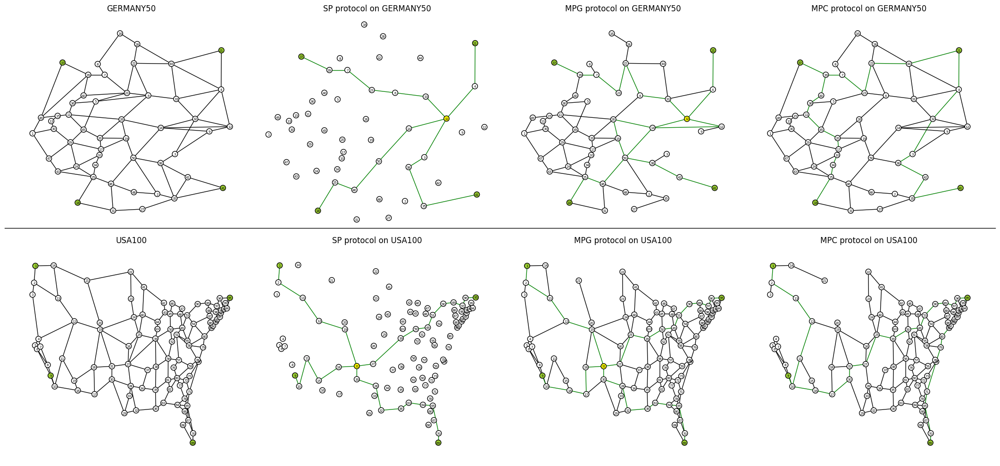

In [21]:
draw_graphs = True
save_graphs = True
run_SP = True
run_MPG = True
run_MPC = True
draw_protocol_graphs = True
save_protocol_graphs = True

# Define the indices you want to process
indices = [17, 30]

# Number of plots per index (real topo + SP + MPG + MPC)
plots_per_index = 4

# Total number of plots
total_plots = len(indices) * plots_per_index

# Create a figure with 2 rows and 4 columns
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(21, 10))
axes = axes.flatten()  # Flatten to easily iterate over

plot_idx = 0  # To keep track of the current subplot

for i in indices:
    
    center_for_color = get_source_and_star(real_topo[i], real_topo_users[i], 'weight')[0]
    
    real_topo_colors[i] = node_colors(real_topo[i], real_topo_users[i], center_for_color)
    real_topo_colors_no_cent[i] = node_colors(real_topo[i], real_topo_users[i])
    
    # Real Topology Plot
    ax = axes[plot_idx]
    nx.draw(
        real_topo[i],
        pos=pos[i],
        with_labels=True,
        edgecolors='black',
        node_color=real_topo_colors_no_cent[i],
        font_size=5,
        node_size=70,
        ax=ax
    )
    weights = nx.get_edge_attributes(real_topo[i], 'weight')
    ax.set_title(f'{file_names[i]}')
    plot_idx += 1
    
    # SP Protocol Plot
    if run_SP:
        SP_output = protocol('SP', real_topo[i], real_topo_users[i], prtcl)
        if SP_output is not None:
            ax = axes[plot_idx]
            nx.draw(
                SP_output[0],
                with_labels=True,
                edgecolors='black',
                edge_color='green',
                font_size=5,
                node_size=70,
                pos=pos[i],
                node_color=real_topo_colors[i],
                ax=ax
            )
            ax.set_title(f'SP protocol on {file_names[i]}')
            plot_idx += 1
        else:
            print('SP not found')
            # Optionally, you can skip plotting or leave it blank
            plot_idx += 1  # To maintain grid structure
    
    # MPG Protocol Plot
    if run_MPG:
        MPG_output = protocol('MPG', real_topo[i], real_topo_users[i], prtcl)
        if MPG_output is not None:
            MPG_e_colors = [
                'green' if (e[0:2] in MPG_output[2] or e[0:2][::-1] in MPG_output[2]) else 'black'
                for e in MPG_output[0].edges()
            ]
            ax = axes[plot_idx]
            nx.draw(
                MPG_output[0],
                with_labels=True,
                edge_color=MPG_e_colors,
                edgecolors='black',
                font_size=5,
                node_size=70,
                pos=pos[i],
                node_color=real_topo_colors[i],
                ax=ax
            )
            ax.set_title(f'MPG protocol on {file_names[i]}')
            plot_idx += 1
        else:
            print('MPG not found')
            plot_idx += 1
    
    # MPC Protocol Plot
    if run_MPC:
        MPC_output = protocol('MPC', real_topo[i], real_topo_users[i], prtcl)
        if MPC_output is not None:
            print(type(MPC_output[2]))
            
            MPC_e_colors = [
                'green' if (e in MPC_output[2].edges() or e[::-1] in MPC_output[2].edges()) else 'black'
                for e in MPC_output[0].edges()
            ]
            ax = axes[plot_idx]
            nx.draw(
                MPC_output[0],
                with_labels=True,
                edge_color=MPC_e_colors,
                edgecolors='black',
                font_size=5,
                node_size=70,
                pos=pos[i],
                node_color=real_topo_colors_no_cent[i],
                ax=ax
            )
            ax.set_title(f'MPC protocol on {file_names[i]}')
            plot_idx += 1
        else:
            print('MPC not found')
            plot_idx += 1

# If there are any unused subplots, you can hide them
for j in range(plot_idx, len(axes)):
    fig.delaxes(axes[j])

horizontal_line = lines.Line2D([0, 1], [0.51, 0.51], color='black', linewidth=1, transform=fig.transFigure, zorder=10)
fig.add_artist(horizontal_line)

plt.tight_layout()
plt.show()

<class 'networkx.classes.graph.Graph'>
<class 'networkx.classes.graph.Graph'>


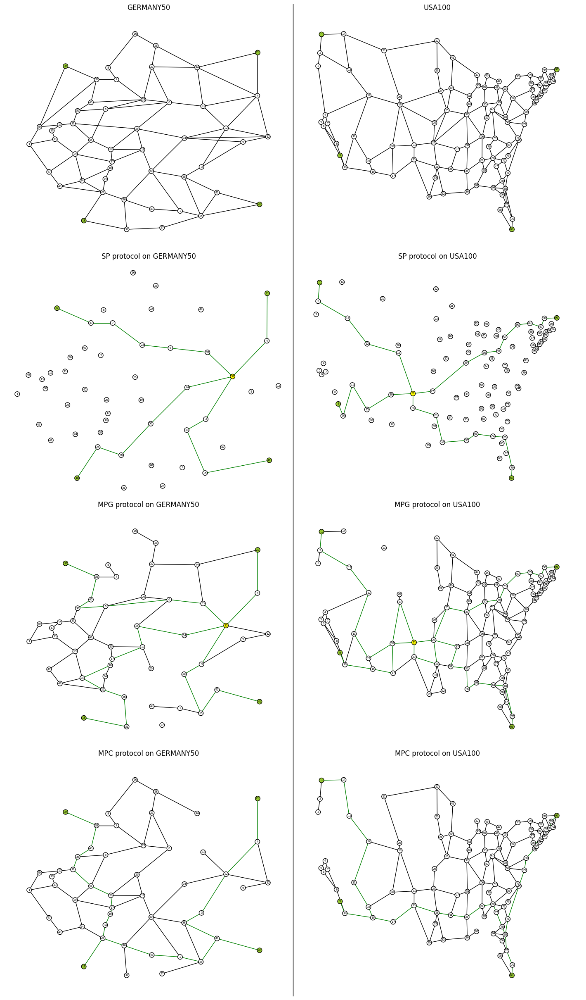

In [22]:
from matplotlib import lines

indices = [17, 30]

# Number of plots per index (real topo + SP + MPG + MPC)
plots_per_index = 4

# Total number of plots
total_plots = len(indices) * plots_per_index  # 2 indices * 4 plots each = 8 plots

# Create a figure with 4 rows and 2 columns
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(14, 24))

# Convert axes to a 2D array for easier manipulation
axes = axes.reshape(4, 2)

# To fill subplots column-wise, we need to iterate through columns first
# Create a list of subplot axes in column-major order
column_major_axes = []
for col in range(axes.shape[1]):
    for row in range(axes.shape[0]):
        column_major_axes.append(axes[row, col])

plot_idx = 0  # To keep track of the current subplot

for i in indices:
    # Center for color determination
    center_for_color = get_source_and_star(real_topo[i], real_topo_users[i], 'weight')[0]
    
    real_topo_colors[i] = node_colors(real_topo[i], real_topo_users[i], center_for_color)
    real_topo_colors_no_cent[i] = node_colors(real_topo[i], real_topo_users[i])
    
    # ---------------------
    # 1. Real Topology Plot
    # ---------------------
    ax = column_major_axes[plot_idx]
    nx.draw(
        real_topo[i],
        pos=pos[i],
        with_labels=True,
        edgecolors='black',
        node_color=real_topo_colors_no_cent[i],
        font_size=5,
        node_size=70,
        ax=ax
    )
    weights = nx.get_edge_attributes(real_topo[i], 'weight')
    ax.set_title(f'{file_names[i]}', fontsize=12)  # Increased fontsize for clarity
    plot_idx += 1
    
    # ---------------------
    # 2. SP Protocol Plot
    # ---------------------
    if run_SP:
        SP_output = protocol('SP', real_topo[i], real_topo_users[i], prtcl)
        if SP_output is not None:
            ax = column_major_axes[plot_idx]
            nx.draw(
                SP_output[0],
                with_labels=True,
                edgecolors='black',
                edge_color='green',
                font_size=5,
                node_size=70,
                pos=pos[i],
                node_color=real_topo_colors[i],
                ax=ax
            )
            ax.set_title(f'SP protocol on {file_names[i]}', fontsize=12)
            plot_idx += 1
        else:
            print(f'SP not found for index {i}')
            # Indicate absence in the subplot
            ax = column_major_axes[plot_idx]
            ax.axis('off')
            ax.set_title(f'SP protocol on {file_names[i]}: Not Found', fontsize=12)
            plot_idx += 1
    
    # ---------------------
    # 3. MPG Protocol Plot
    # ---------------------
    if run_MPG:
        MPG_output = protocol('MPG', real_topo[i], real_topo_users[i], prtcl)
        if MPG_output is not None:
            MPG_e_colors = [
                'green' if (e[0:2] in MPG_output[2] or e[0:2][::-1] in MPG_output[2]) else 'black'
                for e in MPG_output[0].edges()
            ]
            ax = column_major_axes[plot_idx]
            nx.draw(
                MPG_output[0],
                with_labels=True,
                edge_color=MPG_e_colors,
                edgecolors='black',
                font_size=5,
                node_size=70,
                pos=pos[i],
                node_color=real_topo_colors[i],
                ax=ax
            )
            ax.set_title(f'MPG protocol on {file_names[i]}', fontsize=12)
            plot_idx += 1
        else:
            print(f'MPG not found for index {i}')
            ax = column_major_axes[plot_idx]
            ax.axis('off')
            ax.set_title(f'MPG protocol on {file_names[i]}: Not Found', fontsize=12)
            plot_idx += 1
    
    # ---------------------
    # 4. MPC Protocol Plot
    # ---------------------
    if run_MPC:
        MPC_output = protocol('MPC', real_topo[i], real_topo_users[i], prtcl)
        if MPC_output is not None:
            print(type(MPC_output[2]))
            
            MPC_e_colors = [
                'green' if (e in MPC_output[2].edges() or e[::-1] in MPC_output[2].edges()) else 'black'
                for e in MPC_output[0].edges()
            ]
            ax = column_major_axes[plot_idx]
            nx.draw(
                MPC_output[0],
                with_labels=True,
                edge_color=MPC_e_colors,
                edgecolors='black',
                font_size=5,
                node_size=70,
                pos=pos[i],
                node_color=real_topo_colors_no_cent[i],
                ax=ax
            )
            ax.set_title(f'MPC protocol on {file_names[i]}', fontsize=12)
            plot_idx += 1
        else:
            print(f'MPC not found for index {i}')
            ax = column_major_axes[plot_idx]
            ax.axis('off')
            ax.set_title(f'MPC protocol on {file_names[i]}: Not Found', fontsize=12)
            plot_idx += 1

# Adjust the spacing between subplots
plt.tight_layout(pad=0, w_pad=0, h_pad=0.5)

# ---------------------
# 5. Add Vertical Line
# ---------------------
# Add a vertical line between the two columns
# The line will be at x=0.5 in figure coordinates

vertical_line = lines.Line2D([0.5, 0.5], [0, 1], color='black', linewidth=1, transform=fig.transFigure, zorder=10)
fig.add_artist(vertical_line)
plt.show()

In [23]:
# test evan's flow implementation vs old implementation

real_topo_users = {}
real_topo_colors = {}
real_topo_colors_no_cent = {}

real_topo_users = {0: (4, 22, 25, 41), 1: (1, 3, 5, 6), 2: (1, 7, 15, 17), 3: (3, 7, 9, 11),  4: (11, 13, 17, 18), 5: (1, 7, 9, 11), 6: (2, 3, 10, 11), 7: (2, 16, 17, 19), 8: (1, 2, 11, 12), 10: (2, 8, 15, 16), 11: (5, 116, 133, 138), 12: (5, 13, 15, 17), 13: (5, 13, 15, 23), 14: (5, 13, 18, 19), 16: (1, 6, 8, 12), 17: (18, 21, 37, 41), 19: (1, 2, 3, 6), 21: (1, 13, 14, 30), 22: (1, 7, 12, 25), 26: (16, 17, 19, 23), 27: (8, 28, 40, 49), 28: (14, 15, 16, 21), 29: (11, 35, 61, 63), 30: (1, 9, 69, 95), 33: (1, 7, 13, 15), 34: (1, 2, 47, 48), 35: (1, 2, 3, 26), 36: (10, 21, 24, 29), 37: (5, 6, 15, 21), 38: (1, 2, 8, 9), 39: (1, 4, 13, 14), 40: (1, 5, 11, 17), 41: (16, 17, 19, 23), 42: (5, 11, 14, 15), 43: (18, 24, 28, 29), 45: (8, 10, 16, 19), 47: (2, 11, 16, 30), 48: (9, 10, 11, 13), 49: (8, 35, 96, 97), 50: (13, 23, 27, 31), 51: (3, 4, 14, 18), 52: (26, 27, 46, 52), 54: (4, 5, 17, 25), 55: (24, 29, 30, 45), 57: (4, 11, 13, 35), 58: (11, 18, 20, 28), 61: (1, 2, 23, 25), 62: (1, 3, 10, 14), 63: (9, 22, 42, 43), 64: (1, 5, 17, 18), 65: (1, 4, 10, 13), 67: (12, 16, 18, 19), 68: (1, 7, 13, 19), 70: (9, 12, 22, 34), 71: (9, 22, 31, 51), 72: (9, 13, 17, 20), 76: (8, 9, 16, 18), 77: (1, 13, 15, 32), 79: (1, 2, 24, 25), 80: (1, 11, 12, 18), 81: (3, 13, 15, 27), 82: (4, 6, 7, 8), 83: (4, 5, 9, 12), 84: (1, 4, 5, 14), 86: (2, 5, 8, 10), 88: (15, 19, 25, 30), 89: (1, 11, 14, 17), 90: (4, 6, 10, 16), 92: (1, 8, 15, 19), 93: (8, 28, 40, 49), 94: (1, 2, 8, 27), 95: (2, 3, 11, 21), 96: (8, 12, 16, 18), 97: (6, 11, 13, 20), 98: (5, 8, 12, 19), 100: (3, 6, 9, 10), 101: (2, 12, 16, 23), 102: (1, 4, 6, 7), 104: (7, 20, 22, 24)}

algo_sum_l = []

for i in range(len(real_topo)):

    # print(f'\nrunning {str(i)}: {file_names[i]}')

    if i in bad_indices:
         # print(f'Graph {file_names[i]} is problematic.')
         continue
    if i in temp_filter:
         # print(f'skip {file_names[i]} for now')
         continue
    
    #real_topo_users[i] = find_users(real_topo[i],4)
    # this takes a while - the results are already saved as a variable.

    SP_old = protocol('SP',real_topo[i],real_topo_users[i],'old')
    old_disj_paths_edges = SP_old[2]
    old_center = find_center_node(real_topo[i],real_topo_users[i])[0]
    
    flow_output_hops = get_source_and_star(real_topo[i],real_topo_users[i],'hops')
    flow_hops_center = flow_output_hops[0]
    flow_hops_disj_paths = flow_output_hops[1]
    flow_hops_disj_paths_edges = [list(zip(path, path[1:])) for path in flow_hops_disj_paths]
    flow_hops_disj_paths_edges = [edge for edges in flow_hops_disj_paths_edges for edge in edges]

    flow_output_weight = get_source_and_star(real_topo[i],real_topo_users[i],'weight')
    flow_length_center = flow_output_weight[0]
    flow_length_disj_paths = flow_output_weight[1]
    flow_length_disj_paths_edges = [list(zip(path, path[1:])) for path in flow_length_disj_paths]
    flow_length_disj_paths_edges = [edge for edges in flow_length_disj_paths_edges for edge in edges]

    flow_output_p = get_source_and_star(real_topo[i],real_topo_users[i],'p')
    flow_p_center = flow_output_p[0]
    flow_p_disj_paths = flow_output_p[1]
    flow_p_disj_paths_edges = [list(zip(path, path[1:])) for path in flow_p_disj_paths]
    flow_p_disj_paths_edges = [edge for edges in flow_p_disj_paths_edges for edge in edges]

    
    # Collect centers and disjoint path edges in dictionaries
    method_centers = {
        'old': old_center,
        'flow_hops': flow_hops_center,
        'flow_length': flow_length_center,
        'flow_p': flow_p_center
    }

    method_disj_paths_edges = {
        'old': old_disj_paths_edges,
        'flow_hops': flow_hops_disj_paths_edges,
        'flow_length': flow_length_disj_paths_edges,
        'flow_p': flow_p_disj_paths_edges
    }

    methods = ['old', 'flow_hops', 'flow_length', 'flow_p']
    method_colors = {
        'old': 'red',
        'flow_hops': 'blue',
        'flow_length': 'orange',
        'flow_p': 'purple'
    }

    # Set up the plotting
    draw_graphs = False
    save_graphs = False
    if draw_graphs:
        fig, axes = plt.subplots(1, 4, figsize=(20, 5))
        for idx, method in enumerate(methods):
            ax = axes[idx]
            method_color = method_colors[method]
            center_node = method_centers[method]
            disj_edges_list = method_disj_paths_edges[method]

            # Create a set of edges with sorted node pairs for consistent comparison
            disj_edges = set((min(u, v), max(u, v)) for u, v in disj_edges_list)

            # Assign node colors
            node_colors_l = []
            nodes = list(real_topo[i].nodes())
            for node in nodes:
                if node in real_topo_users[i]:
                    node_colors_l.append('yellowgreen')  # User nodes
                elif node == center_node:
                    node_colors_l.append(method_color)  # Center node in method's color
                else:
                    node_colors_l.append('white')  # Other nodes

            # Assign edge colors
            edge_colors_l = []
            edges = list(real_topo[i].edges())
            for e in edges:
                edge = (min(e[0], e[1]), max(e[0], e[1]))
                if edge in disj_edges:
                    edge_colors_l.append(method_color)  # Disjoint path edges in method's color
                else:
                    edge_colors_l.append('black')  # Other edges

            # Draw the graph
            nx.draw(
                real_topo[i],
                pos=pos[i],
                with_labels=True,
                edge_color=edge_colors_l,
                edgecolors='black',
                node_color=node_colors_l,
                font_size=5,
                node_size=70,
                ax=ax
            )
            ax.set_title(f'{method}')

        plt.suptitle(f'{i}_{file_names[i]}')
        if save_graphs:
            plt.savefig('images\\real_topo_img\\SP+center_flow_compare\\' + f'{i}_{file_names[i]}_comparison.png', bbox_inches='tight')
        plt.show()

    algo_sum_d = {}

    algo_sum_d['old'] = sum(real_topo[i][u][v].get('weight') for u, v in method_disj_paths_edges['old'])
    algo_sum_d['flow_hops'] = sum(real_topo[i][u][v].get('weight') for u, v in method_disj_paths_edges['flow_hops'])
    algo_sum_d['flow_length'] = sum(real_topo[i][u][v].get('weight') for u, v in method_disj_paths_edges['flow_length'])
    algo_sum_d['flow_p'] = sum(real_topo[i][u][v].get('weight') for u, v in method_disj_paths_edges['flow_p'])

    algo_sum_l.append(algo_sum_d)

In [24]:
pd.set_option('display.max_rows', None)
display(pd.DataFrame(algo_sum_l))

,old,flow_hops,flow_length,flow_p
0,1294.594595,1255.405405,1255.405405,1255.405405
1,254.507578,254.507578,254.507578,254.507578
2,424.757228,434.828044,411.408101,434.828044
3,283.548092,283.548092,283.548092,283.548092
4,455.085444,455.085444,455.085444,455.085444
5,469.739081,438.003403,438.003403,573.312535
6,416.565524,416.565524,416.565524,416.565524
7,356.473507,366.558441,366.558441,366.558441
8,436.093601,450.468004,450.468004,470.047755
9,537.056889,537.056889,537.056889,537.056889


### Iterating simulations + saving to files

In [25]:
real_topo_users = {0: (4, 22, 25, 41), 1: (1, 3, 5, 6), 2: (1, 7, 15, 17), 3: (3, 7, 9, 11),  4: (11, 13, 17, 18), 5: (1, 7, 9, 11), 6: (2, 3, 10, 11), 7: (2, 16, 17, 19), 8: (1, 2, 11, 12), 10: (2, 8, 15, 16), 11: (5, 116, 133, 138), 12: (5, 13, 15, 17), 13: (5, 13, 15, 23), 14: (5, 13, 18, 19), 16: (1, 6, 8, 12), 17: (18, 21, 37, 41), 19: (1, 2, 3, 6), 21: (1, 13, 14, 30), 22: (1, 7, 12, 25), 26: (16, 17, 19, 23), 27: (8, 28, 40, 49), 28: (14, 15, 16, 21), 29: (11, 35, 61, 63), 30: (1, 9, 69, 95), 33: (1, 7, 13, 15), 34: (1, 2, 47, 48), 35: (1, 2, 3, 26), 36: (10, 21, 24, 29), 37: (5, 6, 15, 21), 38: (1, 2, 8, 9), 39: (1, 4, 13, 14), 40: (1, 5, 11, 17), 41: (16, 17, 19, 23), 42: (5, 11, 14, 15), 43: (18, 24, 28, 29), 45: (8, 10, 16, 19), 47: (2, 11, 16, 30), 48: (9, 10, 11, 13), 49: (8, 35, 96, 97), 50: (13, 23, 27, 31), 51: (3, 4, 14, 18), 52: (26, 27, 46, 52), 54: (4, 5, 17, 25), 55: (24, 29, 30, 45), 57: (4, 11, 13, 35), 58: (11, 18, 20, 28), 61: (1, 2, 23, 25), 62: (1, 3, 10, 14), 63: (9, 22, 42, 43), 64: (1, 5, 17, 18), 65: (1, 4, 10, 13), 67: (12, 16, 18, 19), 68: (1, 7, 13, 19), 70: (9, 12, 22, 34), 71: (9, 22, 31, 51), 72: (9, 13, 17, 20), 76: (8, 9, 16, 18), 77: (1, 13, 15, 32), 79: (1, 2, 24, 25), 80: (1, 11, 12, 18), 81: (3, 13, 15, 27), 82: (4, 6, 7, 8), 83: (4, 5, 9, 12), 84: (1, 4, 5, 14), 86: (2, 5, 8, 10), 88: (15, 19, 25, 30), 89: (1, 11, 14, 17), 90: (4, 6, 10, 16), 92: (1, 8, 15, 19), 93: (8, 28, 40, 49), 94: (1, 2, 8, 27), 95: (2, 3, 11, 21), 96: (8, 12, 16, 18), 97: (6, 11, 13, 20), 98: (5, 8, 12, 19), 100: (3, 6, 9, 10), 101: (2, 12, 16, 23), 102: (1, 4, 6, 7), 104: (7, 20, 22, 24)}
presave_centers = {}
presave_disjpaths = {}

for i in range(len(real_topo)):
    if i in bad_indices or i in temp_filter:
        continue

    flow_length_output = get_source_and_star(real_topo[i],real_topo_users[i],'weight')
    presave_centers[i] = flow_length_output[0]
    presave_disjpaths[i] = flow_length_output[1]
    
print(presave_centers)

{0: 35, 1: 2, 2: 26, 3: 12, 4: 8, 5: 1, 6: 9, 7: 12, 8: 7, 10: 11, 11: 81, 12: 12, 13: 12, 14: 18, 16: 3, 17: 32, 19: 7, 21: 12, 22: 9, 26: 14, 27: 24, 28: 1, 29: 22, 30: 31, 33: 12, 34: 28, 35: 11, 36: 26, 37: 13, 38: 7, 39: 8, 40: 2, 41: 14, 42: 17, 43: 20, 45: 4, 47: 1, 48: 12, 49: 32, 50: 33, 51: 14, 54: 21, 55: 14, 57: 31, 58: 23, 61: 7, 62: 4, 63: 30, 64: 4, 65: 7, 68: 9, 70: 26, 71: 30, 72: 18, 76: 1, 77: 12, 79: 17, 81: 10, 82: 9, 83: 6, 84: 11, 86: 6, 88: 18, 89: 18, 92: 15, 93: 24, 94: 15, 95: 13, 96: 22, 97: 10, 98: 16, 100: 3, 101: 11, 102: 2, 104: 1}


In [27]:
# flow p
for i in range(len(real_topo)):
    continue 
    # comment this to run
    
    if i in bad_indices or i in temp_filter:
        continue
    if i not in [68,77]:
        continue

    filepath_mpg_rep = f'data\\rep_usage_data\\legacy\\MPG_flow_p\\MPG_flow_p_reps_{i}.txt'
    filepath_sp_iter = f'data\\iterations\\full\\legacy\\SP_flow_p\\SP_flow_p_iters_{i}.txt'
    filepath_mpg_iter = f'data\\iterations\\full\\legacy\\MPG_flow_p\\MPG_flow_p_iters_{i}.txt'
    with open(filepath_mpg_rep, 'a') as file_mpg_rep, \
        open(filepath_sp_iter, 'a') as file_sp_iter, \
        open(filepath_mpg_iter, 'a') as file_mpg_iter:
        
        for _ in tqdm(range(1000)):
            SP_output_presaved = protocol('SP',real_topo[i],real_topo_users[i],'flow_p')
            MPG_output_presaved = protocol('MPG',real_topo[i],real_topo_users[i],'flow_p')

            traversed_reps_mpg = {n for sublist in MPG_output_presaved[2] for n in sublist}
            file_mpg_rep.write(f"{traversed_reps_mpg}\n")

            file_sp_iter.write(f"{SP_output_presaved[1]},")
            file_mpg_iter.write(f"{MPG_output_presaved[1]},")
    
    #clear_output(wait=True)
    #print(f'iteration {loop_counter} complete...')
    print(f'file {i} complete...')
            

In [28]:
# flow length + MPC
for i in range(len(real_topo)):
    continue 
    # comment this to run

    if i in bad_indices or i in temp_filter:
        continue

    filepath_mpg_rep = f'data\\rep_usage_data\\MPG_flow_length_final\\MPG_flow_length_final_reps_{i}.txt'
    filepath_sp_iter = f'data\\iterations\\full\\SP_flow_length_final\\SP_flow_length_final_iters_{i}.txt'
    filepath_mpg_iter = f'data\\iterations\\full\\MPG_flow_length_final\\MPG_flow_length_final_iters_{i}.txt'
    
    file_mpc_rep = f'data\\rep_usage_data\\MPC\\MPC_reps_{i}.txt'
    file_mpc_iter = f'data\\iterations\\full\\MPC\\MPC_iters_{i}.txt'

    if os.path.isfile(filepath_sp_iter):
        if os.path.getsize(filepath_sp_iter) != 0:
            #print(f'{i} complete!')
            continue

    with open(filepath_mpg_rep, 'a') as file_mpg_rep, \
        open(filepath_sp_iter, 'a') as file_sp_iter, \
        open(filepath_mpg_iter, 'a') as file_mpg_iter, \
        open(file_mpc_rep, 'a') as file_mpc_rep, \
        open(file_mpc_iter, 'a') as file_mpc_iter:
        
        for _ in tqdm(range(5000)):
            SP_output_presaved = protocol('SP',real_topo[i],real_topo_users[i],'flow_length')
            MPG_output_presaved = protocol('MPG',real_topo[i],real_topo_users[i],'flow_length')
            MPC_output_presaved = protocol('MPC',real_topo[i],real_topo_users[i],'')
            
            traversed_reps_mpg = {n for sublist in MPG_output_presaved[2] for n in sublist}
            traversed_reps_mpc = set(MPC_output_presaved[2].nodes())
            
            file_sp_iter.write(f"{SP_output_presaved[1]},")
            file_mpg_iter.write(f"{MPG_output_presaved[1]},")
            file_mpg_rep.write(f"{traversed_reps_mpg}\n")
            file_mpc_rep.write(f"{traversed_reps_mpc}\n")
            file_mpc_iter.write(f"{MPC_output_presaved[1]},") 


    #clear_output(wait=True)
    #print(f'iteration {loop_counter} complete...')
    print(f'file {i} complete...')

## Repeater usage analysis (SP,MPG)

In [29]:
# SP repeaters used:

real_topo_reps_SP = {}

for i in range(len(real_topo)):
    #continue 
    # comment this to run

    if i in bad_indices or i in temp_filter:
        continue

    real_topo_reps_SP[i] = set()
    for e in presave_disjpaths[i]:
        for node in e:
            real_topo_reps_SP[i].add(node)

In [34]:
def node_colors_freq(G,users,center=None,freq_dict={}):
    color_map = []
    for node in G.nodes():
        if node in users:
            color_map.append(matplotlib.colors.to_rgba('yellowgreen'))
        elif node == center:
            color_map.append(matplotlib.colors.to_rgba('yellow'))
        elif node in freq_dict:
            color_map.append((1 - freq_dict[node], 1 - freq_dict[node], 1, 1))
        else:
            color_map.append('white')
    
    return color_map

In [35]:
old_iters_clusters = {1: (11, 28, 33, 40, 43, 54, 58, 61, 65, 79, 81, 83, 94), 
                  2: (0, 1, 5, 6, 7, 8, 10, 13, 14, 19, 34, 35, 36, 38, 39, 42, 45, 50, 57, 62, 82, 95, 97, 102, 104), 
                  3: (2, 3, 12, 22, 26, 27, 37, 41, 47, 55, 64, 71, 76, 88, 93, 101), 
                  4: (4, 16, 17, 21, 29, 30, 48, 49, 51, 63, 70, 72, 84, 86, 89, 92, 96, 98, 100)
                  }        

iters_clusters = {1: (11, 28, 33, 40, 43, 54, 58, 61, 65, 81, 83, 94), 
                  2: (0, 1, 5, 6, 7, 8, 10, 14, 36, 38, 39, 42, 45, 50, 57, 62, 77, 89, 95, 102, 104), 
                  3: (2, 3, 12, 13, 22, 26, 27, 35, 37, 41, 47, 48, 49, 55, 64, 70, 76, 79, 84, 93, 97, 101), 
                  4: (4, 16, 17, 19, 21, 29, 30, 34, 51, 63, 68, 71, 72, 82, 86, 88, 92, 96, 98, 100)}


#### MPG frequency

In [36]:
mpg_reps_fp = r"data\rep_usage_data\MPG_flow_length_final"
mpg_reps_dict = {}

for file in os.listdir(mpg_reps_fp):
    mpg_reps_txt_name = os.fsdecode(file)
    with open(f'{mpg_reps_fp}\\{file}','r') as mpg_reps_txt:
        mpg_reps_txt_data = mpg_reps_txt.read()
        mpg_reps_txt_data = mpg_reps_txt_data.split('\n')
        mpg_reps_l = []
        for line in mpg_reps_txt_data:
            line_l = line[1:-1].split(', ') # [1:-1] to remove the { and }
            line_set = {int(n) for n in line_l if n!=''}
            mpg_reps_l.append(line_set)
        index = int( mpg_reps_txt_name.replace('MPG_flow_length_final_reps_','').replace('.txt','') )
        mpg_reps_l = [s for s in mpg_reps_l if len(s)>0]
        mpg_reps_dict[index] = mpg_reps_l

In [37]:
mpg_rep_freq = {}

# initialise mpg_rep_freq
for i in mpg_reps_dict:
    mpg_rep_freq[i] = {}
    for node in real_topo[i].nodes():
        mpg_rep_freq[i][node] = 0
    
for i in mpg_reps_dict:
    for node in real_topo[i].nodes(): 
        for set_ in mpg_reps_dict[i]:
            if node in set_:
                mpg_rep_freq[i][node] += 1

In [38]:
mpg_node_freq_ratio_dict = {}
for i in mpg_reps_dict:
    temp_freq_ratio_dict = {}
    for node in real_topo[i].nodes():
        temp_freq_ratio_dict[node] = mpg_rep_freq[i][node]/5000
    mpg_node_freq_ratio_dict[i] = temp_freq_ratio_dict

mpg_node_freq_ratio_dict = dict(sorted(mpg_node_freq_ratio_dict.items())) 

In [39]:
cmap = plt.get_cmap('RdYlGn')

for i in mpg_node_freq_ratio_dict:
    continue
    # comment this to plot the graphs

    node_dict = dict(sorted(mpg_node_freq_ratio_dict[i].items(), key=lambda item: item[1], reverse=True))

    node_dict = {key:val for key, val in node_dict.items() if key not in real_topo_users[i]}

    # Create a figure with two subplots (one on top of the other)
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(len(node_dict)/3, 6))

    # Plotting the bar chart on the first subplot
    colors =  ['tab:blue' if v == 1 else cmap(v) for v in node_dict.values()]
    ax1.bar([str(n) for n in list(node_dict.keys())], list(node_dict.values()), color=colors)
    ax1.set_ylabel('Mean # timeshorts')
    ax1.set_xlabel('Node index')
    ax1.tick_params(axis='x', labelsize=8)
    ax1.margins(x=0.005, tight=True)
    ax1.set_title(f'MPG frequency of node usage ({i}_{file_names[i]})')

    # Plotting the line graph on the second subplot
    ax2.plot([str(n) for n in node_dict.keys()], node_dict.values(), marker='o')
    ax2.set_xlabel('Node index')
    ax2.set_ylabel('Frequency')
    ax2.tick_params(axis='x', labelsize=8)
    ax2.margins(x=0.005, tight=True)
    ax2.set_ylim(0, 1.05)

    save_nodefreq_graphs = True
    if save_nodefreq_graphs:
                plt.savefig('images\\node_freq\\MPG_flow_length_final\\' + f'{i}_{file_names[i]}_MPG_node-freq.png', bbox_inches='tight')
    plt.show()

In [40]:
real_topo_colors_mpg_freq = {}

for i in range(len(real_topo)):
    continue
    # comment this to plot the graphs

    print(f'running {str(i)}: {file_names[i]}\n\n')

    if i in bad_indices:
         continue
    if i in temp_filter:
         continue

    real_topo_colors_mpg_freq[i] = node_colors_freq(real_topo[i],real_topo_users[i],presave_centers[i],mpg_node_freq_ratio_dict[i])

    MPG_e_colors = []
    for e in real_topo[i].edges():
        if e[0:2] in presave_disjpaths[i] or e[0:2][::-1] in presave_disjpaths[i]:
            MPG_e_colors.append('green')
        else:
            MPG_e_colors.append('black')

    nx.draw(real_topo[i], pos=pos[i], with_labels=True, edge_color=MPG_e_colors, edgecolors='black', node_color=real_topo_colors_mpg_freq[i], font_size=5, node_size=70)
    plt.title(f'{i}_{file_names[i]}')

    
    save_nodefreq_and_sp = True
    if save_nodefreq_and_sp:
        for clus in iters_clusters:
             if i in iters_clusters[clus]:
                break
        plt.savefig(f'images\\real_topo_img\\MPG_flow_length_final_node_freq+SP_edges\\cluster {clus}\\' + f'{i}_{file_names[i]}_MPG_node_freq+SP_edges.png', bbox_inches='tight')

    plt.show()
    

In [42]:
for i in range(len(real_topo)):
    continue
    # comment this to plot the graphs

    print(f'running {str(i)}: {file_names[i]}\n\n')

    if i in bad_indices:
         continue
    if i in temp_filter:
         continue

    real_topo_colors_mpg_freq[i] = node_colors_freq(real_topo[i],real_topo_users[i],presave_centers[i],mpg_node_freq_ratio_dict[i])

    nx.draw(real_topo[i], pos=pos[i], with_labels=True, edgecolors='black', node_color=real_topo_colors_mpg_freq[i], font_size=5, node_size=70)
    plt.title(f'{i}_{file_names[i]}')
    
    save_nodefreq = False
    if save_nodefreq:
        plt.savefig('images\\real_topo_img\\node_freq\\MPG_flow_length_final\\' + f'{i}_{file_names[i]}_MPG_node_freq.png', bbox_inches='tight')
    plt.show()

#### MPC frequency

In [43]:
mpc_reps_fp = r"data\rep_usage_data\MPC"
mpc_reps_dict = {}

for file in os.listdir(mpc_reps_fp):
    mpc_reps_txt_name = os.fsdecode(file)
    with open(f'{mpc_reps_fp}\\{file}','r') as mpc_reps_txt:
        mpc_reps_txt_data = mpc_reps_txt.read()
        mpc_reps_txt_data = mpc_reps_txt_data.split('\n')
        mpc_reps_l = []
        for line in mpc_reps_txt_data:
            line_l = line[1:-1].split(', ') # [1:-1] to remove the { and }
            line_set = {int(n) for n in line_l if n!=''}
            mpc_reps_l.append(line_set)
        index = int( mpc_reps_txt_name.replace('MPC_reps_','').replace('.txt','') )
        mpc_reps_l = [s for s in mpc_reps_l if len(s)>0]
        mpc_reps_dict[index] = mpc_reps_l

In [44]:
mpc_rep_freq = {}

# initialise mpc_rep_freq
for i in mpc_reps_dict:
    mpc_rep_freq[i] = {}
    for node in real_topo[i].nodes():
        mpc_rep_freq[i][node] = 0
    
for i in mpc_reps_dict:
    for node in real_topo[i].nodes(): 
        for set_ in mpc_reps_dict[i]:
            if node in set_:
                mpc_rep_freq[i][node] += 1

In [45]:
mpc_node_freq_ratio_dict = {}
for i in mpc_reps_dict:
    temp_freq_ratio_dict = {}
    for node in real_topo[i].nodes():
        temp_freq_ratio_dict[node] = mpc_rep_freq[i][node]/5000 # 5000 iterations.
    mpc_node_freq_ratio_dict[i] = temp_freq_ratio_dict

mpc_node_freq_ratio_dict = dict(sorted(mpc_node_freq_ratio_dict.items())) 

In [46]:
cmap = plt.get_cmap('RdYlGn')

for i in mpc_node_freq_ratio_dict:
    continue
    # comment this to plot the graphs

    node_dict = dict(sorted(mpc_node_freq_ratio_dict[i].items(), key=lambda item: item[1], reverse=True))

    node_dict = {key:val for key, val in node_dict.items() if key not in real_topo_users[i]}

    # Create a figure with two subplots (one on top of the other)
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(len(node_dict)/3, 6))

    # Plotting the bar chart on the first subplot
    colors =  ['tab:blue' if v == 1 else cmap(v) for v in node_dict.values()]
    ax1.bar([str(n) for n in list(node_dict.keys())], list(node_dict.values()), color=colors)
    ax1.set_ylabel('Mean # timeshorts')
    ax1.set_xlabel('Node index')
    ax1.tick_params(axis='x', labelsize=8)
    ax1.margins(x=0.005, tight=True)
    ax1.set_title(f'MPC frequency of node usage ({i}_{file_names[i]})')

    # Plotting the line graph on the second subplot
    ax2.plot([str(n) for n in node_dict.keys()], node_dict.values(), marker='o')
    ax2.set_xlabel('Node index')
    ax2.set_ylabel('Frequency')
    ax2.tick_params(axis='x', labelsize=8)
    ax2.margins(x=0.005, tight=True)
    ax2.set_ylim(0, 1.05)

    save_nodefreq_graphs = True
    if save_nodefreq_graphs:
                plt.savefig('images\\node_freq\\MPC\\' + f'{i}_{file_names[i]}_MPC_node-freq.png', bbox_inches='tight')
    plt.show()

In [47]:
real_topo_colors_mpc_freq = {}

for i in range(len(real_topo)):
    continue
    # comment this to plot the graphs

    print(f'running {str(i)}: {file_names[i]}\n\n')

    if i in bad_indices:
         continue
    if i in temp_filter:
         continue

    real_topo_colors_mpc_freq[i] = node_colors_freq(real_topo[i],real_topo_users[i],presave_centers[i],mpc_node_freq_ratio_dict[i])

    nx.draw(real_topo[i], pos=pos[i], with_labels=True, edgecolors='black', node_color=real_topo_colors_mpc_freq[i], font_size=5, node_size=70)
    plt.title(f'{i}_{file_names[i]}')
    
    save_nodefreq = False
    if save_nodefreq:
        plt.savefig('images\\real_topo_img\\node_freq\\MPC\\' + f'{i}_{file_names[i]}_MPC_node_freq.png', bbox_inches='tight')
    plt.show()

In [48]:
real_topo_colors_mpc_freq = {}

for i in range(len(real_topo)):
    continue
    # comment this to plot the graphs

    print(f'running {str(i)}: {file_names[i]}\n\n')

    if i in bad_indices:
         continue
    if i in temp_filter:
         continue

    real_topo_colors_mpc_freq[i] = node_colors_freq(real_topo[i],real_topo_users[i],presave_centers[i],mpc_node_freq_ratio_dict[i])

    MPC_e_colors = []
    for e in real_topo[i].edges():
        if e[0:2] in presave_disjpaths[i] or e[0:2][::-1] in presave_disjpaths[i]:
            MPC_e_colors.append('green')
        else:
            MPC_e_colors.append('black')

    nx.draw(real_topo[i], pos=pos[i], with_labels=True, edge_color=MPC_e_colors, edgecolors='black', node_color=real_topo_colors_mpc_freq[i], font_size=5, node_size=70)
    plt.title(f'{i}_{file_names[i]}')

    save_nodefreq_and_sp = True
    if save_nodefreq_and_sp:
        for clus in iters_clusters:
             if i in iters_clusters[clus]:
                break
        plt.savefig(f'images\\real_topo_img\\MPC_node_freq+SP_edges\\cluster {clus}\\' + f'{i}_{file_names[i]}_MPC_node_freq+SP_edges.png', bbox_inches='tight')

    plt.show()
    

### Repeater removal

In [49]:
trimmed_real_topos_mpg = {}

for p in range(5,50 +1, 5):
    min_usage_frac = round(p/100,2)

    trimmed_real_topos_mpg[min_usage_frac] = {}
    
    for i in range(len(real_topo)):
        
        if i in bad_indices:
            continue
        if i in temp_filter:
            continue
        
        #print(f'running {str(i)}: {file_names[i]}, min usage frac. {min_usage_frac}\n\n')

        trimmed_real_topo = real_topo[i].copy()

        for node in real_topo[i]:
            if mpg_node_freq_ratio_dict[i][node] < min_usage_frac:
                trimmed_real_topo.remove_node(node)

        trimmed_real_topos_mpg[min_usage_frac][i] = trimmed_real_topo
        

        colors = node_colors(trimmed_real_topos_mpg[min_usage_frac][i],real_topo_users[i],presave_centers[i])

        plot_trimmed_graphs = False
        if plot_trimmed_graphs:
            plt.figure()
            nx.draw(trimmed_real_topos_mpg[min_usage_frac][i], pos=pos[i], with_labels=True, edgecolors='black', node_color=colors, font_size=5, node_size = 70)
            plt.title(f'{i}_{file_names[i]}: MUF = {min_usage_frac}')

            save_trimmed_graphs = True
            min_usage_frac_s = str(min_usage_frac)
            if len(min_usage_frac_s) == 3:
                min_usage_frac_s += '0'
            if save_trimmed_graphs:
                plt.savefig('images\\real_topo_img\\trimmed\\MPG_flow_length_final\\' + f'{i}_{file_names[i]}_muf={min_usage_frac_s}.png', bbox_inches='tight')
            plt.close()


trimmed_real_topos_reps_mpg = {}

for muf in trimmed_real_topos_mpg:
    for i in trimmed_real_topos_mpg[muf]:
        trimmed_real_topos_reps_mpg[(i,muf)] = trimmed_real_topos_mpg[muf][i].number_of_nodes()

for i in range(len(real_topo)):
    if i in bad_indices:
        continue
    if i in temp_filter:
        continue
    trimmed_real_topos_reps_mpg[(i,0.0)] = real_topo[i].number_of_nodes()

In [50]:
trimmed_real_topos_mpc = {}

for p in range(5,50 +1, 5):
    min_usage_frac = round(p/100,2)

    trimmed_real_topos_mpc[min_usage_frac] = {}
    
    for i in range(len(real_topo)):
        
        if i in bad_indices:
            continue
        if i in temp_filter:
            continue
        
        #print(f'running {str(i)}: {file_names[i]}, min usage frac. {min_usage_frac}\n\n')

        trimmed_real_topo = real_topo[i].copy()

        for node in real_topo[i]:
            if mpc_node_freq_ratio_dict[i][node] < min_usage_frac:
                trimmed_real_topo.remove_node(node)

        trimmed_real_topos_mpc[min_usage_frac][i] = trimmed_real_topo
        
        colors = node_colors(trimmed_real_topos_mpc[min_usage_frac][i],real_topo_users[i],presave_centers[i])

        plot_trimmed_graphs = False
        if plot_trimmed_graphs:
            plt.figure()
            nx.draw(trimmed_real_topos_mpc[min_usage_frac][i], pos=pos[i], with_labels=True, edgecolors='black', node_color=colors, font_size=5, node_size = 70)
            plt.title(f'{i}_{file_names[i]}: MUF = {min_usage_frac}')

            save_trimmed_graphs = False
            min_usage_frac_s = str(min_usage_frac)
            if len(min_usage_frac_s) == 3:
                min_usage_frac_s += '0'
            if save_trimmed_graphs:
                plt.savefig('images\\real_topo_img\\trimmed\\MPC\\' + f'{i}_{file_names[i]}_muf={min_usage_frac_s}.png', bbox_inches='tight')
            plt.close()


trimmed_real_topos_reps_mpc = {}

for muf in trimmed_real_topos_mpc:
    for i in trimmed_real_topos_mpc[muf]:
        trimmed_real_topos_reps_mpc[(i,muf)] = trimmed_real_topos_mpc[muf][i].number_of_nodes()

for i in range(len(real_topo)):
    if i in bad_indices:
        continue
    if i in temp_filter:
        continue
    trimmed_real_topos_reps_mpc[(i,0.0)] = real_topo[i].number_of_nodes()

In [51]:
print(trimmed_real_topos_reps_mpc)

{(0, 0.05): 34, (1, 0.05): 6, (2, 0.05): 27, (3, 0.05): 12, (4, 0.05): 15, (5, 0.05): 14, (6, 0.05): 11, (7, 0.05): 19, (8, 0.05): 10, (10, 0.05): 16, (11, 0.05): 76, (12, 0.05): 20, (13, 0.05): 17, (14, 0.05): 18, (16, 0.05): 11, (17, 0.05): 47, (19, 0.05): 6, (21, 0.05): 21, (22, 0.05): 24, (26, 0.05): 23, (27, 0.05): 57, (28, 0.05): 23, (29, 0.05): 72, (30, 0.05): 74, (33, 0.05): 12, (34, 0.05): 22, (35, 0.05): 13, (36, 0.05): 31, (37, 0.05): 19, (38, 0.05): 9, (39, 0.05): 9, (40, 0.05): 13, (41, 0.05): 23, (42, 0.05): 13, (43, 0.05): 18, (45, 0.05): 17, (47, 0.05): 37, (48, 0.05): 16, (49, 0.05): 51, (50, 0.05): 27, (51, 0.05): 19, (54, 0.05): 29, (55, 0.05): 38, (57, 0.05): 29, (58, 0.05): 16, (61, 0.05): 23, (62, 0.05): 11, (63, 0.05): 36, (64, 0.05): 17, (65, 0.05): 14, (68, 0.05): 17, (70, 0.05): 33, (71, 0.05): 54, (72, 0.05): 17, (76, 0.05): 15, (77, 0.05): 21, (79, 0.05): 17, (81, 0.05): 28, (82, 0.05): 15, (83, 0.05): 9, (84, 0.05): 14, (86, 0.05): 15, (88, 0.05): 17, (89, 

#### Iterate

In [52]:
def process_task(args):
    from trimmed_iters_funcs import disjoint_path_priority,find_disjoint_path_edges,make_star_from_paths,is_valid_star,get_source_and_star,users_connected_center_disj,users_connected,check_disjoint_flow,protocol_presave

    protocol, topo, users, index = args
    trimmed_output_presaved = protocol_presave(protocol, topo, users, index)
    return trimmed_output_presaved[1]  # Returning the specific result

def parallel_mpg_processing(G, users, i, iters):
    tasks = [('MPG', G, users, i) for _ in range(iters)]
    # Use Pool to parallelize the execution
    with mp.Pool(mp.cpu_count()) as pool:
        results = list(tqdm(pool.imap(process_task, tasks), total=len(tasks)))
        #results = pool.map(process_task, tasks)
    return results

def parallel_mpc_processing(G, users, i, iters):
    tasks = [('MPC', G, users, i) for _ in range(iters)]
    # Use Pool to parallelize the execution
    with mp.Pool(mp.cpu_count()) as pool:
        results = list(tqdm(pool.imap(process_task, tasks), total=len(tasks)))
        #results = pool.map(process_task, tasks)
    return results

In [53]:
mpg_cant = [(43,0.5)]

for i in range(len(real_topo)):
    if i in bad_indices or i in temp_filter:
        continue

    for p in range(5,50+5,5):
        min_usage_frac = round(p/100,2)
        
        min_usage_frac_s = str(min_usage_frac)
        if len(min_usage_frac_s) == 3:
            min_usage_frac_s += '0'
        filepath_mpg_nodefreq = f'data\\iterations\\trimmed\\MPG_flow_length_final\\MPG_reps_{i}_muf={min_usage_frac_s}.txt'

        if not os.path.exists(filepath_mpg_nodefreq):

            if nx.is_connected(trimmed_real_topos_mpg[min_usage_frac][i]) and (i,min_usage_frac) not in mpg_cant:
                clear_output(wait=True)
                print(f'{i}_{file_names[i]} - p = {min_usage_frac}:')
                real_topo_trimmed_iters_l_MPG = parallel_mpg_processing(trimmed_real_topos_mpg[min_usage_frac][i], real_topo_users[i], i, 5000)

                with open(filepath_mpg_nodefreq, 'a') as file_trimmed_mpg_iter:
                        wr = str(real_topo_trimmed_iters_l_MPG)[1:-1]
                        file_trimmed_mpg_iter.write(wr)
                        
            elif not nx.is_connected(trimmed_real_topos_mpg[min_usage_frac][i]):
                with open(filepath_mpg_nodefreq, 'a') as file_trimmed_mpc_iter:
                    file_trimmed_mpc_iter.write('disconnected')
                clear_output(wait=True)
                print(f'{i}_{file_names[i]} - p = {min_usage_frac}:\ndisconnected')
            else:
                with open(filepath_mpg_nodefreq, 'a') as file_trimmed_mpc_iter:
                    file_trimmed_mpc_iter.write('MPG impossible')
                clear_output(wait=True)
                print(f'{i}_{file_names[i]} - p = {min_usage_frac}:\nfiltered')
    
    
    print(f'{i}_{file_names[i]} complete!')

0_SANET complete!
1_LAYER42 complete!
2_BEYONDTHENETWORK complete!
3_NSFNET13 complete!
4_CANARIE complete!
5_DT17 complete!
6_ERNET complete!
7_CANARIE complete!
8_JPN12 complete!
10_ARNES complete!
11_TATANID complete!
12_RENATER2004 complete!
13_RENATER2001 complete!
14_CWIX complete!
16_CESNET complete!
17_GERMANY50 complete!
19_NETRAIL complete!
21_GEANT2 complete!
22_RENATER complete!
26_RENATER2008 complete!
27_CONUS6079 complete!
28_GTSPOLAND complete!
29_CONUS75 complete!
30_USA100 complete!
33_RENATER1999 complete!
34_JPN48 complete!
35_PORTUGAL complete!
36_DIGEX complete!
37_ITALY complete!
38_VIA complete!
39_REDCLARA complete!
40_ANS complete!
41_RENATER2006 complete!
42_REDIRIS complete!
43_BICS complete!
45_INTEGRA complete!
47_COST complete!
48_OXFORD complete!
49_CONUS100 complete!
50_CRLNETWORKSERVICES complete!
51_ARPANET complete!
54_LONI complete!
55_PALMETTO complete!
57_NETWORKUSA complete!
58_BIZNET complete!
61_JANOSUS complete!
62_CLARANET complete!
63_IRIS c

In [54]:
for i in range(len(real_topo)):
    if i in bad_indices or i in temp_filter:
        continue
    if i not in [68,77]:
        continue
    for p in range(5,50+5,5):
        min_usage_frac = round(p/100,2)

        min_usage_frac_s = str(min_usage_frac)
        if len(min_usage_frac_s) == 3:
            min_usage_frac_s += '0'
        filepath_mpc_nodefreq = f'data\\iterations\\trimmed\\MPC\\MPC_reps_{i}_muf={min_usage_frac_s}.txt'

        if not os.path.exists(filepath_mpc_nodefreq):
            G_temp = trimmed_real_topos_mpc[min_usage_frac][i].copy()

            for node in trimmed_real_topos_mpc[min_usage_frac][i].nodes():
                if all([not nx.has_path(trimmed_real_topos_mpc[min_usage_frac][i], node,user) for user in real_topo_users[i]]):
                    G_temp.remove_node(node)

            
            if nx.is_connected(G_temp):
                print(f'{i}_{file_names[i]} - p = {min_usage_frac}:')
                real_topo_trimmed_iters_l_MPC = parallel_mpc_processing(trimmed_real_topos_mpc[min_usage_frac][i], real_topo_users[i], i, 5000)
                
                with open(filepath_mpc_nodefreq, 'a') as file_trimmed_mpc_iter:
                    wr = str(real_topo_trimmed_iters_l_MPC)[1:-1]
                    file_trimmed_mpc_iter.write(wr)

                clear_output(wait=True)
            
            else:
                with open(filepath_mpc_nodefreq, 'a') as file_trimmed_mpc_iter:
                    file_trimmed_mpc_iter.write('disconnected')
                clear_output(wait=True)
                print(print(f'{i}_{file_names[i]} - p = {min_usage_frac}:\ndisconnected'))

    print(f'{i}_{file_names[i]} complete!')

68_MEMOREX complete!
77_METRONA complete!


In [55]:
sp_iters_fp = r"data\\iterations\full\SP_flow_length_final"
mpg_iters_fp = r"data\iterations\full\MPG_flow_length_final"
mpc_iters_fp = r"data\iterations\full\MPC"

sp_iters_dict = {}
mpg_iters_dict = {}
mpc_iters_dict = {}

for file in os.listdir(sp_iters_fp):
    sp_iters_txt_name = os.fsdecode(file)
    with open(f'{sp_iters_fp}\\{file}','r') as sp_txt:
        sp_txt_data = sp_txt.read()
        sp_iters_str = sp_txt_data.split(',')
        sp_iters_l = list(sp_iters_str)
        sp_iters_l = [int(n) for n in sp_iters_l if n!='']
        index = int( sp_iters_txt_name.replace('SP_flow_length_final_iters_','').replace('.txt','') )
        sp_iters_dict[index] = sp_iters_l
    
for file in os.listdir(mpg_iters_fp):
    mpg_iters_txt_name = os.fsdecode(file)
    with open(f'{mpg_iters_fp}\\{file}','r') as mpg_txt:
        mpg_txt_data = mpg_txt.read()
        mpg_iters_str = mpg_txt_data.split(',')
        mpg_iters_l = list(mpg_iters_str)
        mpg_iters_l = [int(n) for n in mpg_iters_l if n!='']
        index = int( mpg_iters_txt_name.replace('MPG_flow_length_final_iters_','').replace('.txt','') )
        mpg_iters_dict[index] = mpg_iters_l

for file in os.listdir(mpc_iters_fp):
    mpc_iters_txt_name = os.fsdecode(file)
    with open(f'{mpc_iters_fp}\\{file}','r') as mpc_txt:
        mpc_txt_data = mpc_txt.read()
        mpc_iters_str = mpc_txt_data.split(',')
        mpc_iters_l = list(mpc_iters_str)
        mpc_iters_l = [int(n) for n in mpc_iters_l if n!='']
        index = int( mpc_iters_txt_name.replace('MPC_iters_','').replace('.txt','') )
        mpc_iters_dict[index] = mpc_iters_l


sp_iters_mean_dict = {key: np.mean(val) for key,val in sp_iters_dict.items()}
mpg_iters_mean_dict = {key: np.mean(val) for key,val in mpg_iters_dict.items()}
mpc_iters_mean_dict = {key: np.mean(val) for key,val in mpc_iters_dict.items()} 

In [56]:
real_topos_good = [n for n in range(len(real_topo)) if n not in bad_indices and n not in temp_filter]

In [57]:
# MPG trimming

mpg_trimmed_iters_fp = r"data\iterations\trimmed\MPG_flow_length_final"
mpg_trimmed_iters_dict = {n:{} for n in real_topos_good}

for file in os.listdir(mpg_trimmed_iters_fp):
    mpg_trimmed_txt_name = os.fsdecode(file)
    mpg_trimmed_txt_name = mpg_trimmed_txt_name.split('_')

    i = int(mpg_trimmed_txt_name[2])
    muf = float(mpg_trimmed_txt_name[3].replace('muf=','').replace('.txt',''))

    with open(f'{mpg_trimmed_iters_fp}\\{file}','r') as mpg_trimmed_file:
        mpg_trimmed_iters_text = mpg_trimmed_file.read()
        mpg_trimmed_iters_data = mpg_trimmed_iters_text.split(',')

        if len(mpg_trimmed_iters_data) == 5000:
            mpg_trimmed_iters_data_l = [int(n) for n in mpg_trimmed_iters_data]
            mean = np.mean(mpg_trimmed_iters_data_l)
            
        elif len(mpg_trimmed_iters_data) == 1:
            mean = np.inf
        
        mpg_trimmed_iters_dict[i][muf] = mean

    mpg_trimmed_iters_dict[i][0] = mpg_iters_mean_dict[i]

In [58]:
# MPC trimming
 
mpc_trimmed_iters_fp = r"data\iterations\trimmed\MPC"
mpc_trimmed_iters_dict = {n:{} for n in real_topos_good}

for file in os.listdir(mpc_trimmed_iters_fp):


    mpc_trimmed_txt_name = os.fsdecode(file)
    mpc_trimmed_txt_name = mpc_trimmed_txt_name.split('_')

    i = int(mpc_trimmed_txt_name[2])
    muf = float(mpc_trimmed_txt_name[3].replace('muf=','').replace('.txt',''))

    with open(f'{mpc_trimmed_iters_fp}\\{file}','r') as mpc_trimmed_file:
        mpc_trimmed_iters_text = mpc_trimmed_file.read()
        mpc_trimmed_iters_data = mpc_trimmed_iters_text.split(',')

        if len(mpc_trimmed_iters_data) == 5000:
            mpc_trimmed_iters_data_l = [int(n) for n in mpc_trimmed_iters_data]
            mean = np.mean(mpc_trimmed_iters_data_l)
            
        elif len(mpc_trimmed_iters_data) == 1:
            mean = np.inf
        
        mpc_trimmed_iters_dict[i][muf] = mean

    mpc_trimmed_iters_dict[i][0] = mpc_iters_mean_dict[i] # muf = 0
    
    mpc_trimmed_iters_dict[i] = dict(sorted(mpc_trimmed_iters_dict[i].items()))

In [60]:
print(real_topo_reps_SP)

{0: {1, 2, 3, 4, 5, 8, 10, 11, 14, 15, 16, 17, 20, 22, 23, 24, 25, 31, 34, 35, 36, 38, 41, 42, 43}, 1: {1, 2, 3, 4, 5, 6}, 2: {1, 3, 4, 7, 10, 11, 12, 15, 17, 20, 24, 26, 27, 28}, 3: {1, 3, 7, 9, 10, 11, 12, 13}, 4: {1, 4, 5, 6, 8, 11, 12, 13, 14, 15, 16, 17, 18, 19}, 5: {1, 3, 7, 8, 9, 10, 11, 12}, 6: {2, 3, 4, 8, 9, 10, 11, 12, 14}, 7: {1, 2, 3, 5, 8, 10, 11, 12, 13, 14, 16, 17, 18, 19}, 8: {1, 2, 3, 4, 6, 7, 8, 9, 10, 11, 12}, 10: {2, 3, 4, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17}, 11: {128, 130, 131, 132, 133, 134, 135, 8, 7, 10, 6, 5, 141, 140, 138, 16, 19, 21, 27, 33, 41, 42, 44, 47, 53, 54, 57, 58, 59, 60, 61, 62, 63, 64, 68, 71, 75, 80, 81, 82, 87, 88, 94, 97, 98, 108, 113, 115, 116, 125, 127}, 12: {5, 9, 10, 11, 12, 13, 15, 16, 17, 18}, 13: {5, 6, 10, 11, 12, 13, 14, 15, 16, 17, 18, 22, 23}, 14: {5, 6, 7, 10, 11, 12, 13, 15, 18, 19, 20, 21}, 16: {1, 3, 4, 6, 7, 8, 12}, 17: {32, 33, 35, 3, 4, 38, 6, 7, 41, 39, 37, 14, 46, 50, 18, 21, 23, 25}, 19: {1, 2, 3, 5, 6, 7}, 21: {1, 2, 10,

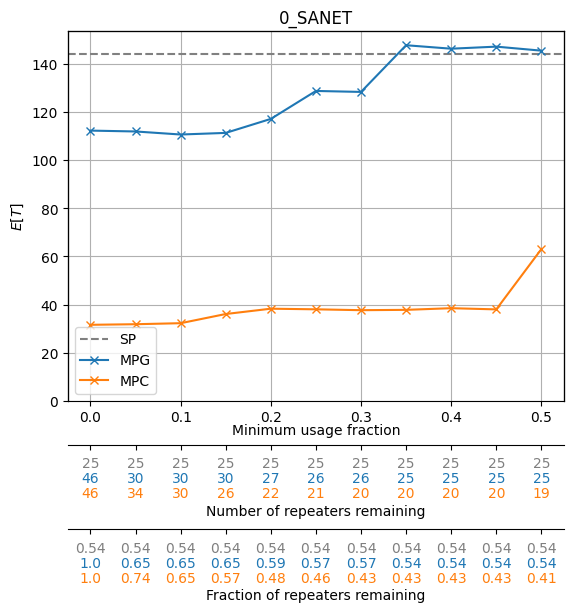

<Figure size 700x600 with 0 Axes>

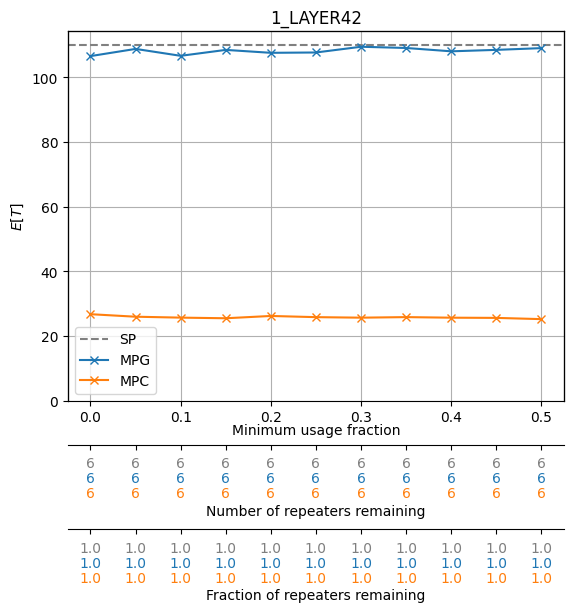

<Figure size 700x600 with 0 Axes>

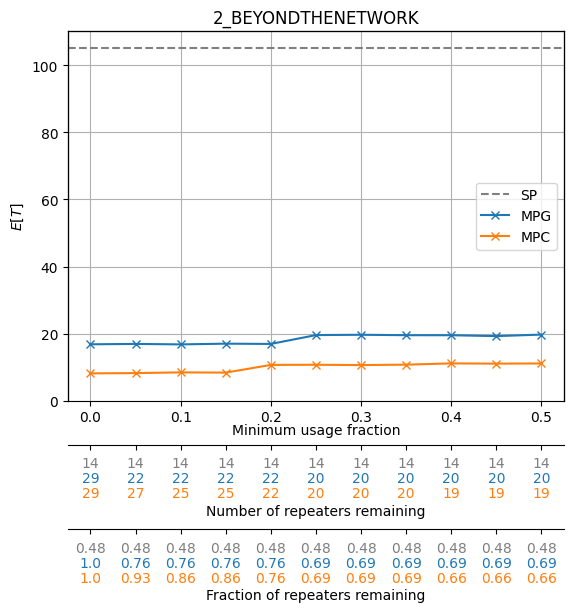

<Figure size 700x600 with 0 Axes>

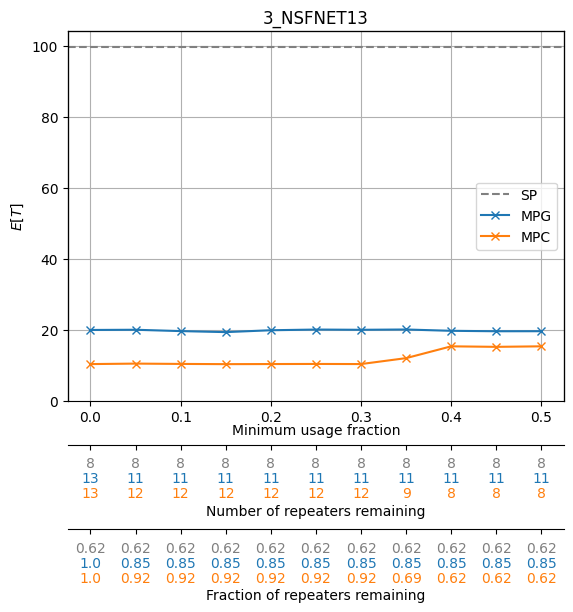

<Figure size 700x600 with 0 Axes>

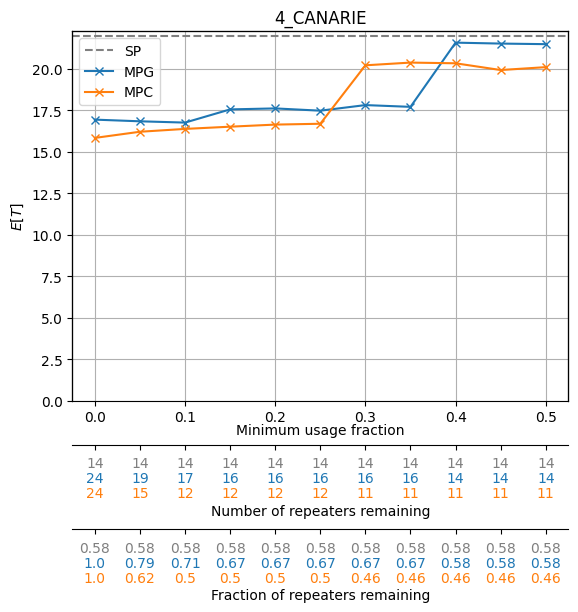

<Figure size 700x600 with 0 Axes>

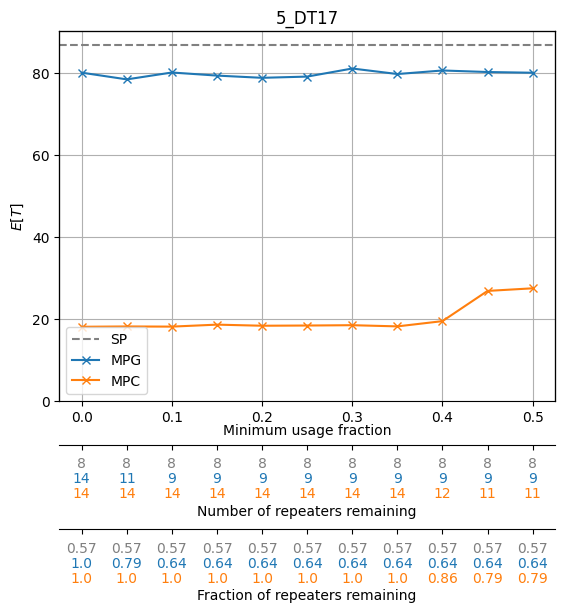

<Figure size 700x600 with 0 Axes>

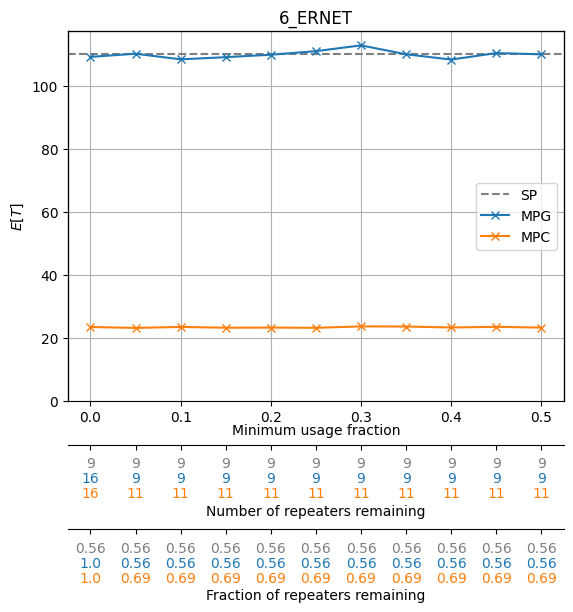

<Figure size 700x600 with 0 Axes>

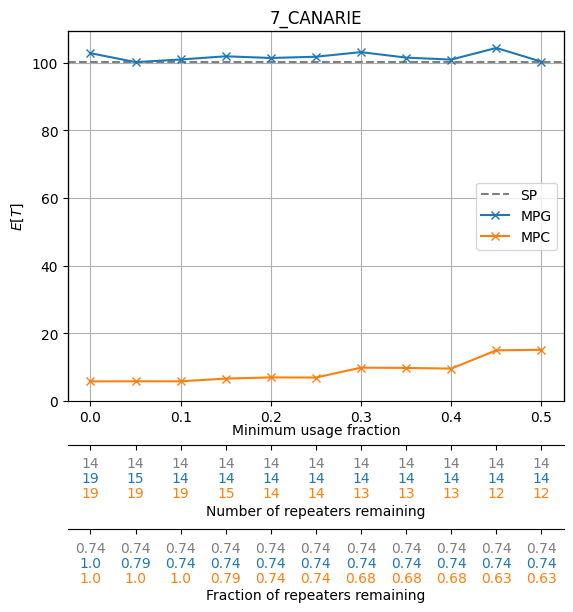

<Figure size 700x600 with 0 Axes>

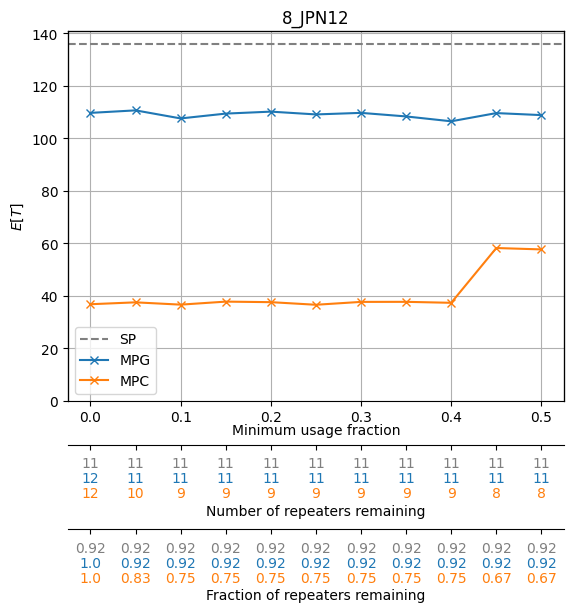

<Figure size 700x600 with 0 Axes>

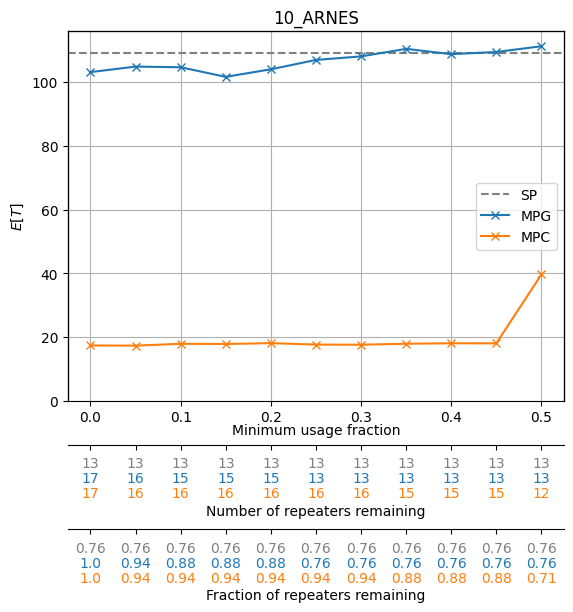

<Figure size 700x600 with 0 Axes>

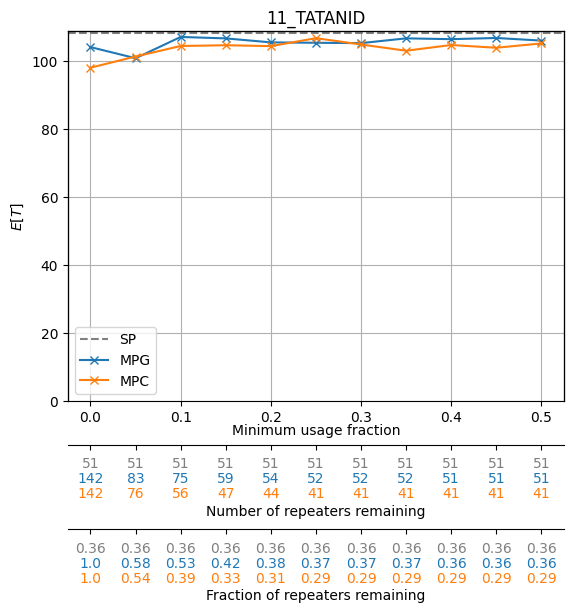

<Figure size 700x600 with 0 Axes>

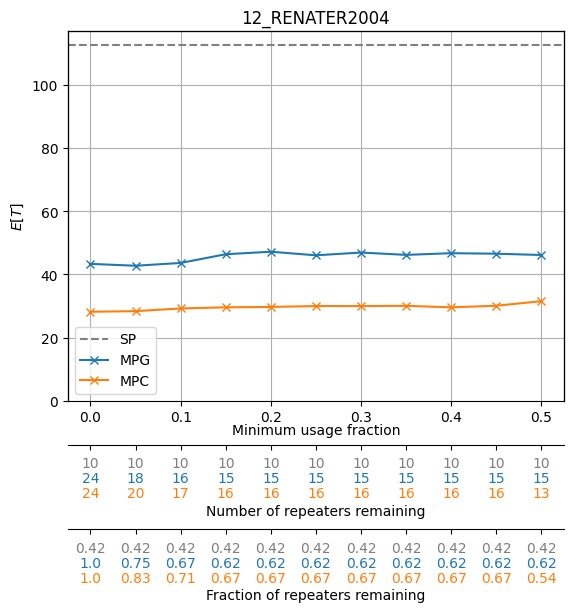

<Figure size 700x600 with 0 Axes>

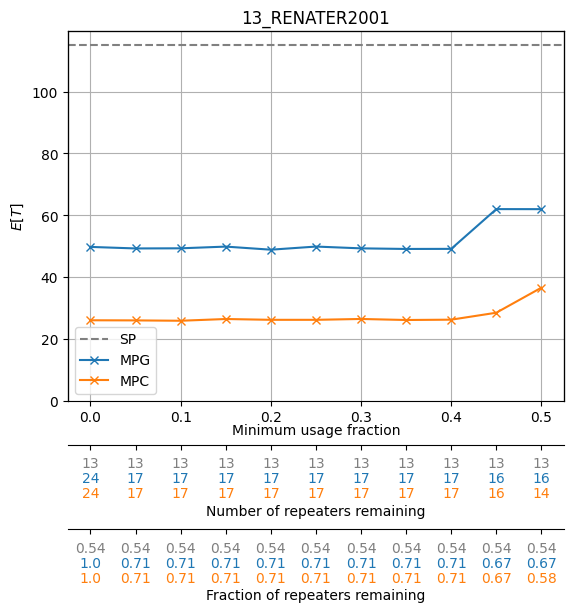

<Figure size 700x600 with 0 Axes>

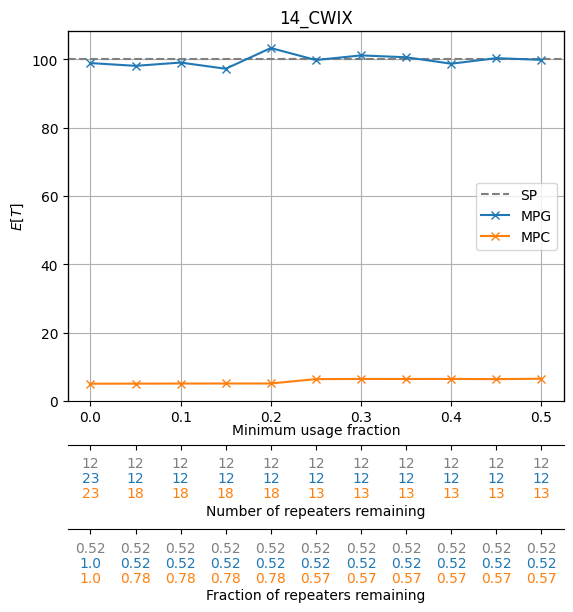

<Figure size 700x600 with 0 Axes>

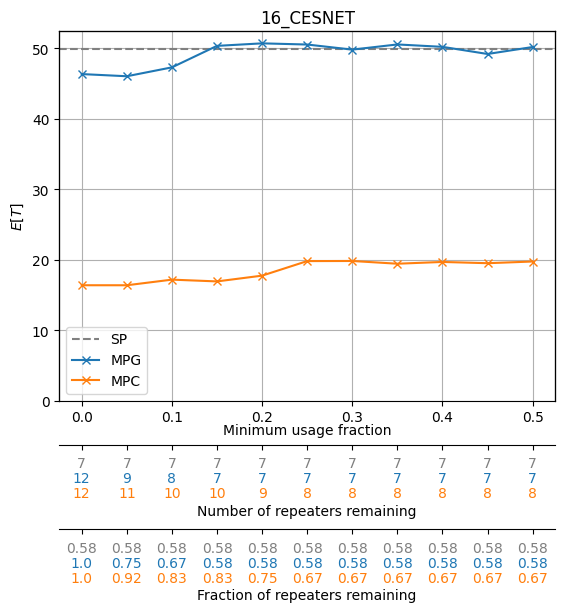

<Figure size 700x600 with 0 Axes>

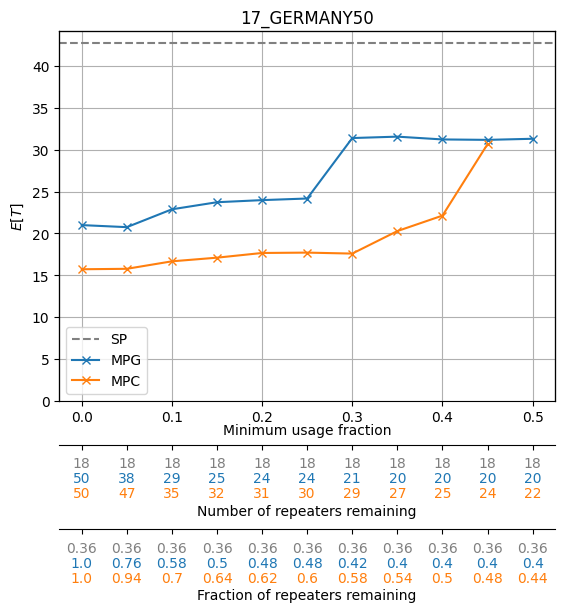

<Figure size 700x600 with 0 Axes>

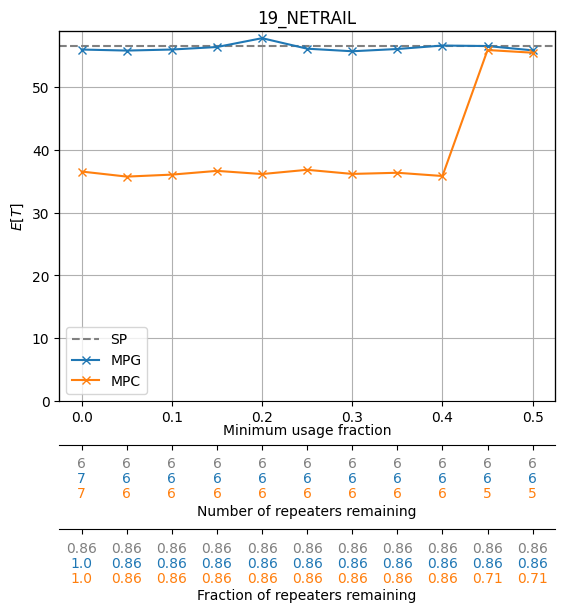

<Figure size 700x600 with 0 Axes>

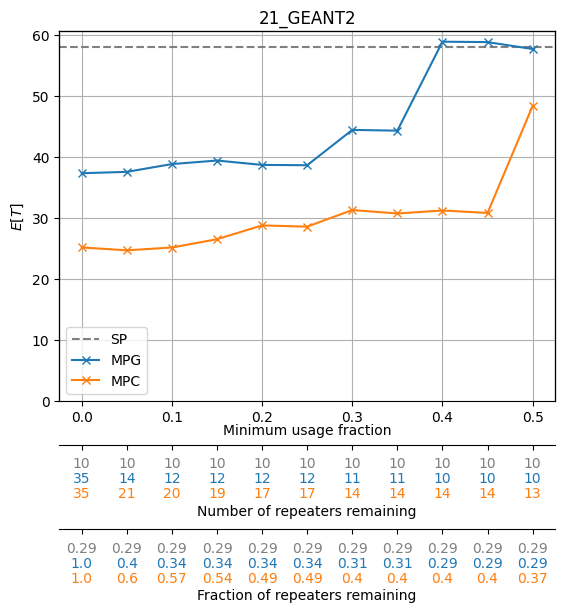

<Figure size 700x600 with 0 Axes>

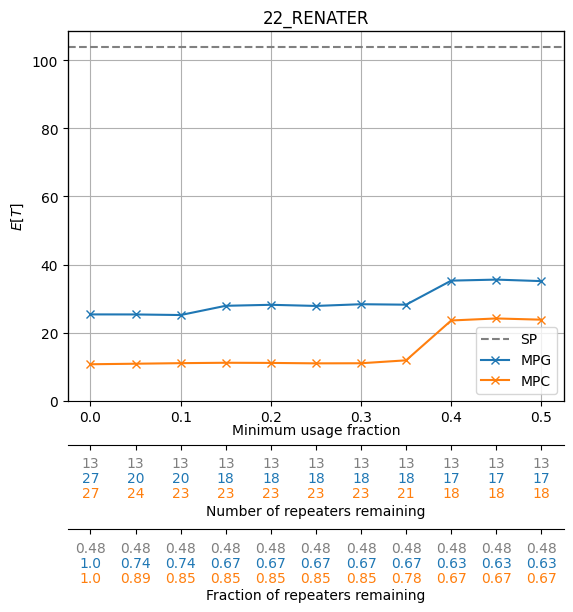

<Figure size 700x600 with 0 Axes>

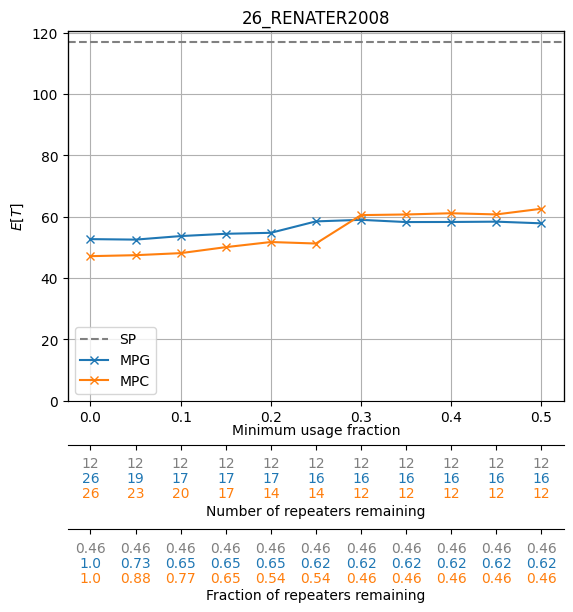

<Figure size 700x600 with 0 Axes>

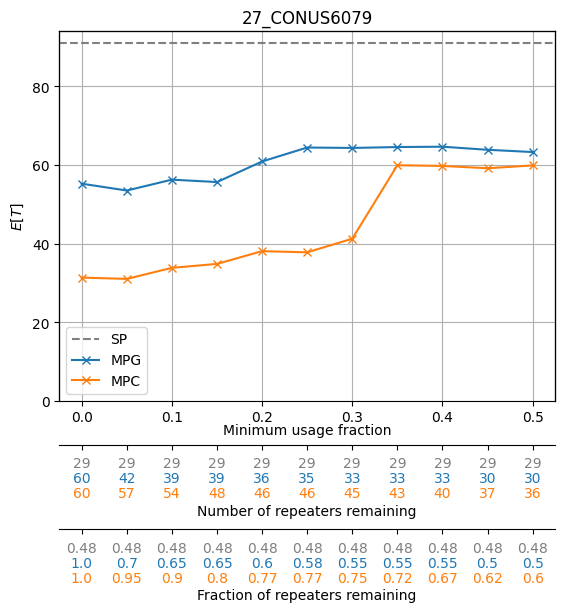

<Figure size 700x600 with 0 Axes>

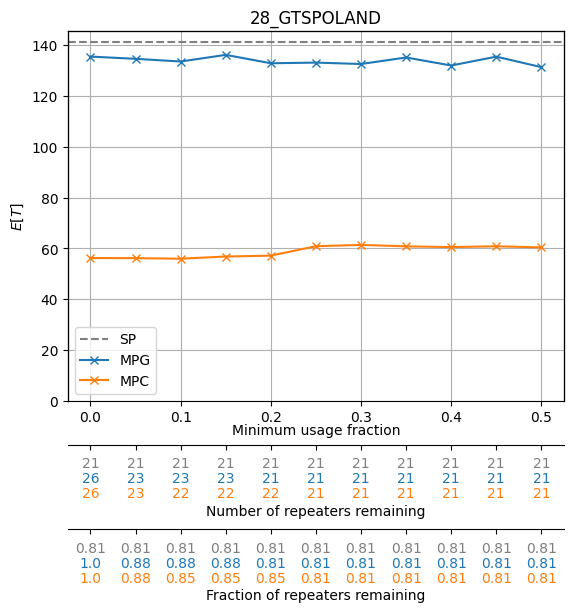

<Figure size 700x600 with 0 Axes>

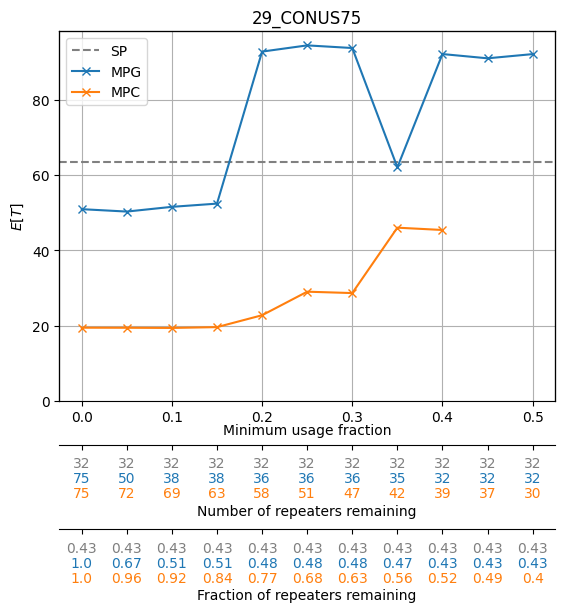

<Figure size 700x600 with 0 Axes>

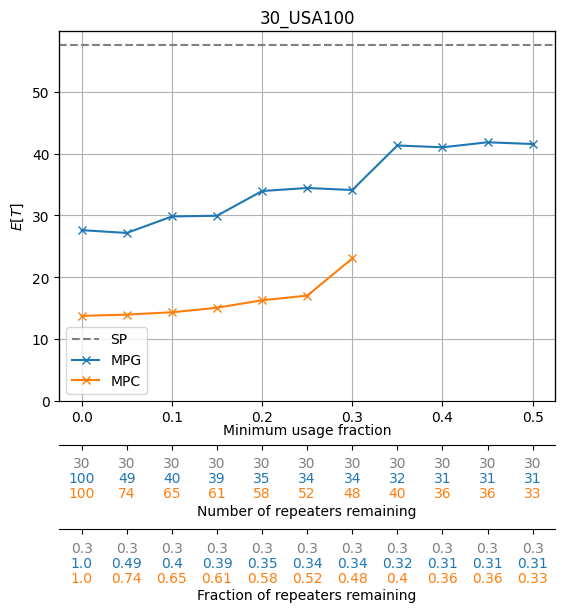

<Figure size 700x600 with 0 Axes>

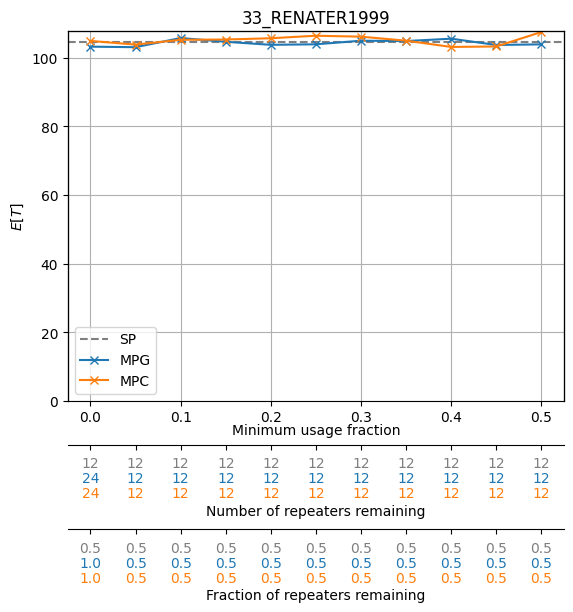

<Figure size 700x600 with 0 Axes>

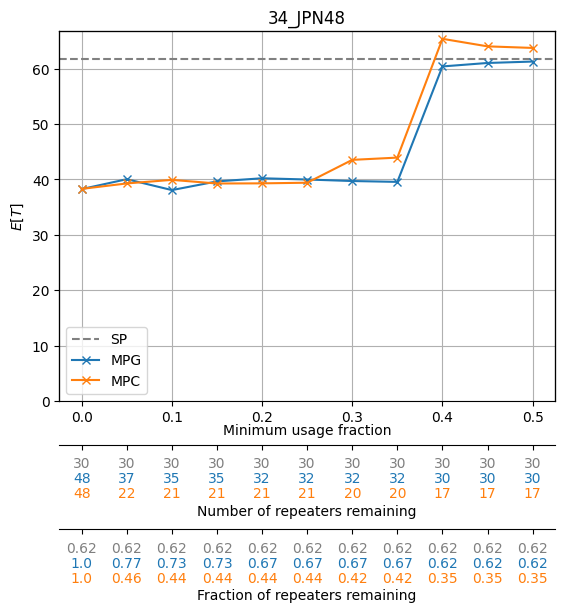

<Figure size 700x600 with 0 Axes>

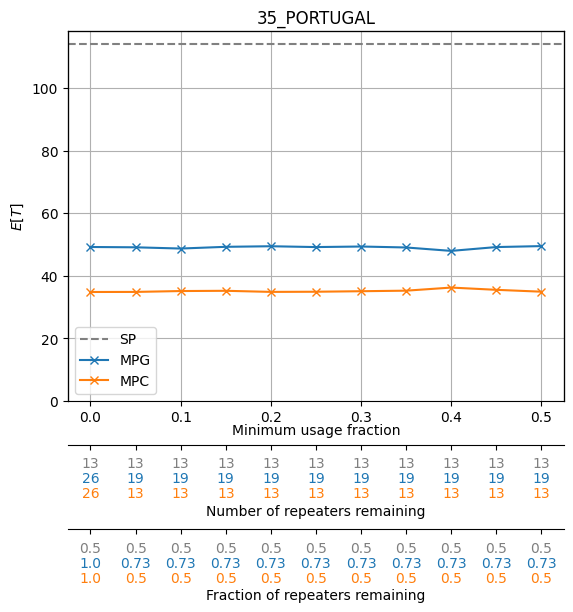

<Figure size 700x600 with 0 Axes>

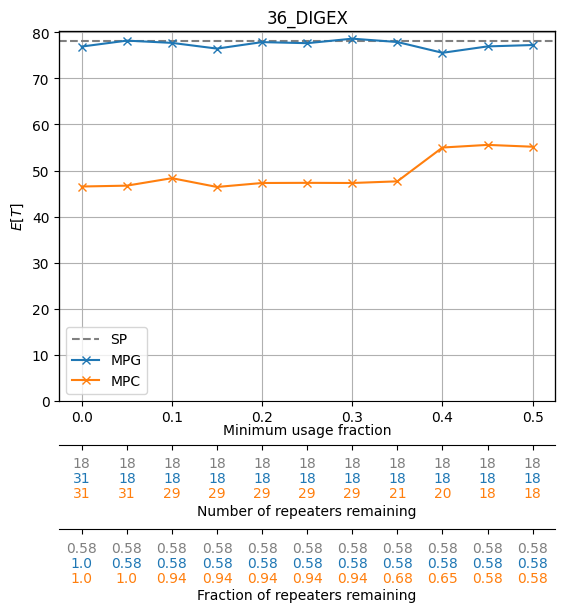

<Figure size 700x600 with 0 Axes>

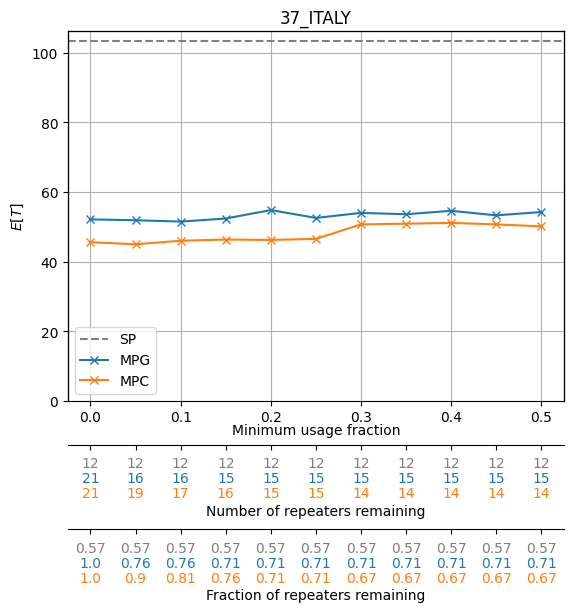

<Figure size 700x600 with 0 Axes>

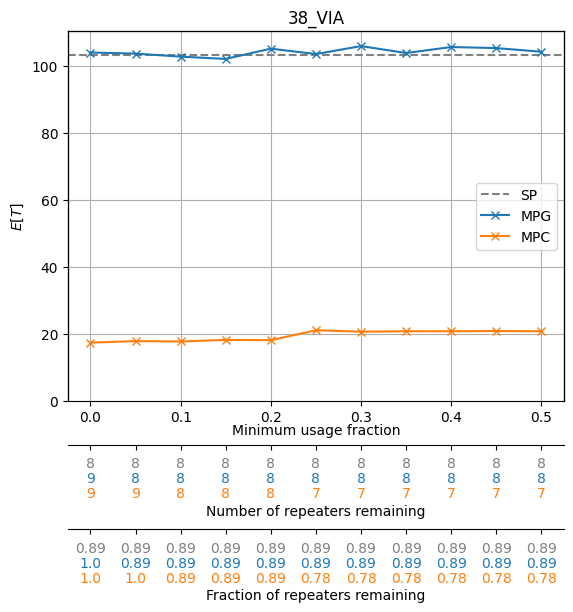

<Figure size 700x600 with 0 Axes>

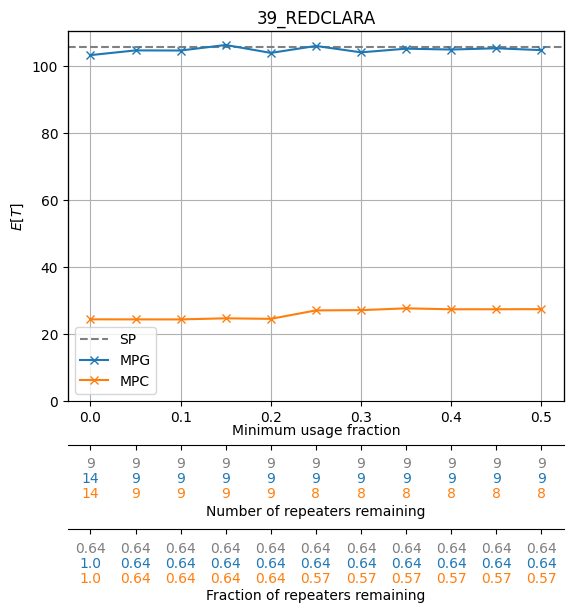

<Figure size 700x600 with 0 Axes>

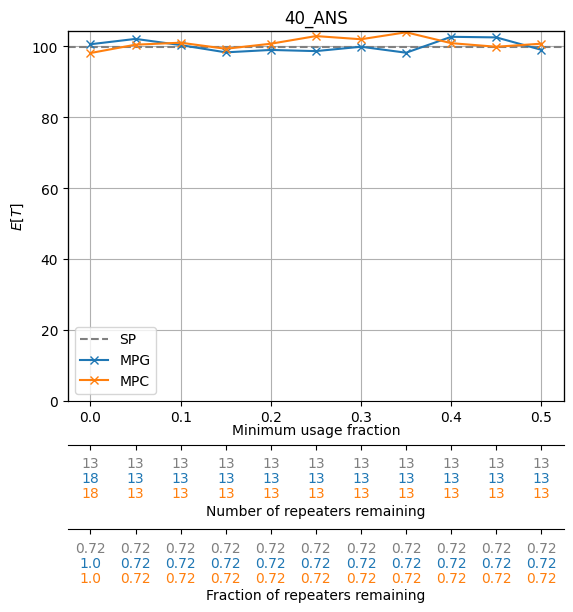

<Figure size 700x600 with 0 Axes>

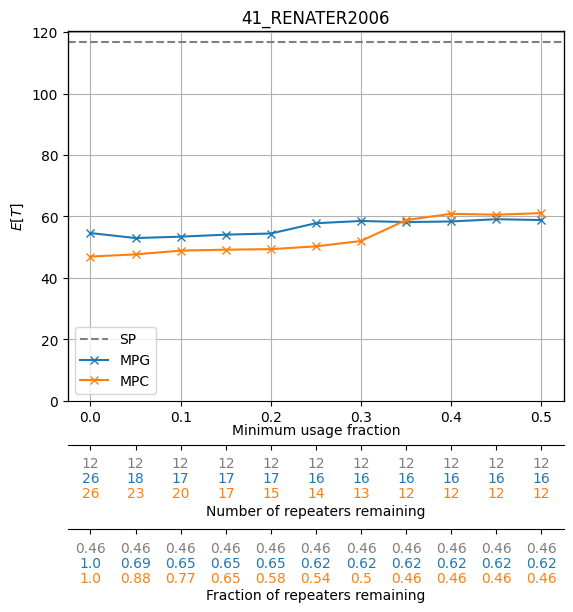

<Figure size 700x600 with 0 Axes>

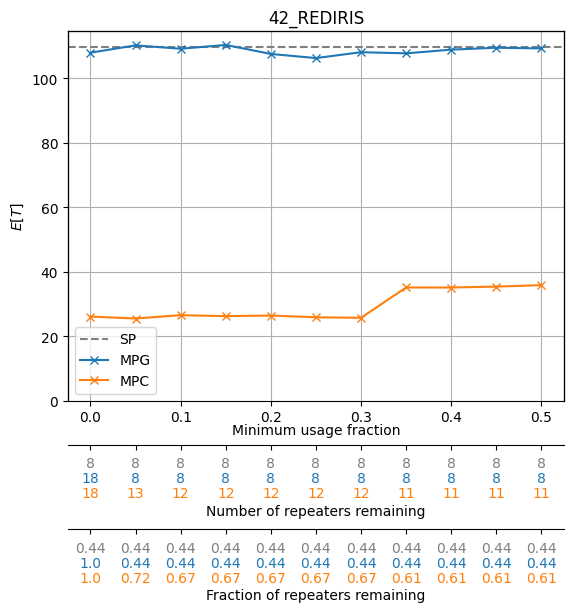

<Figure size 700x600 with 0 Axes>

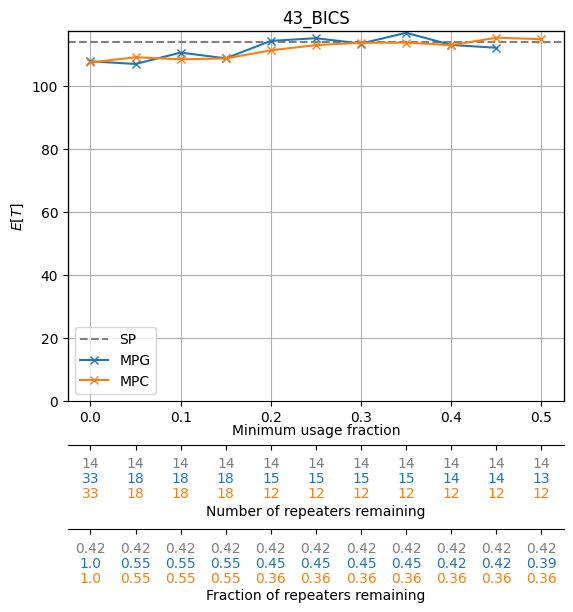

<Figure size 700x600 with 0 Axes>

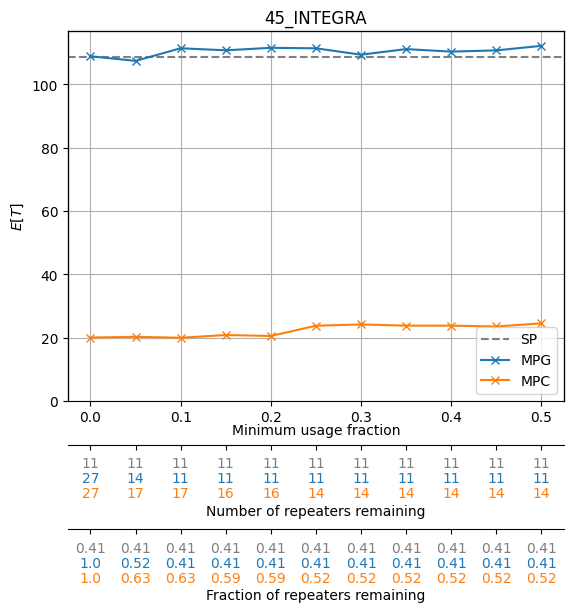

<Figure size 700x600 with 0 Axes>

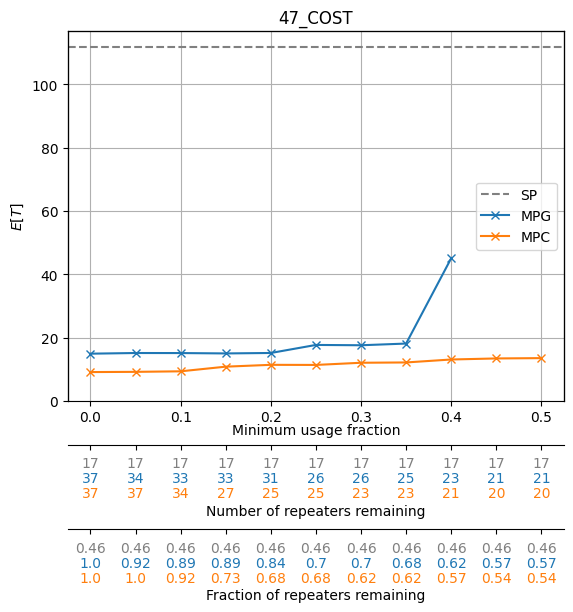

<Figure size 700x600 with 0 Axes>

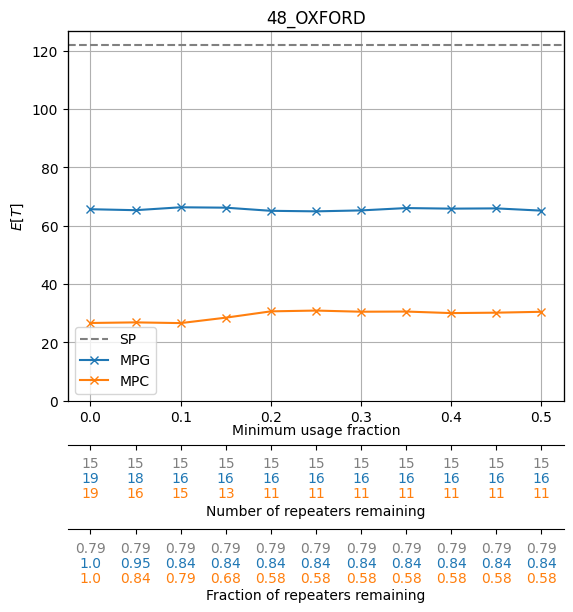

<Figure size 700x600 with 0 Axes>

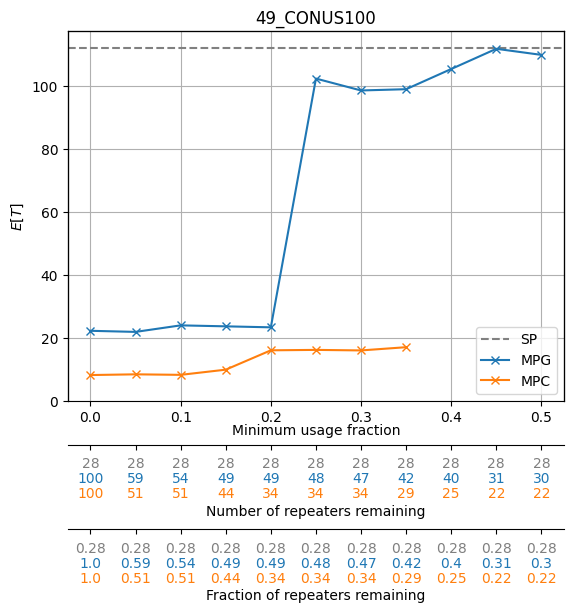

<Figure size 700x600 with 0 Axes>

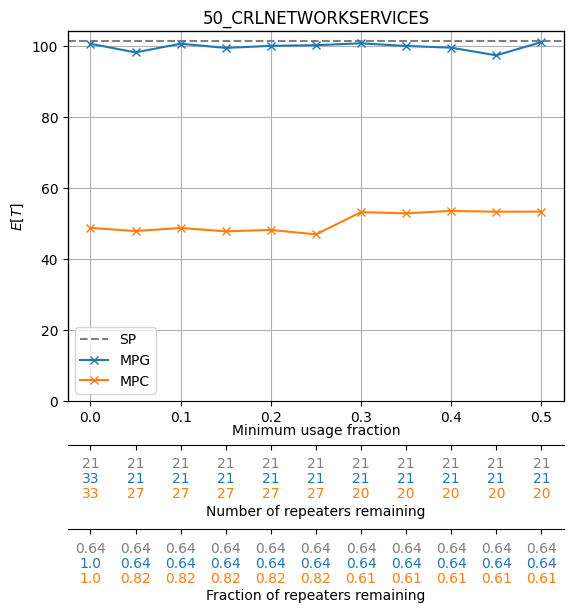

<Figure size 700x600 with 0 Axes>

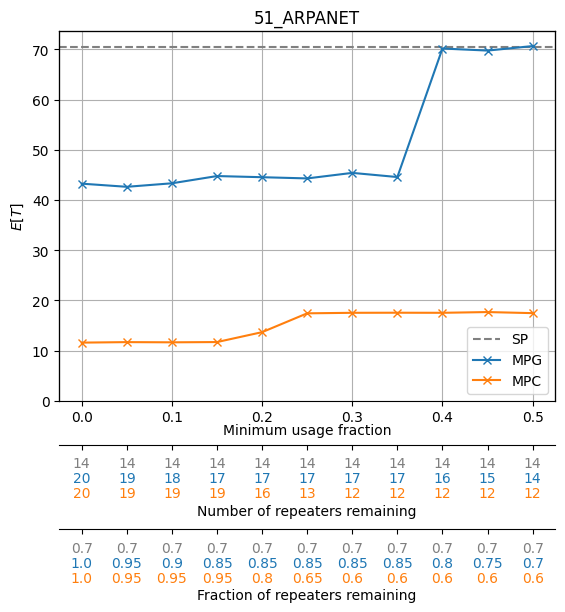

<Figure size 700x600 with 0 Axes>

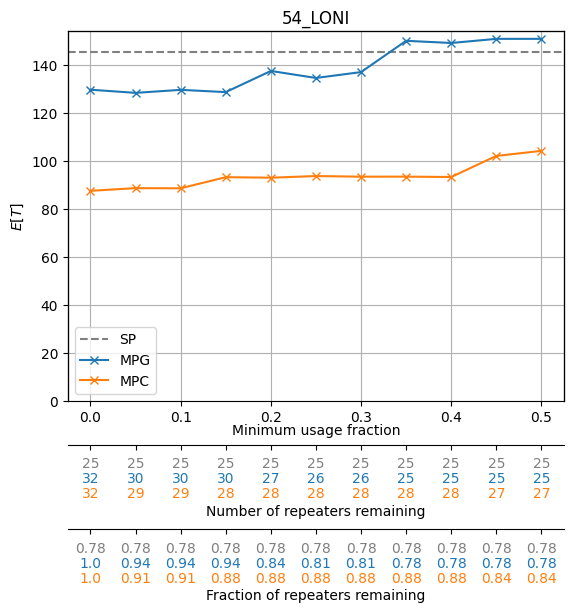

<Figure size 700x600 with 0 Axes>

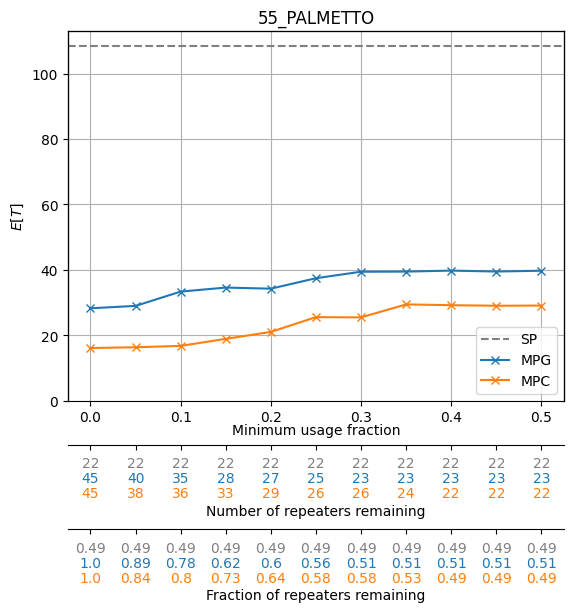

<Figure size 700x600 with 0 Axes>

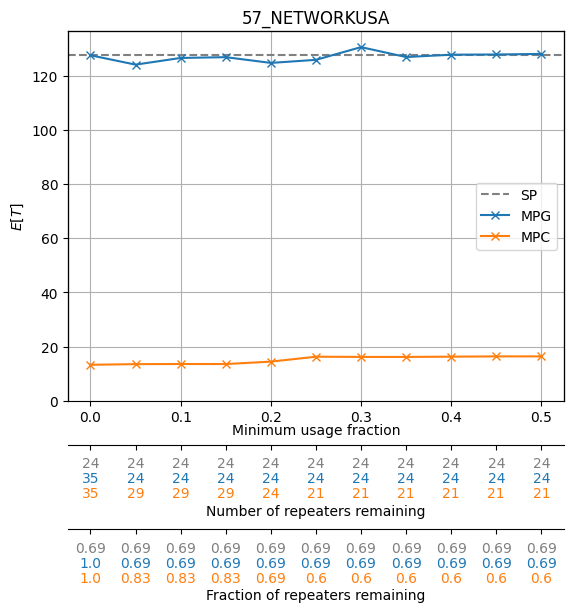

<Figure size 700x600 with 0 Axes>

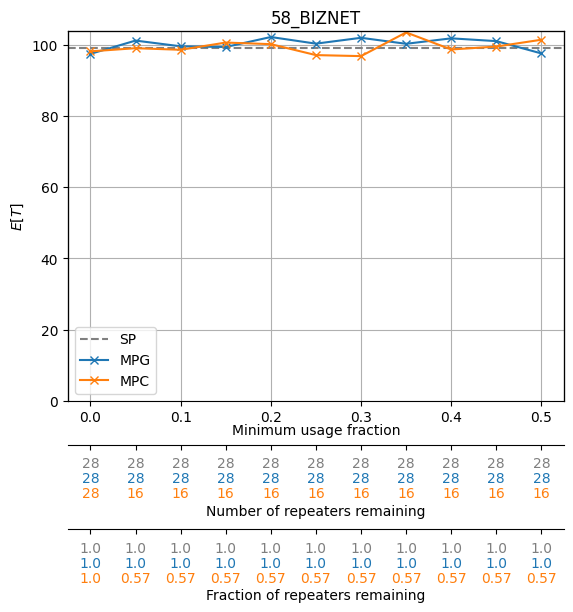

<Figure size 700x600 with 0 Axes>

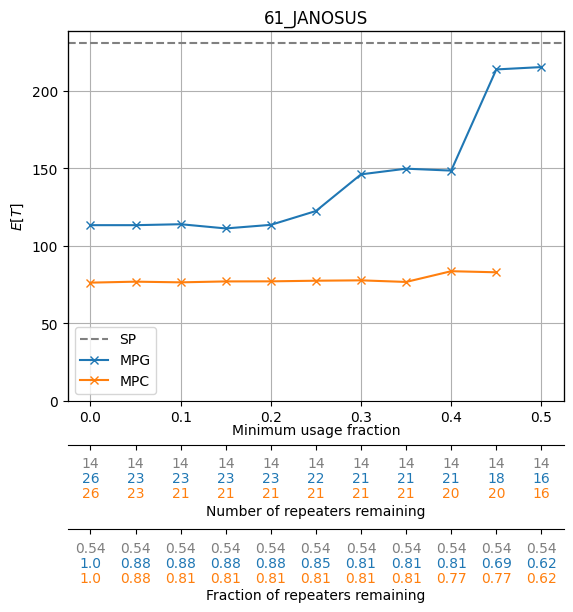

<Figure size 700x600 with 0 Axes>

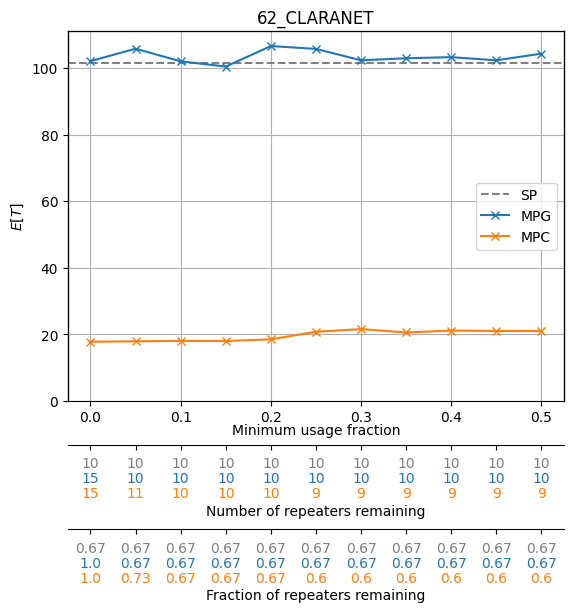

<Figure size 700x600 with 0 Axes>

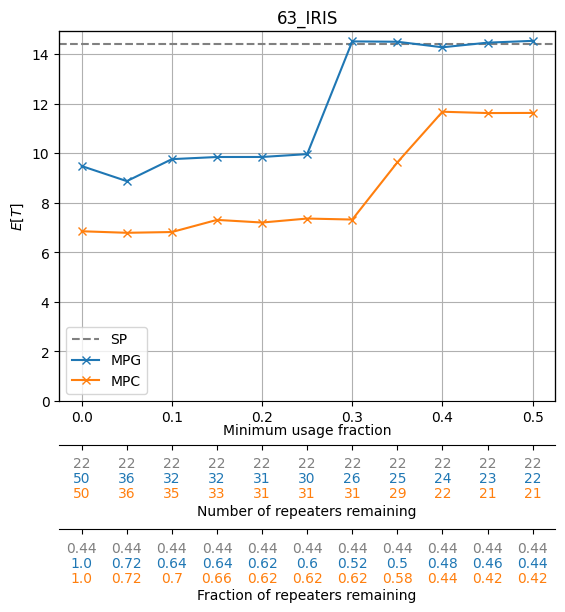

<Figure size 700x600 with 0 Axes>

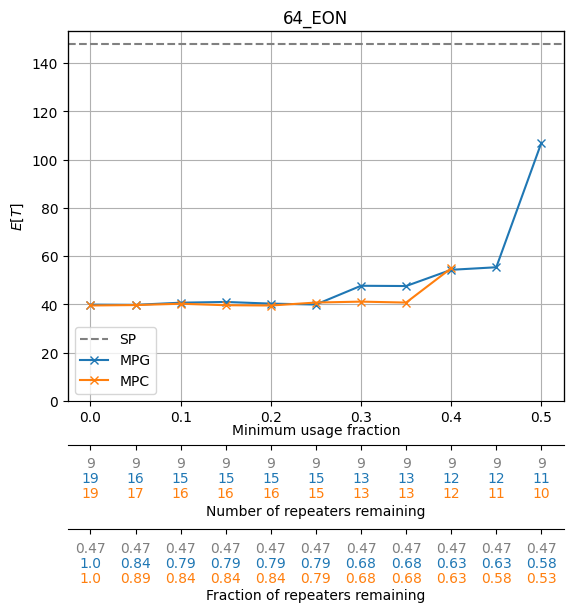

<Figure size 700x600 with 0 Axes>

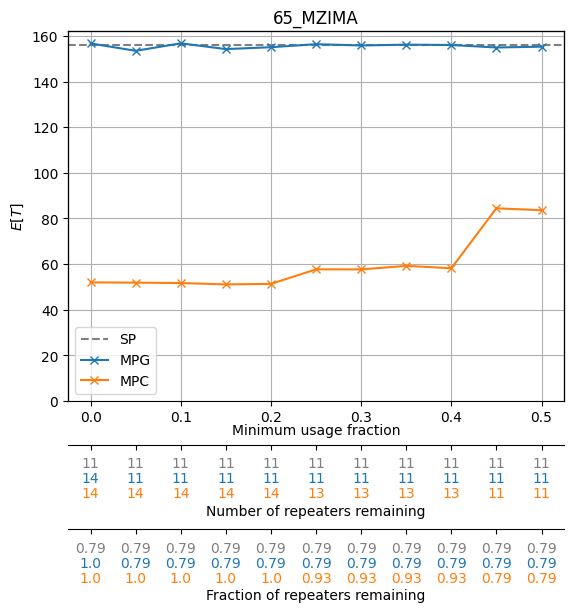

<Figure size 700x600 with 0 Axes>

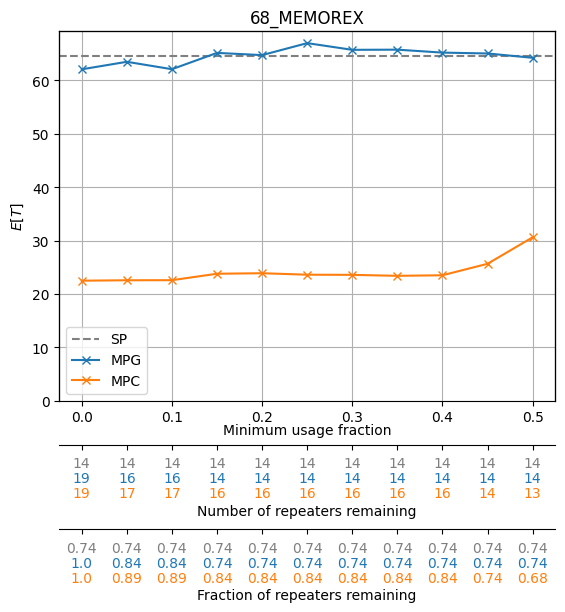

<Figure size 700x600 with 0 Axes>

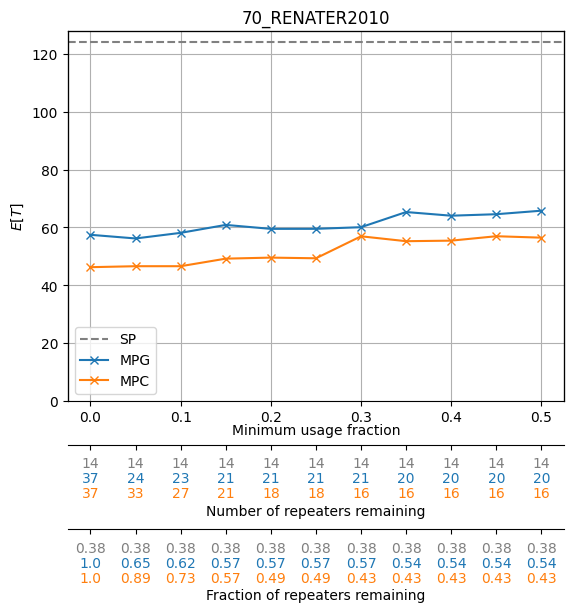

<Figure size 700x600 with 0 Axes>

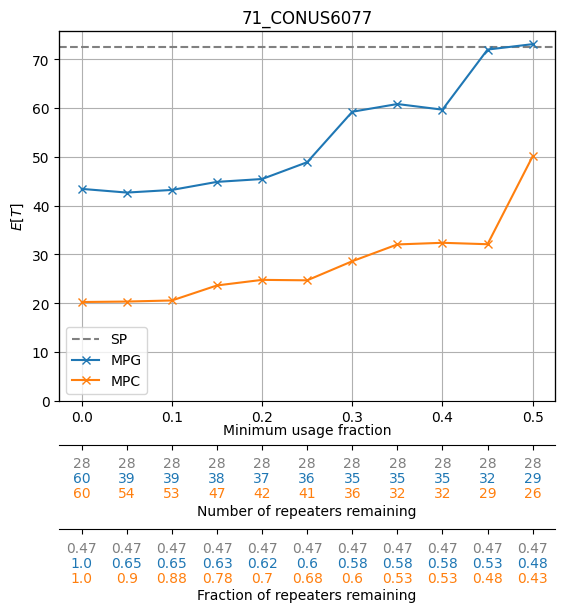

<Figure size 700x600 with 0 Axes>

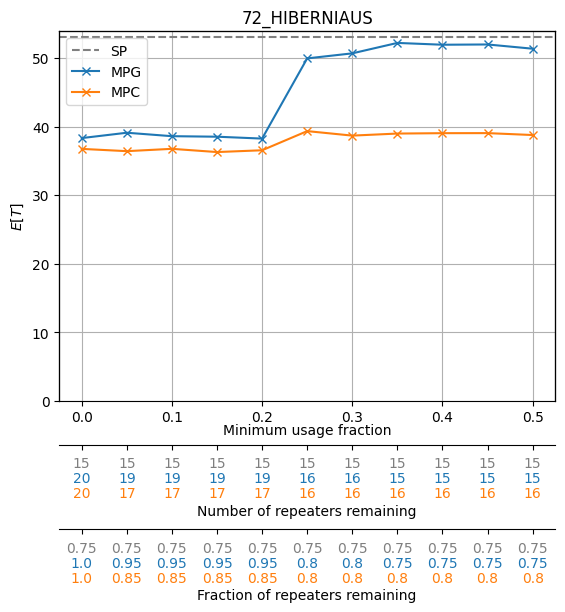

<Figure size 700x600 with 0 Axes>

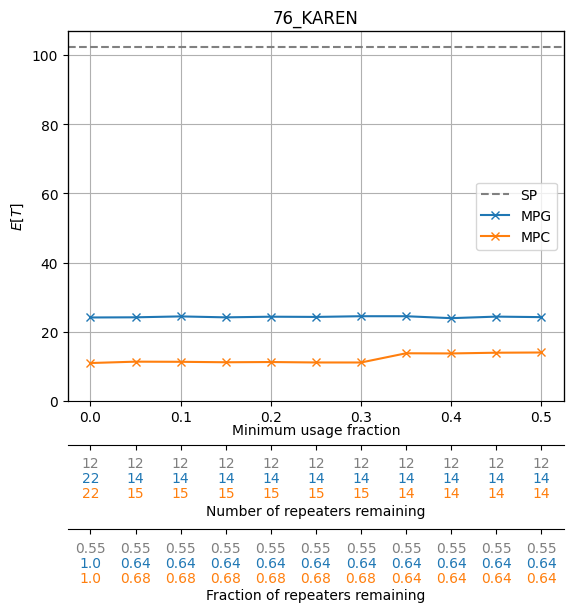

<Figure size 700x600 with 0 Axes>

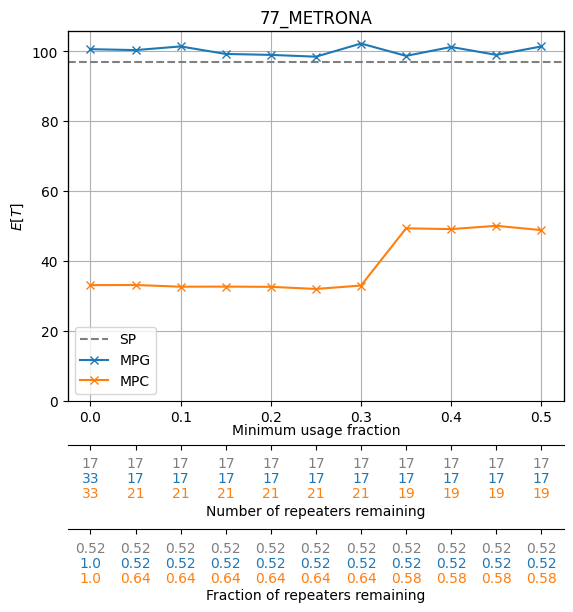

<Figure size 700x600 with 0 Axes>

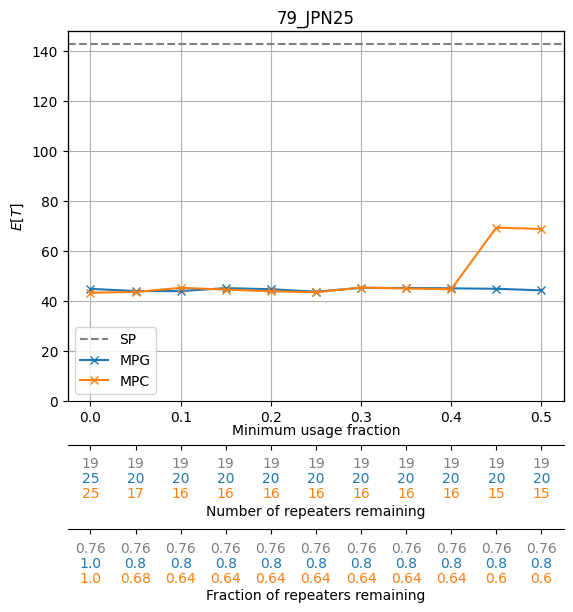

<Figure size 700x600 with 0 Axes>

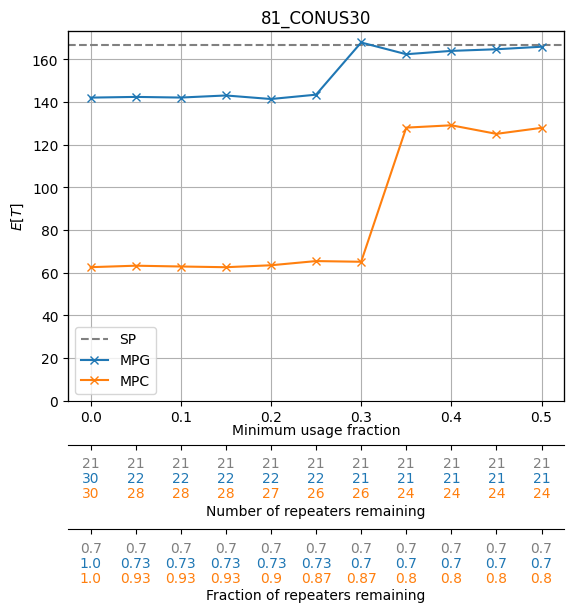

<Figure size 700x600 with 0 Axes>

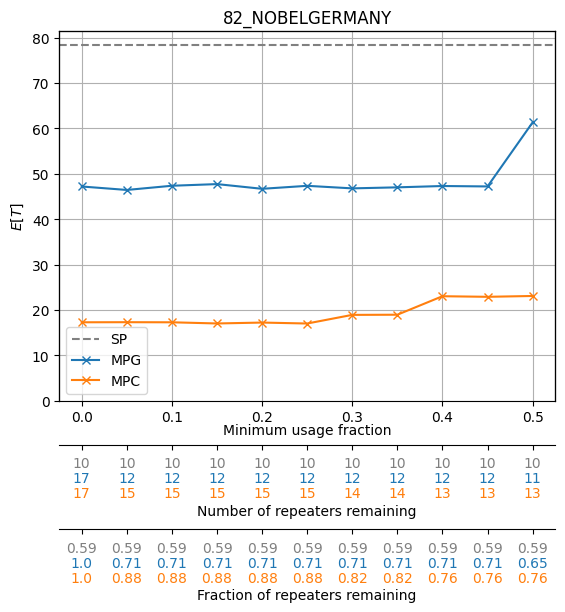

<Figure size 700x600 with 0 Axes>

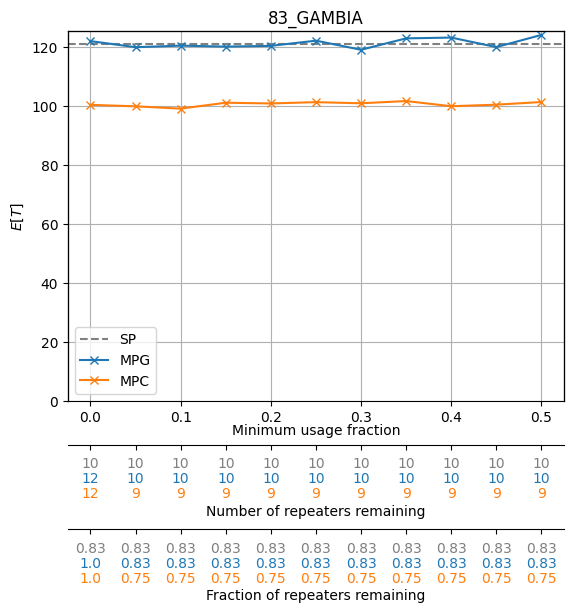

<Figure size 700x600 with 0 Axes>

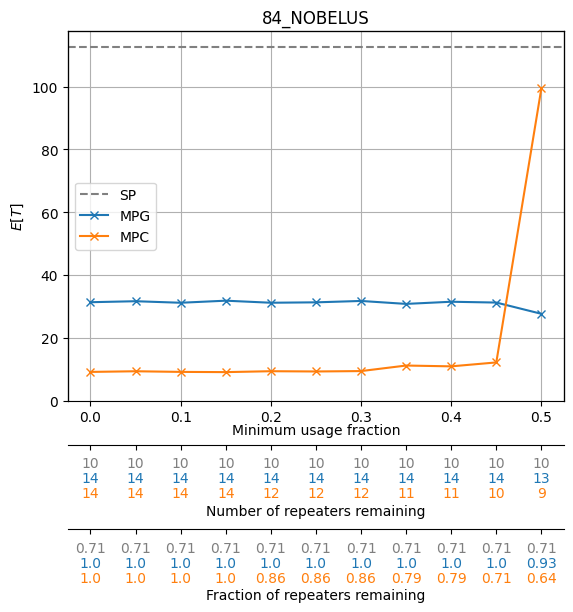

<Figure size 700x600 with 0 Axes>

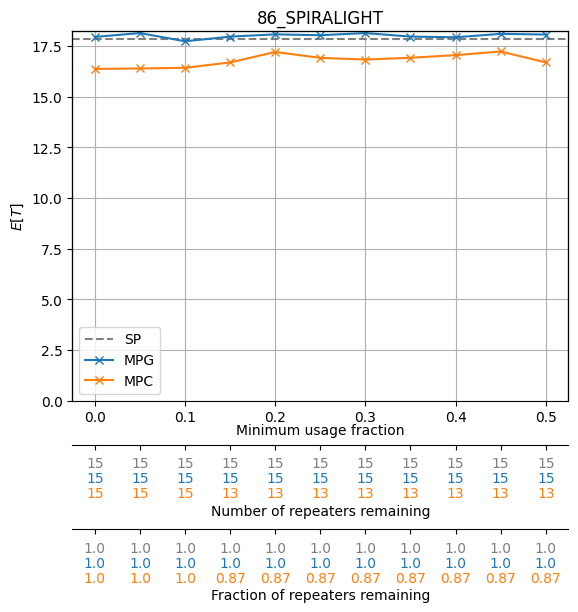

<Figure size 700x600 with 0 Axes>

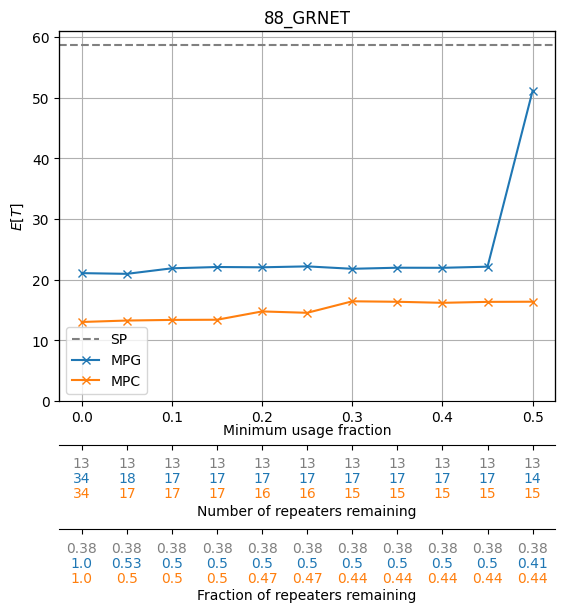

<Figure size 700x600 with 0 Axes>

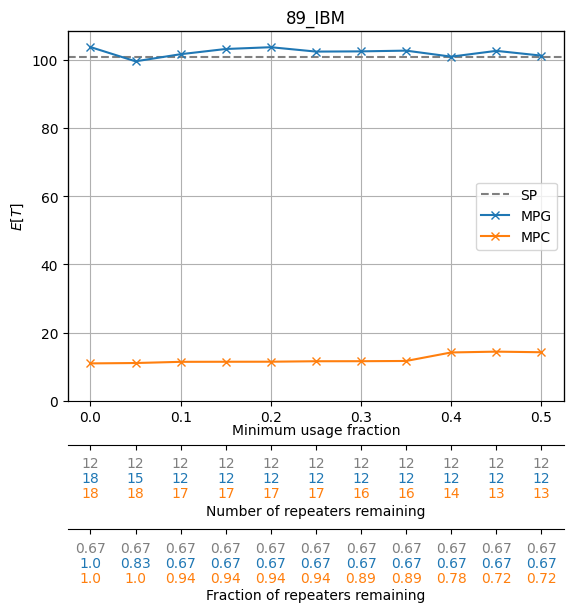

<Figure size 700x600 with 0 Axes>

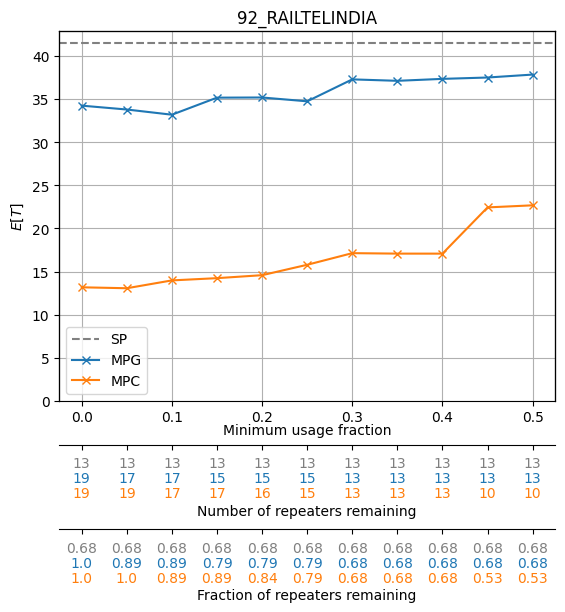

<Figure size 700x600 with 0 Axes>

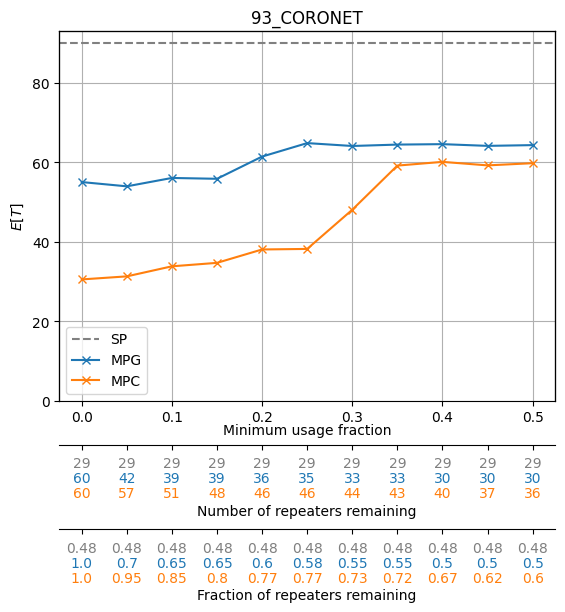

<Figure size 700x600 with 0 Axes>

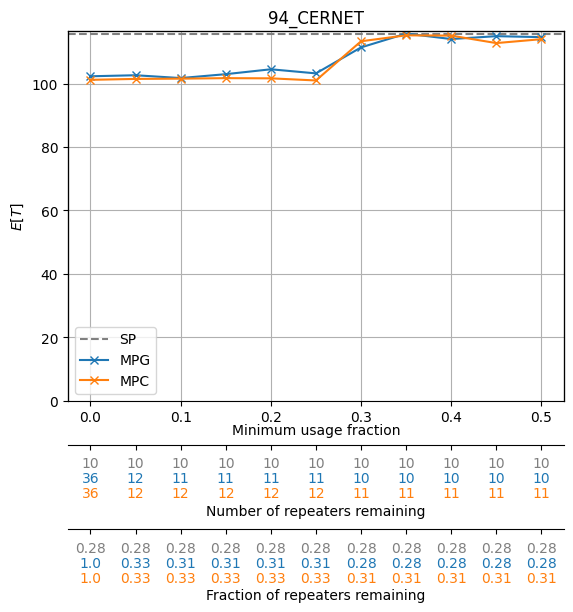

<Figure size 700x600 with 0 Axes>

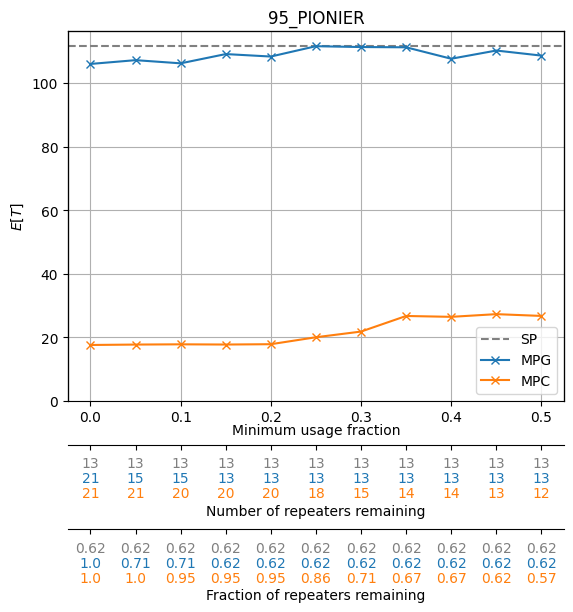

<Figure size 700x600 with 0 Axes>

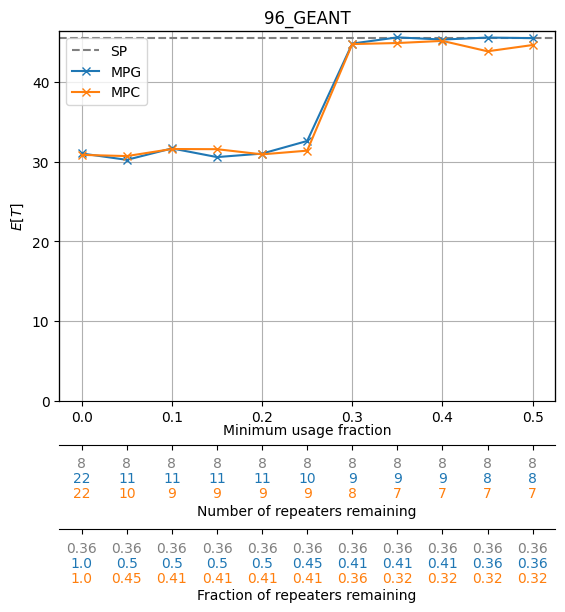

<Figure size 700x600 with 0 Axes>

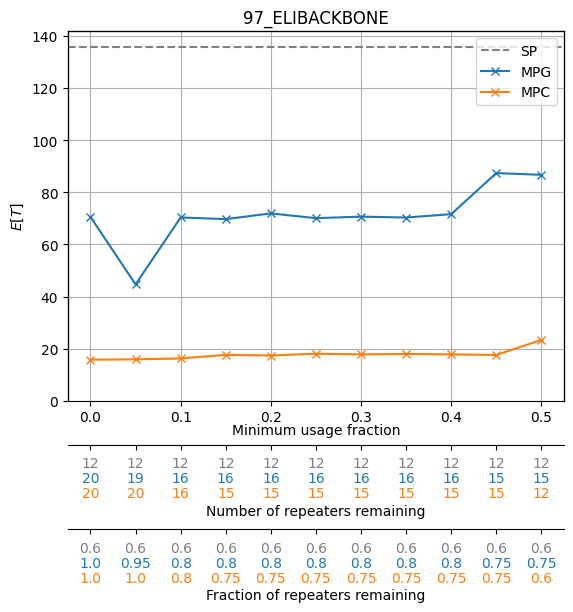

<Figure size 700x600 with 0 Axes>

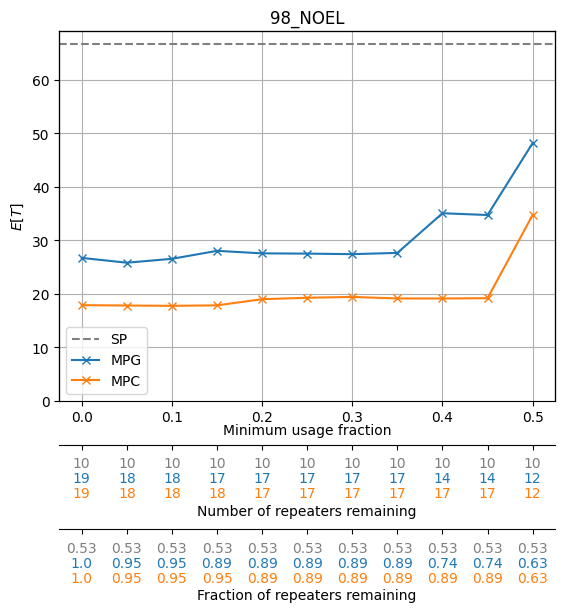

<Figure size 700x600 with 0 Axes>

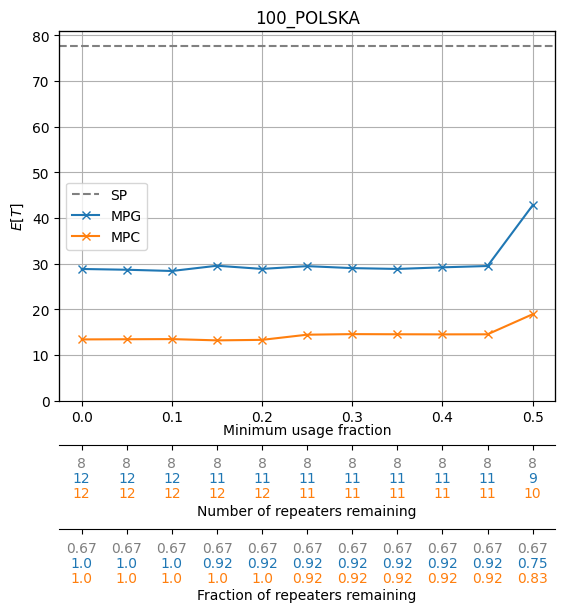

<Figure size 700x600 with 0 Axes>

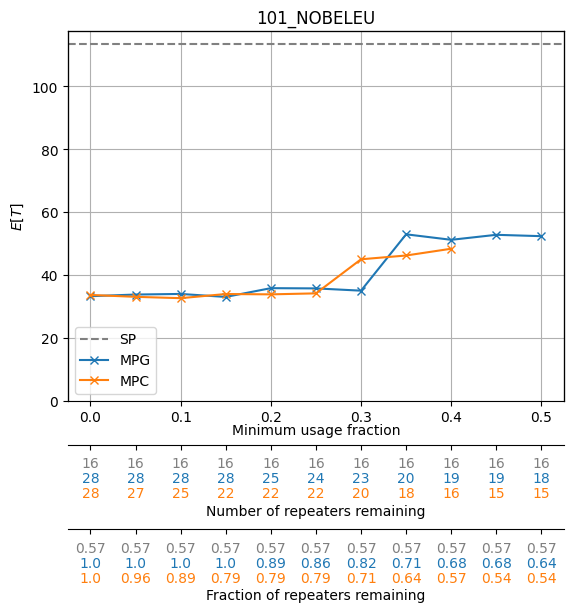

<Figure size 700x600 with 0 Axes>

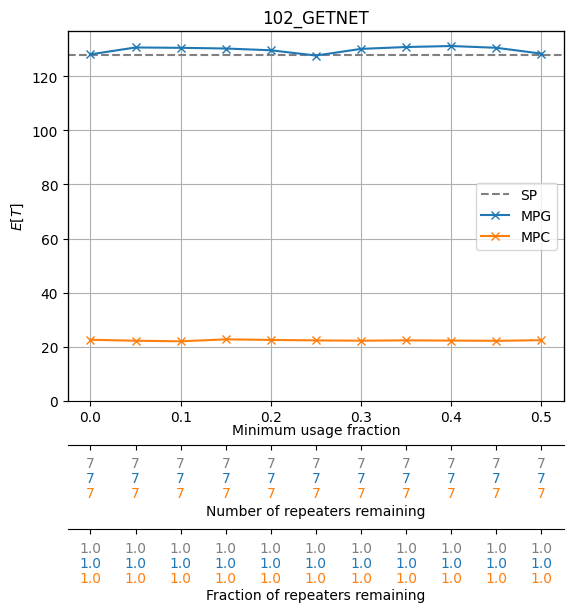

<Figure size 700x600 with 0 Axes>

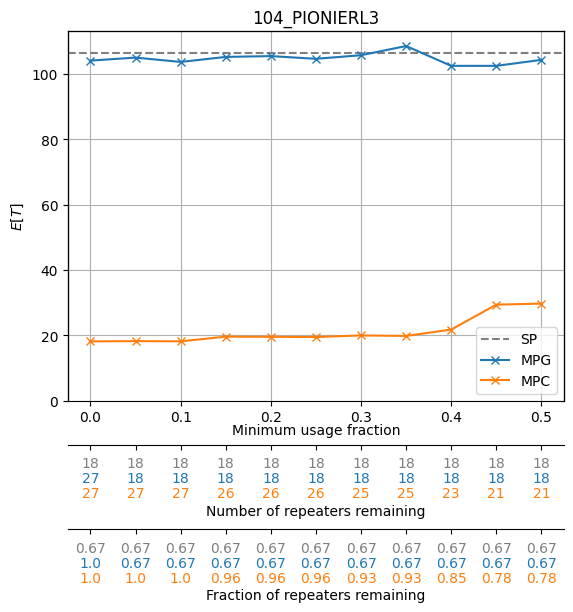

<Figure size 700x600 with 0 Axes>

In [101]:
for i in mpg_trimmed_iters_dict:
    if i in bad_indices or i in temp_filter:
        continue

    mufs = np.arange(0,0.55,0.05)
    mpg_iters_y = list(mpg_trimmed_iters_dict[i].values())
    mpc_iters_y = list(mpc_trimmed_iters_dict[i].values())

    fig, ax1 = plt.subplots()

    plt.figure(figsize=(7, 6))

    ax1.axhline(y=sp_iters_mean_dict[i], linestyle='--', color='gray', label='SP')
    ax1.plot(mufs, mpg_iters_y, marker='x', label='MPG')
    ax1.plot(mufs, mpc_iters_y, marker='x', label='MPC')

    ax1.set_xlabel('Minimum usage fraction', labelpad=-1)
    ax1.set_ylabel('$E[T]$')
    ax1.set_ylim(ymin=0)

    rep_num_l_sp = []
    rep_frac_l_sp = []
    rep_num_l_mpg = []
    rep_frac_l_mpg = []
    rep_num_l_mpc = []
    rep_frac_l_mpc = []
    rep_num_l_sp = []

    for muf,iter in zip(mufs, mpg_iters_y):
        rep_num = trimmed_real_topos_reps_mpg[(i,round(float(muf),2))]
        rep_frac = round(rep_num/real_topo[i].number_of_nodes(),2)
        rep_num_l_mpg.append(rep_num)
        rep_frac_l_mpg.append(rep_frac)

        rep_num_l_sp.append(len(real_topo_reps_SP[i]))
        rep_frac_l_sp.append(round(len(real_topo_reps_SP[i])/real_topo[i].number_of_nodes(),2))
            
    for muf,iter in zip(mufs, mpc_iters_y):
        rep_num = trimmed_real_topos_reps_mpc[(i,round(float(muf),2))]
        rep_frac = round(rep_num/real_topo[i].number_of_nodes(),2)
        rep_num_l_mpc.append(rep_num)
        rep_frac_l_mpc.append(rep_frac)


    ax2 = ax1.twiny()
    ax2.xaxis.set_ticks_position('bottom')
    ax2.xaxis.set_label_position('bottom')
    ax2.spines['bottom'].set_position(('outward', 32))
    ax2.set_xticks(np.arange(0,0.55,0.05))
    ax2.set_xbound(ax1.get_xbound())
    ax2.set_xticklabels([f' \n ' for _ in rep_num_l_mpg])
    ax2.set_xlabel('Number of repeaters remaining', labelpad=14)
    for muf, mpg_n, mpc_n, sp_n in zip(mufs, rep_num_l_mpg, rep_num_l_mpc, rep_num_l_sp):
        ax2.text(muf, -0.15, f'{sp_n}', color='tab:gray', ha='center', va='top', fontsize=10, transform=ax2.get_xaxis_transform())
        ax2.text(muf, -0.19, f'{mpg_n}', color='tab:blue', ha='center', va='top', fontsize=10, transform=ax2.get_xaxis_transform())
        ax2.text(muf, -0.23, f'{mpc_n}', color='tab:orange', ha='center', va='top', fontsize=10, transform=ax2.get_xaxis_transform())


    ax3 = ax2.twiny()
    ax3.xaxis.set_ticks_position('bottom')
    ax3.xaxis.set_label_position('bottom')
    ax3.spines['bottom'].set_position(('outward', 92))
    ax3.set_xticks(np.arange(0,0.55,0.05))
    ax3.set_xbound(ax1.get_xbound())
    ax3.set_xticklabels([f' \n ' for _ in rep_num_l_mpg])
    ax3.set_xlabel('Fraction of repeaters remaining', labelpad=14)
    for muf, mpg_f, mpc_f, sp_f in zip(mufs, rep_frac_l_mpg, rep_frac_l_mpc, rep_frac_l_sp):
        ax3.text(muf, -0.38, f'{sp_f}', color='tab:gray', ha='center', va='top', fontsize=10, transform=ax3.get_xaxis_transform())
        ax3.text(muf, -0.42, f'{mpg_f}', color='tab:blue', ha='center', va='top', fontsize=10, transform=ax3.get_xaxis_transform())
        ax3.text(muf, -0.46, f'{mpc_f}', color='tab:orange', ha='center', va='top', fontsize=10, transform=ax3.get_xaxis_transform())

    
    ax1.grid(True)
    ax1.legend()
    ax1.set_title(f'{i}_{file_names[i]}')

    save_remove_rep_stats = True
    if save_remove_rep_stats:
        for clus in iters_clusters:
             if i in iters_clusters[clus]:
                break
        fig.savefig(f'images\\muf_remove_graph\\nums\\cluster {clus}\\' + f'{i}_{file_names[i]}_removerepstats.png', bbox_inches='tight')
        fig.savefig(f'images\\muf_remove_graph\\nums\\all\\' + f'{i}_{file_names[i]}_removerepstats.png', bbox_inches='tight')
    plt.show()    

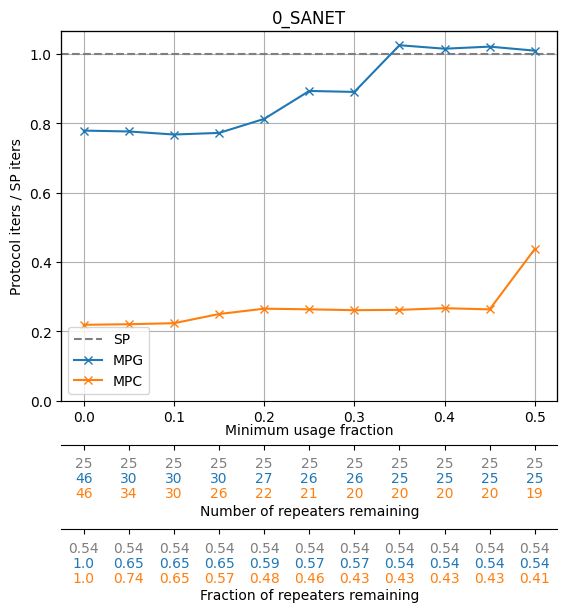

<Figure size 700x600 with 0 Axes>

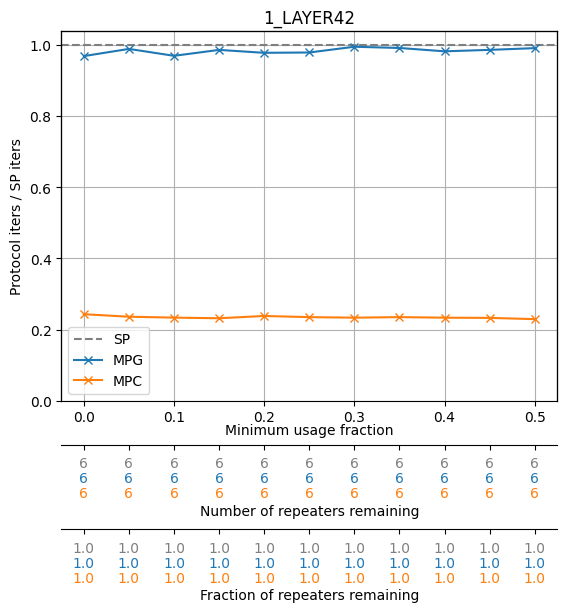

<Figure size 700x600 with 0 Axes>

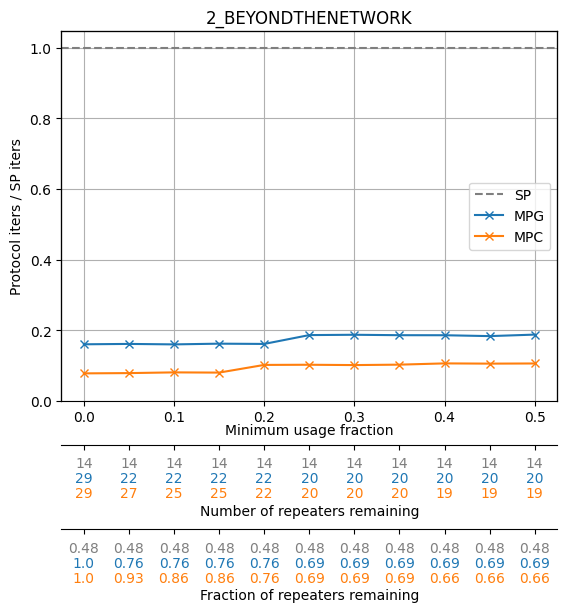

<Figure size 700x600 with 0 Axes>

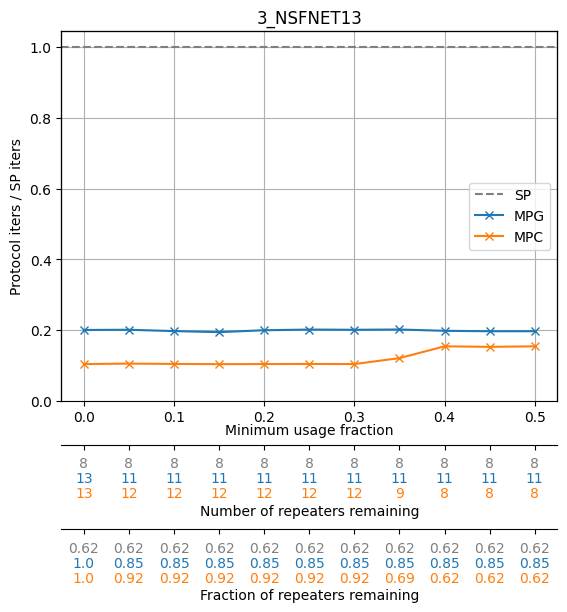

<Figure size 700x600 with 0 Axes>

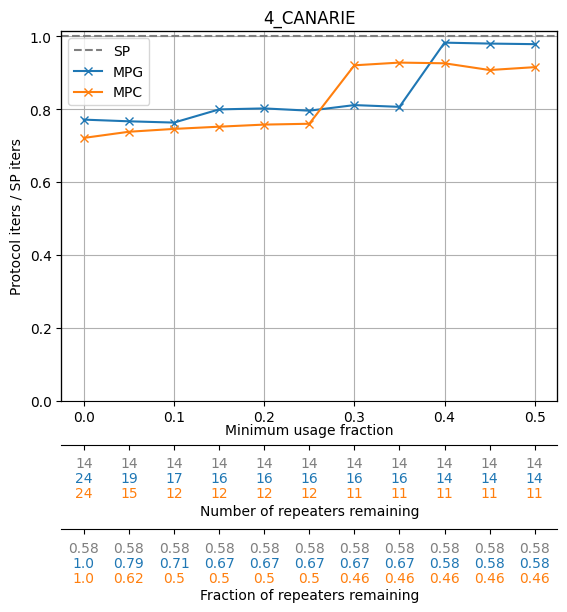

<Figure size 700x600 with 0 Axes>

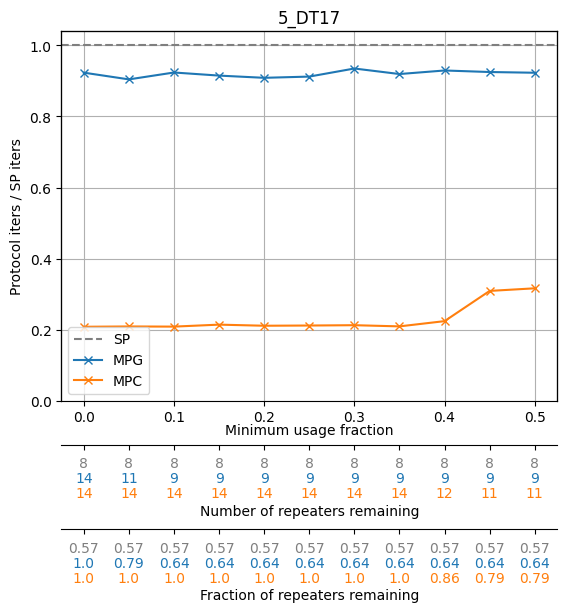

<Figure size 700x600 with 0 Axes>

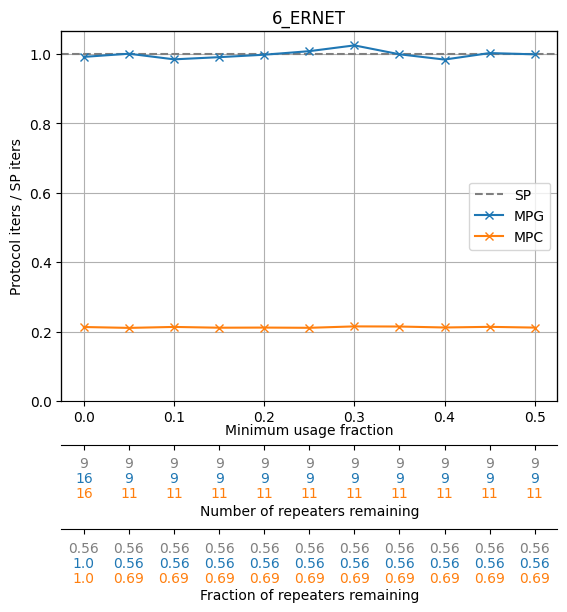

<Figure size 700x600 with 0 Axes>

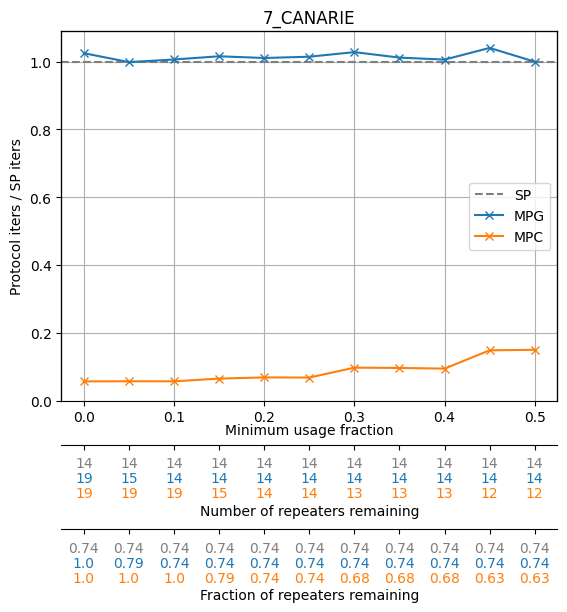

<Figure size 700x600 with 0 Axes>

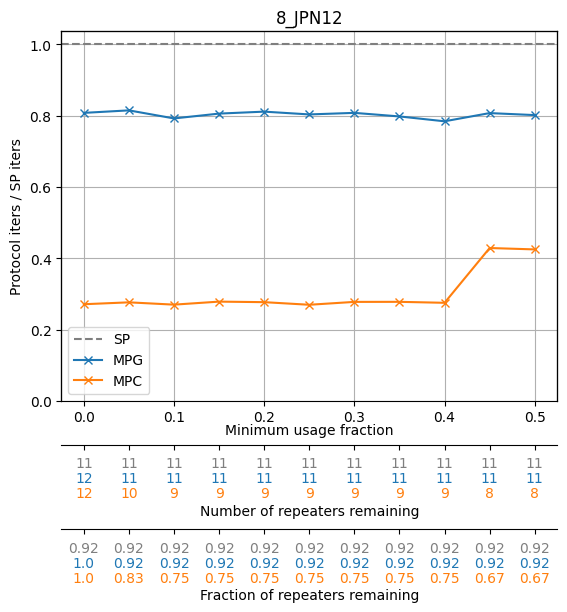

<Figure size 700x600 with 0 Axes>

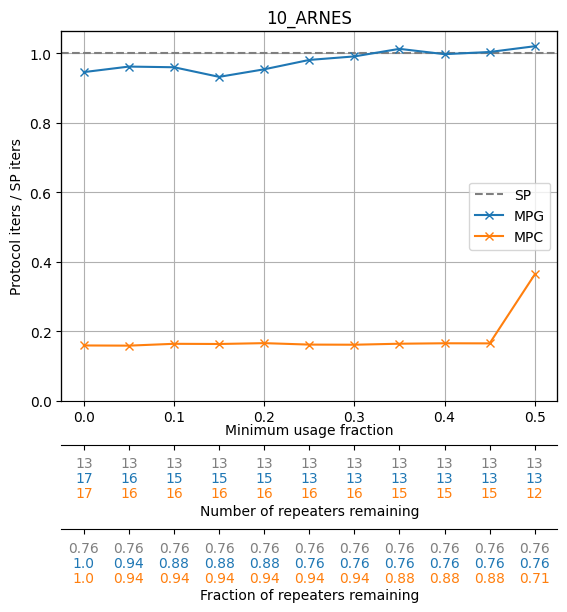

<Figure size 700x600 with 0 Axes>

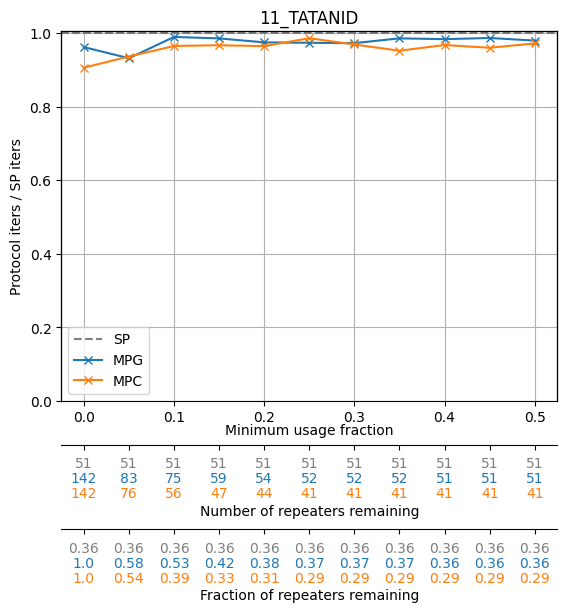

<Figure size 700x600 with 0 Axes>

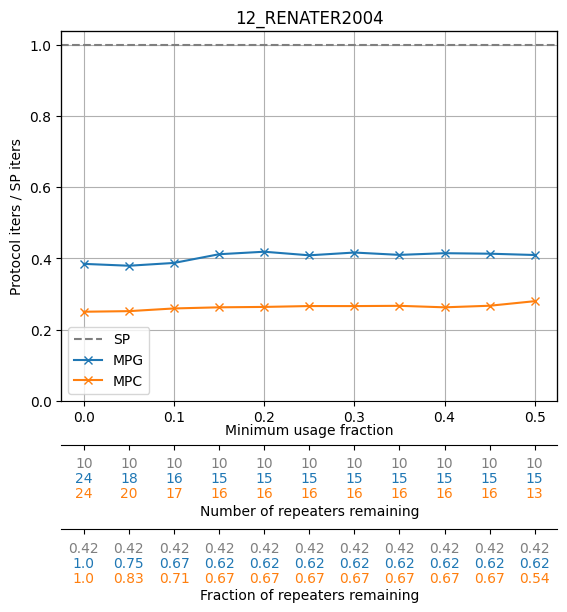

<Figure size 700x600 with 0 Axes>

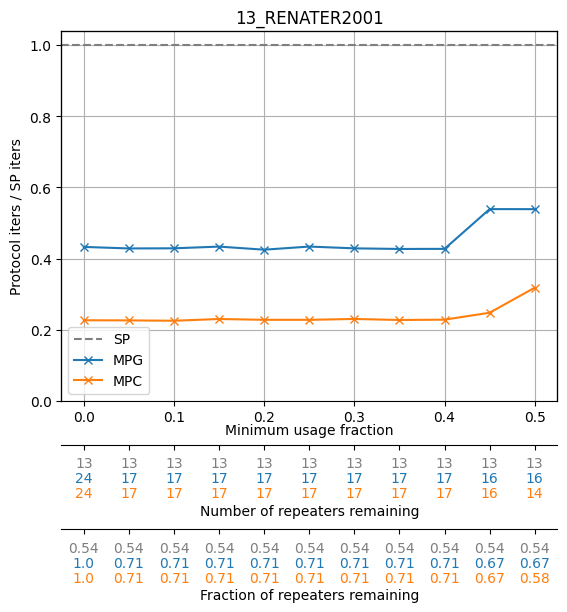

<Figure size 700x600 with 0 Axes>

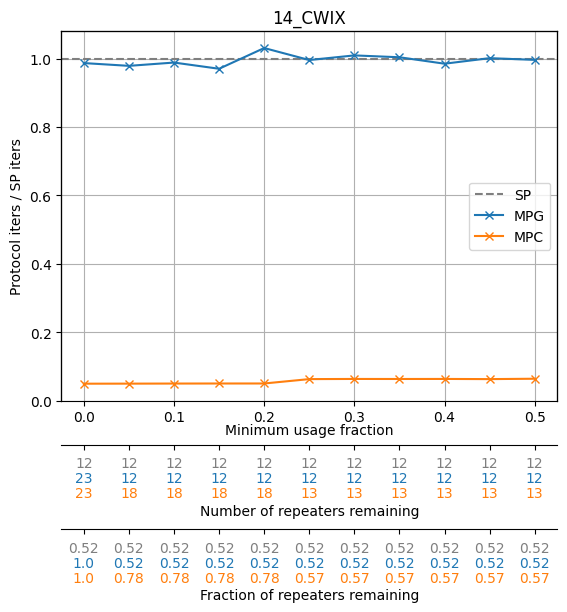

<Figure size 700x600 with 0 Axes>

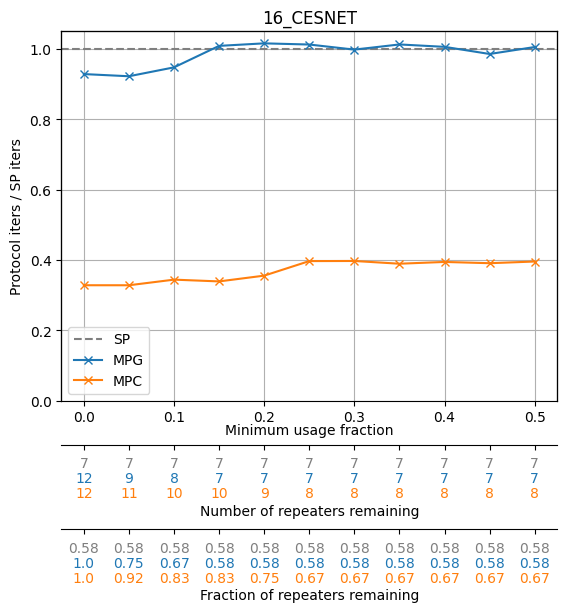

<Figure size 700x600 with 0 Axes>

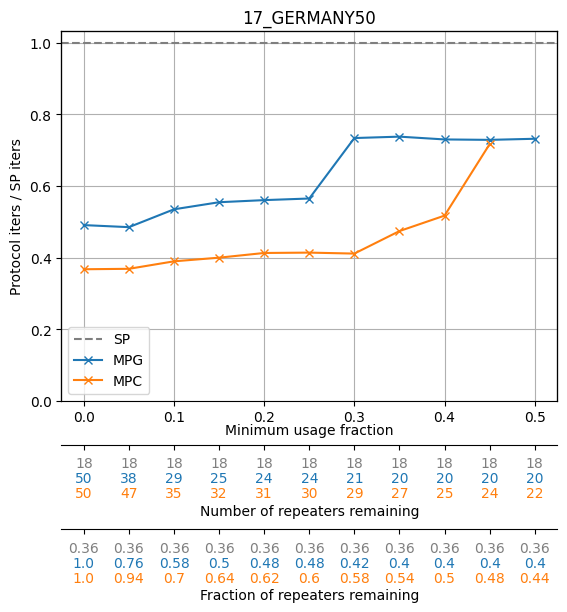

<Figure size 700x600 with 0 Axes>

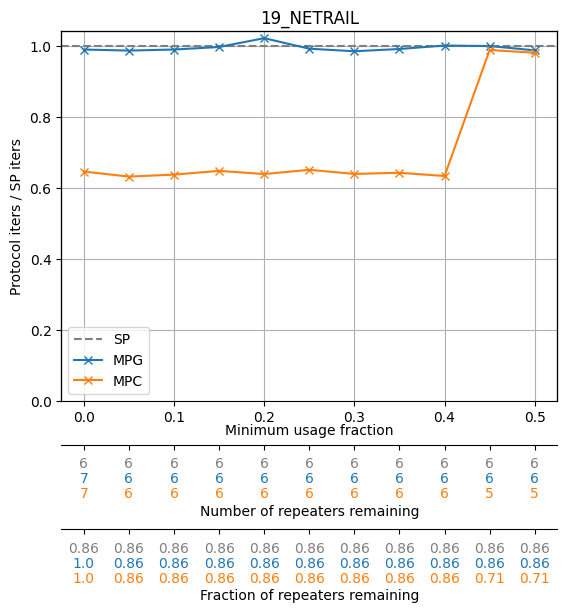

<Figure size 700x600 with 0 Axes>

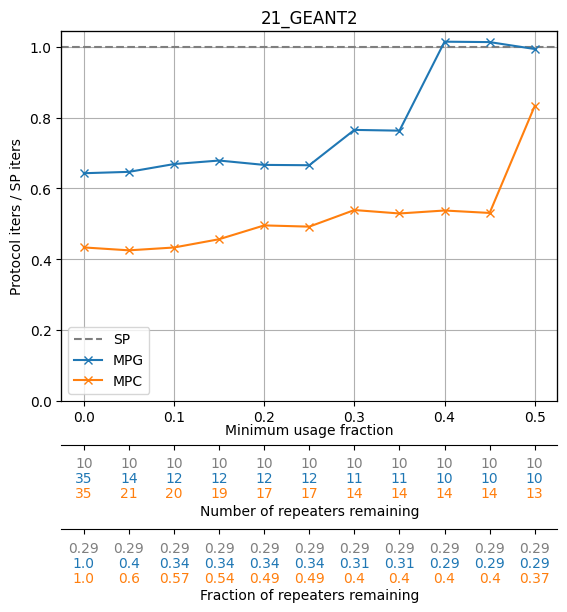

<Figure size 700x600 with 0 Axes>

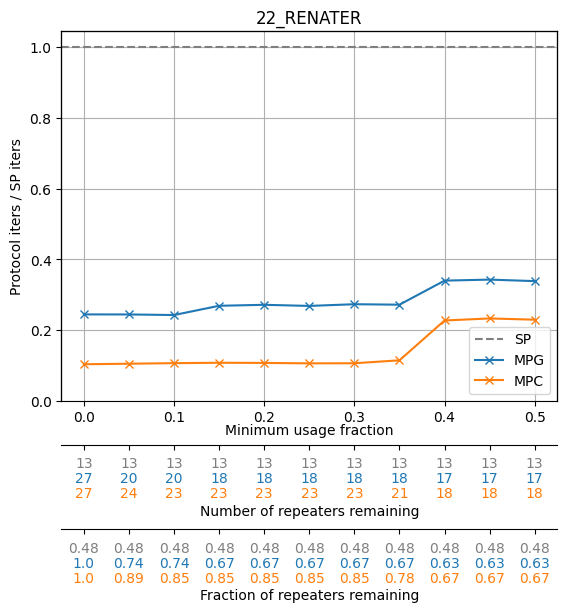

<Figure size 700x600 with 0 Axes>

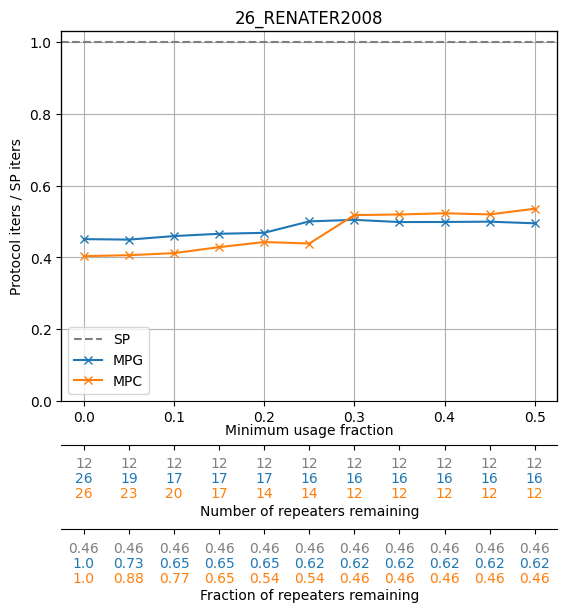

<Figure size 700x600 with 0 Axes>

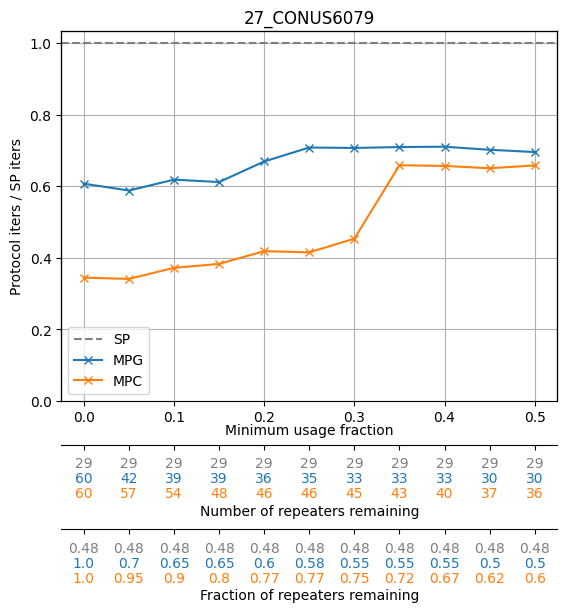

<Figure size 700x600 with 0 Axes>

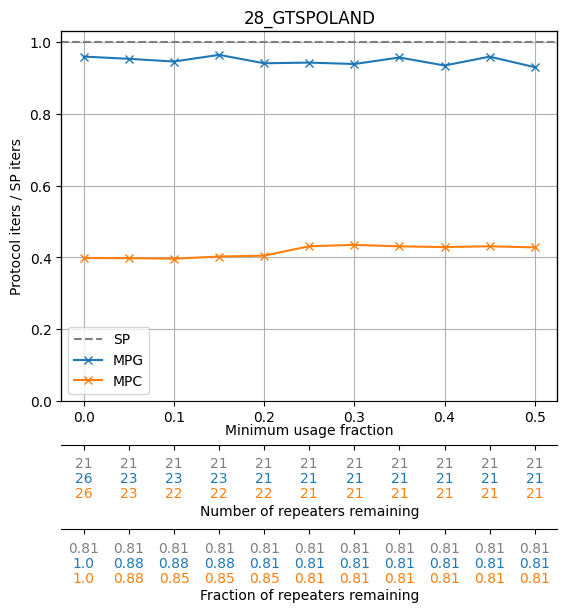

<Figure size 700x600 with 0 Axes>

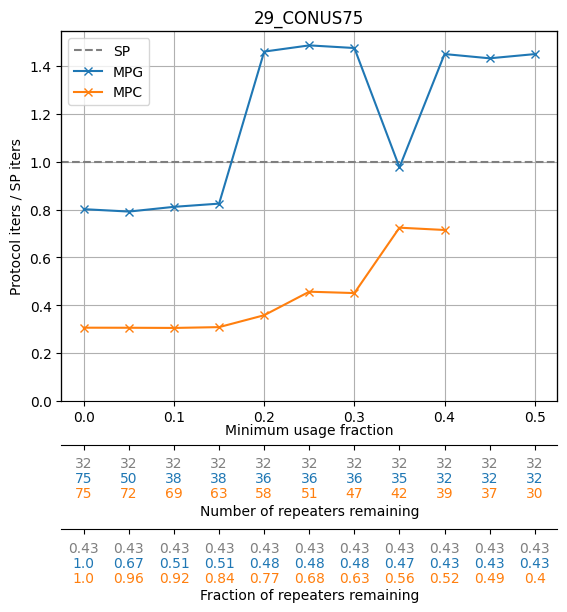

<Figure size 700x600 with 0 Axes>

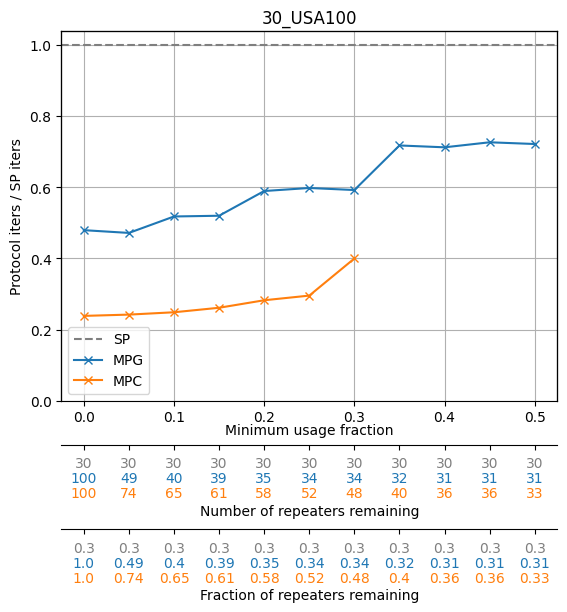

<Figure size 700x600 with 0 Axes>

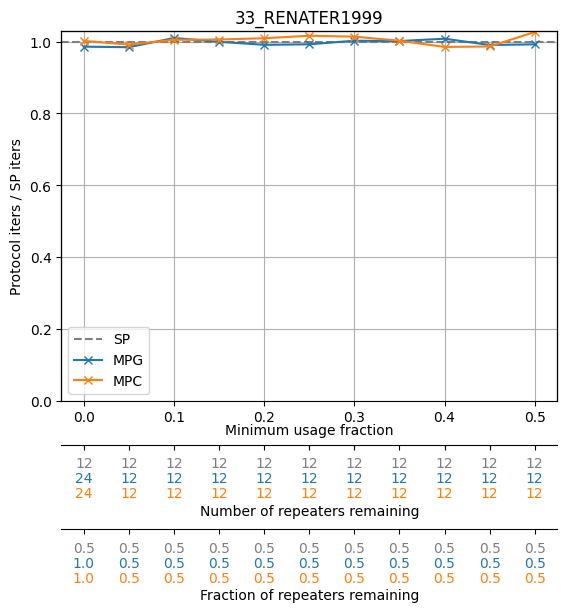

<Figure size 700x600 with 0 Axes>

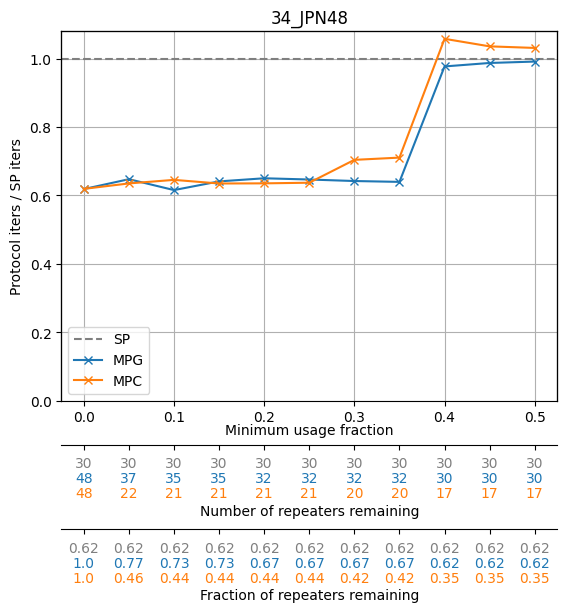

<Figure size 700x600 with 0 Axes>

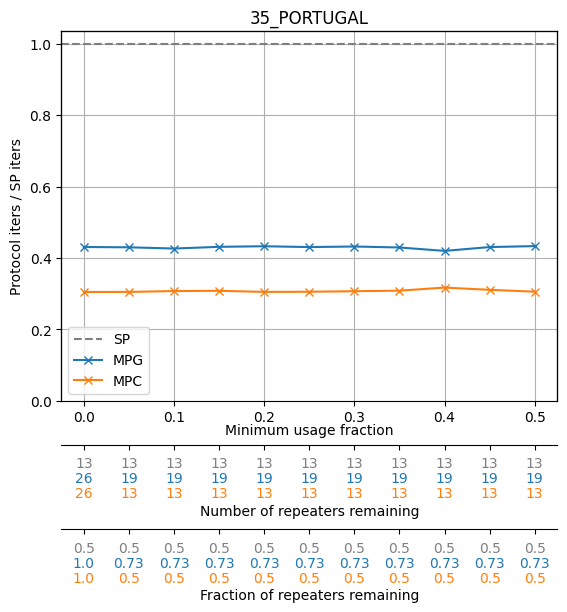

<Figure size 700x600 with 0 Axes>

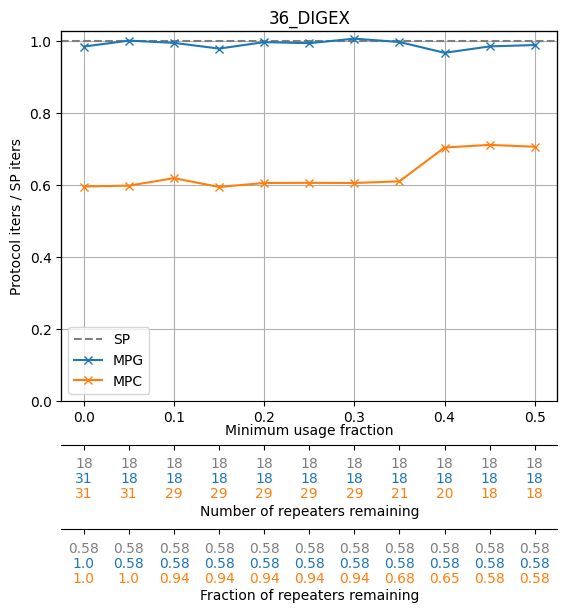

<Figure size 700x600 with 0 Axes>

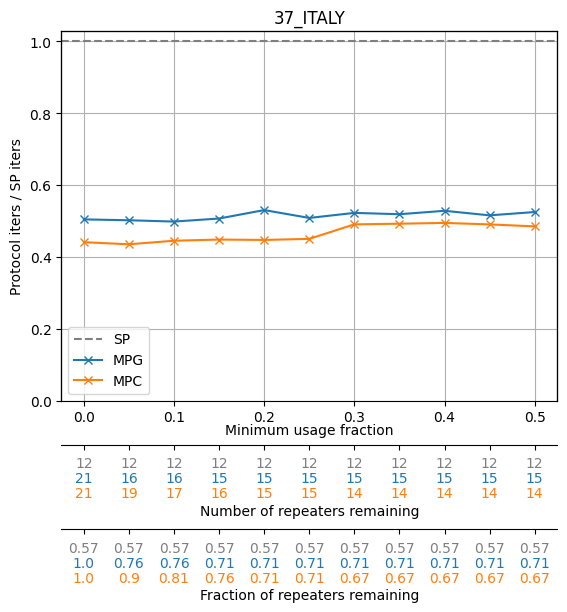

<Figure size 700x600 with 0 Axes>

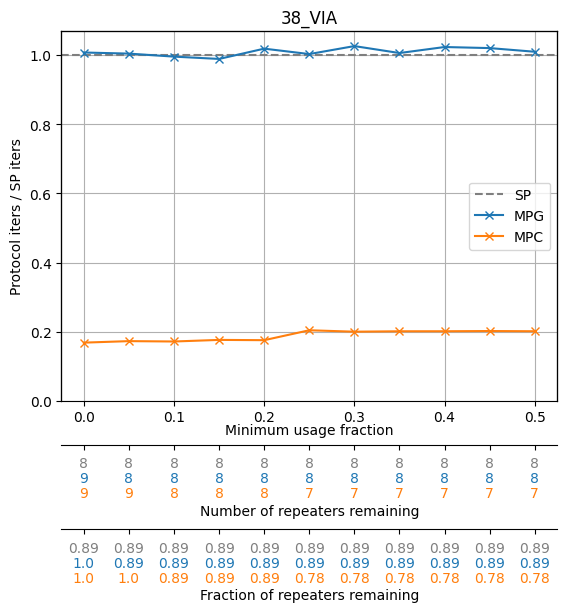

<Figure size 700x600 with 0 Axes>

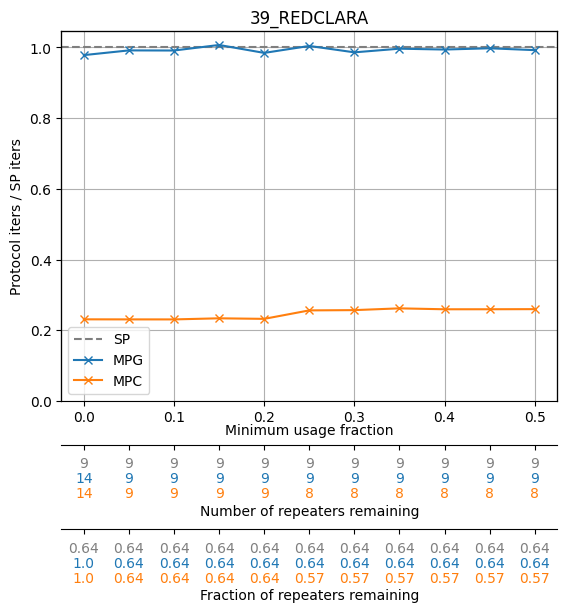

<Figure size 700x600 with 0 Axes>

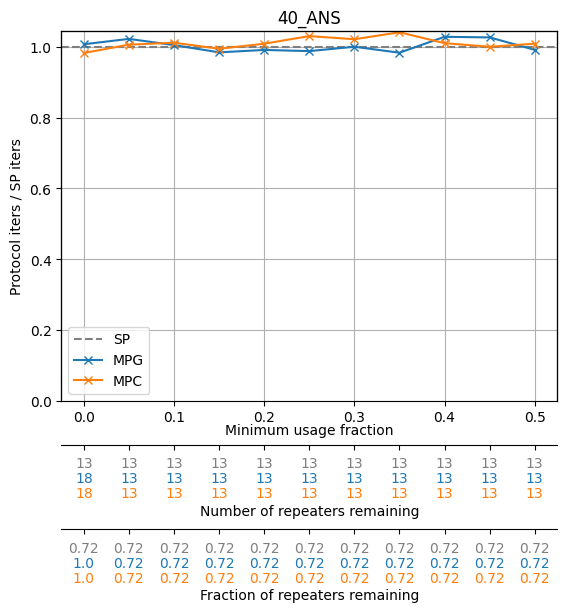

<Figure size 700x600 with 0 Axes>

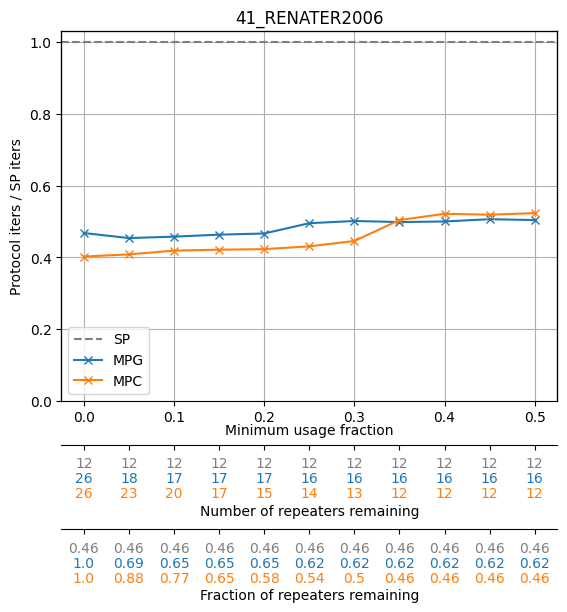

<Figure size 700x600 with 0 Axes>

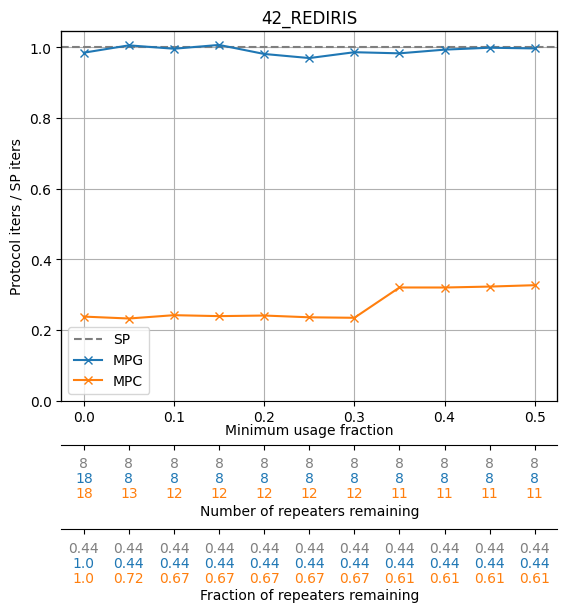

<Figure size 700x600 with 0 Axes>

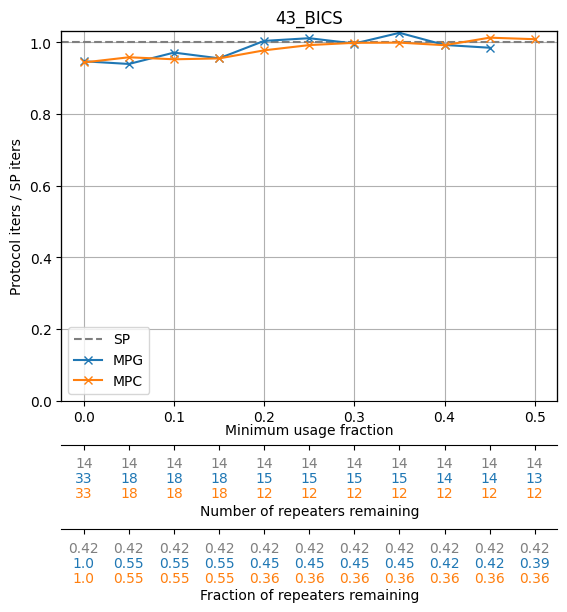

<Figure size 700x600 with 0 Axes>

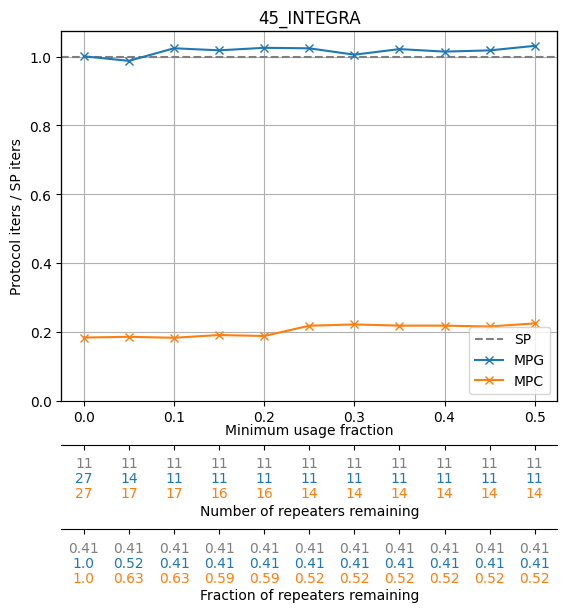

<Figure size 700x600 with 0 Axes>

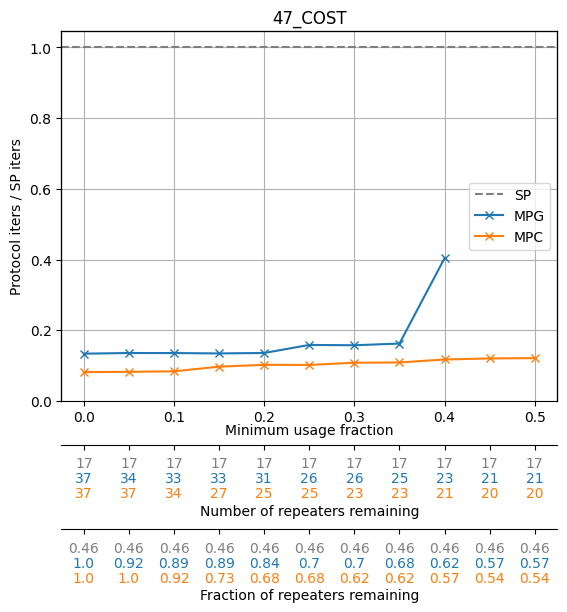

<Figure size 700x600 with 0 Axes>

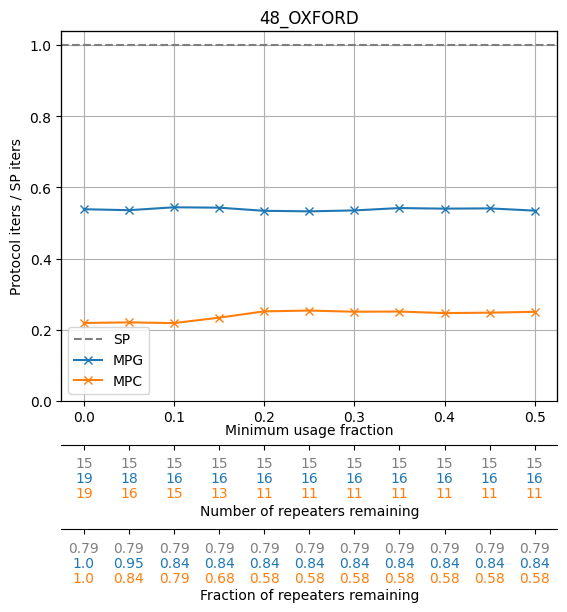

<Figure size 700x600 with 0 Axes>

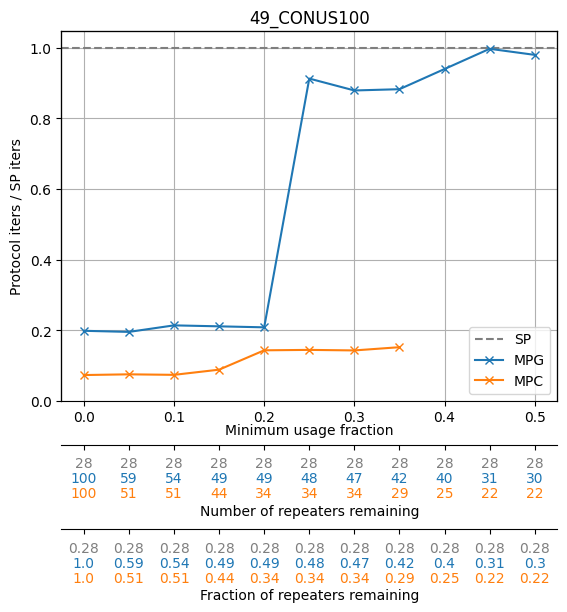

<Figure size 700x600 with 0 Axes>

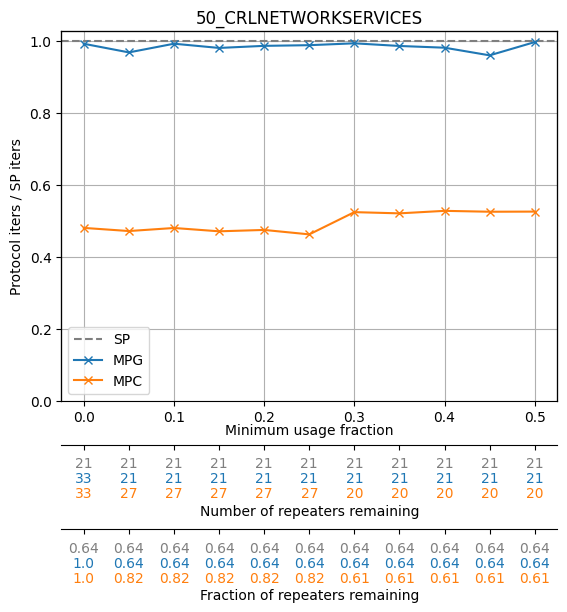

<Figure size 700x600 with 0 Axes>

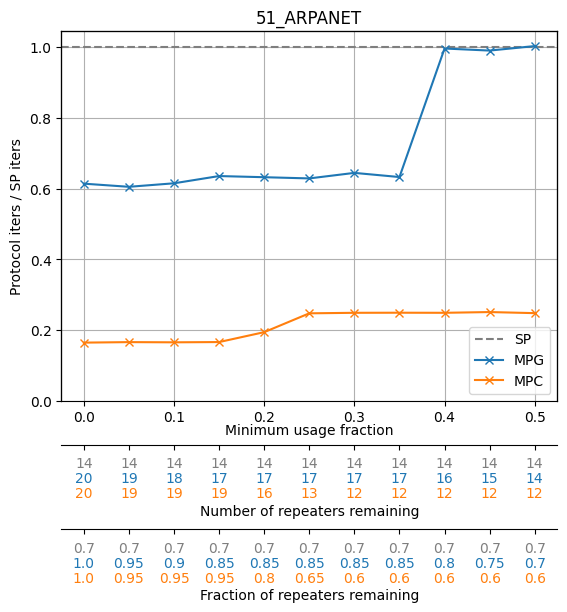

<Figure size 700x600 with 0 Axes>

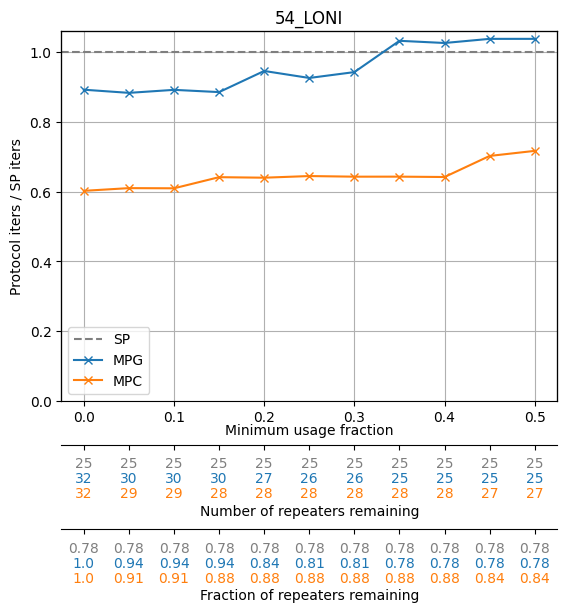

<Figure size 700x600 with 0 Axes>

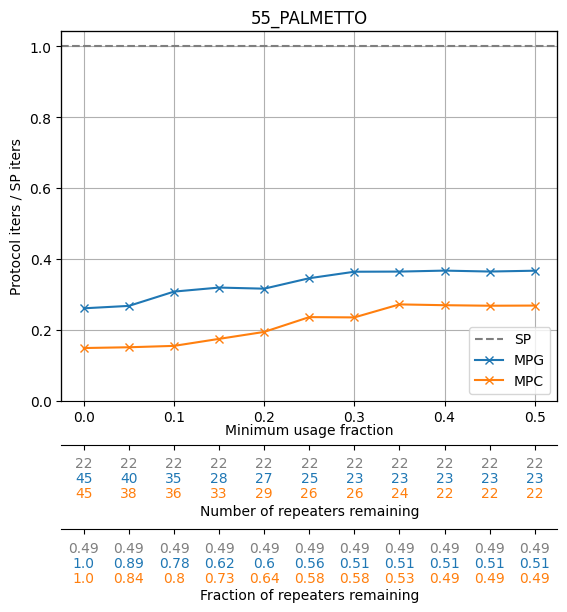

<Figure size 700x600 with 0 Axes>

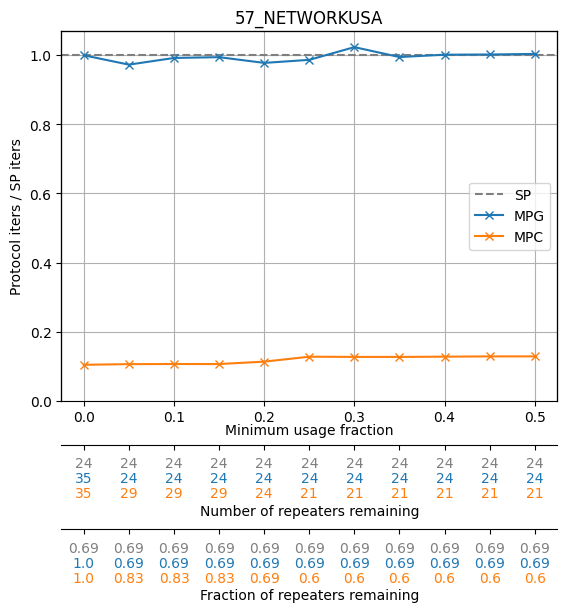

<Figure size 700x600 with 0 Axes>

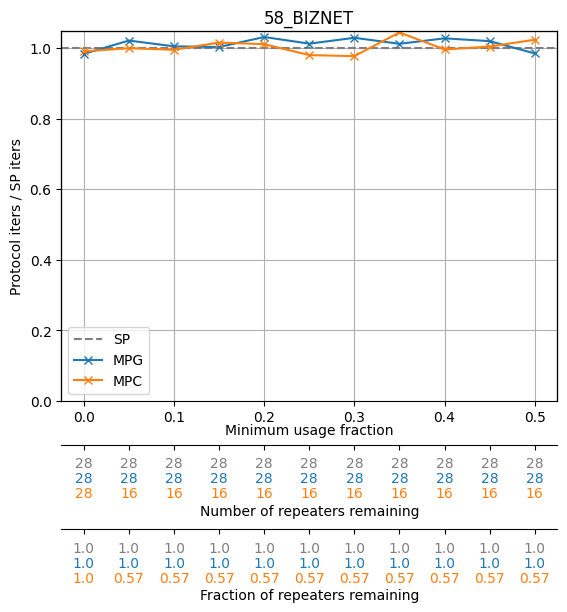

<Figure size 700x600 with 0 Axes>

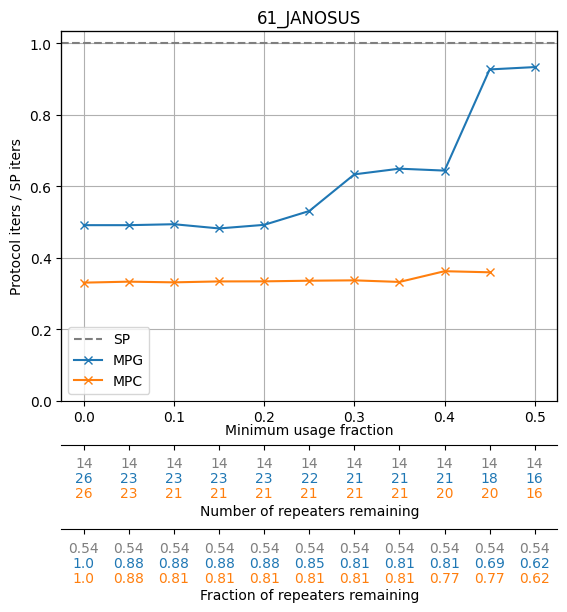

<Figure size 700x600 with 0 Axes>

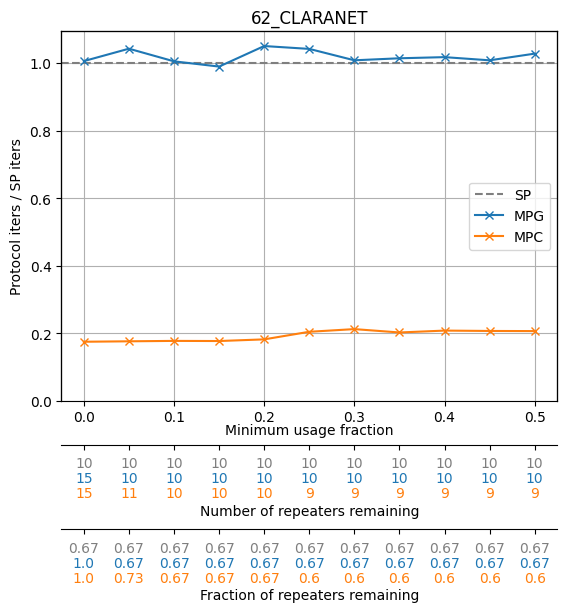

<Figure size 700x600 with 0 Axes>

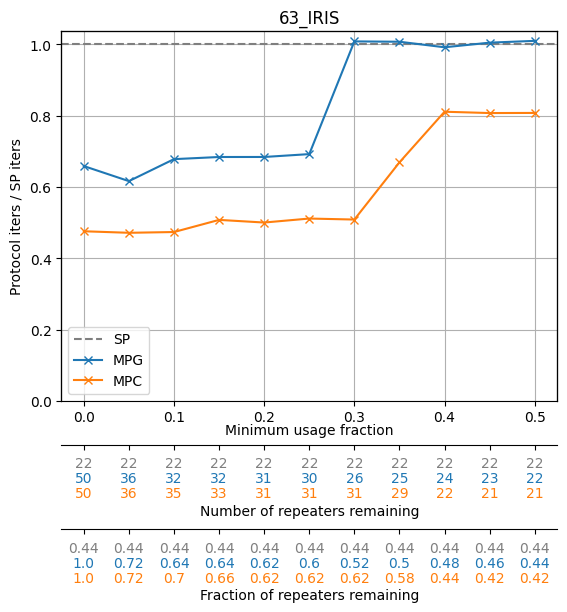

<Figure size 700x600 with 0 Axes>

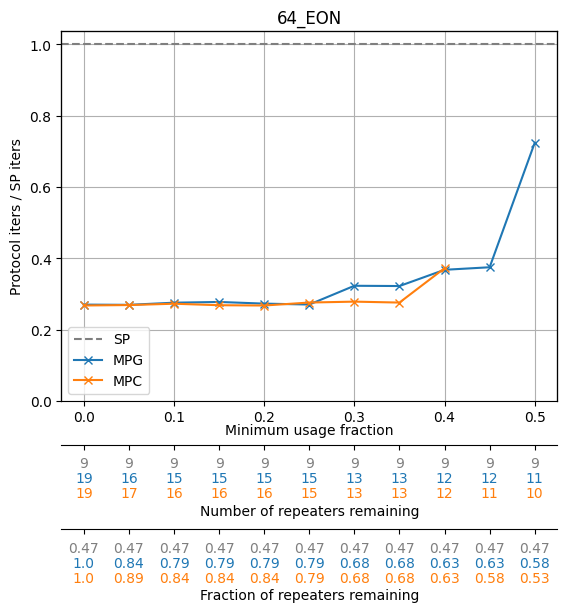

<Figure size 700x600 with 0 Axes>

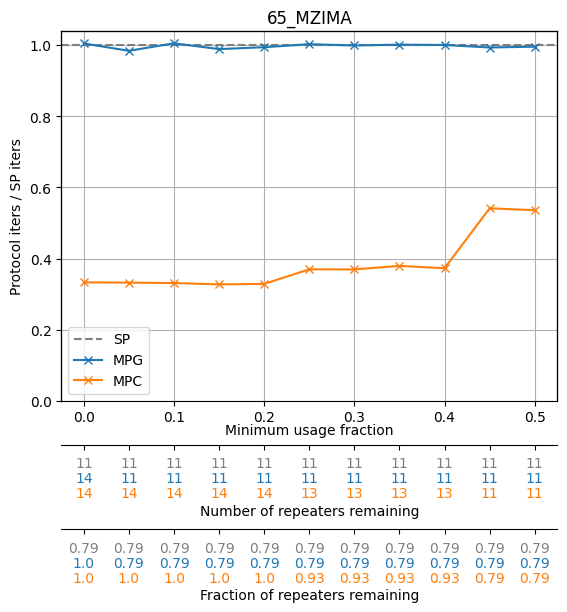

<Figure size 700x600 with 0 Axes>

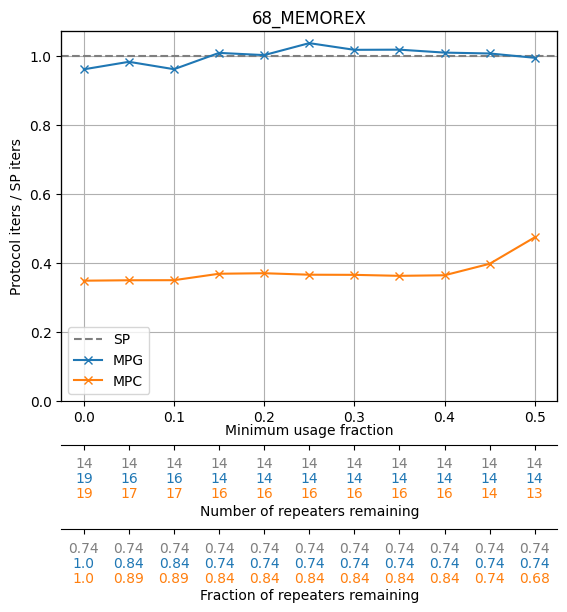

<Figure size 700x600 with 0 Axes>

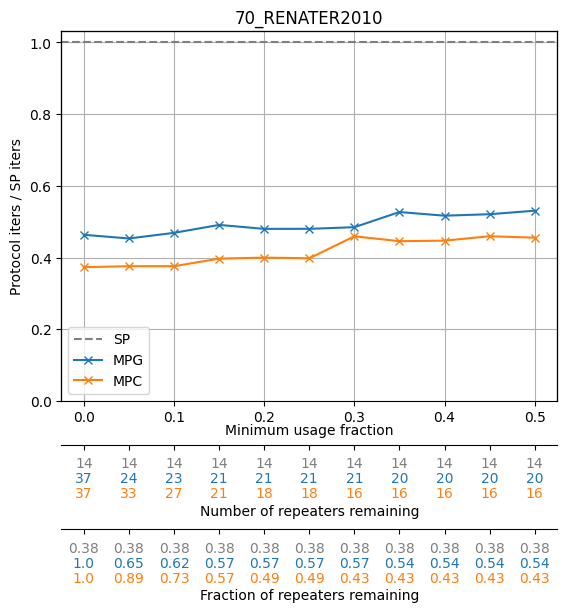

<Figure size 700x600 with 0 Axes>

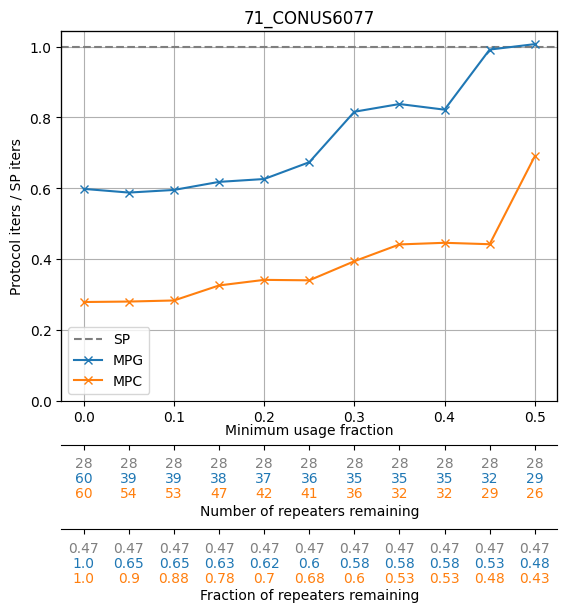

<Figure size 700x600 with 0 Axes>

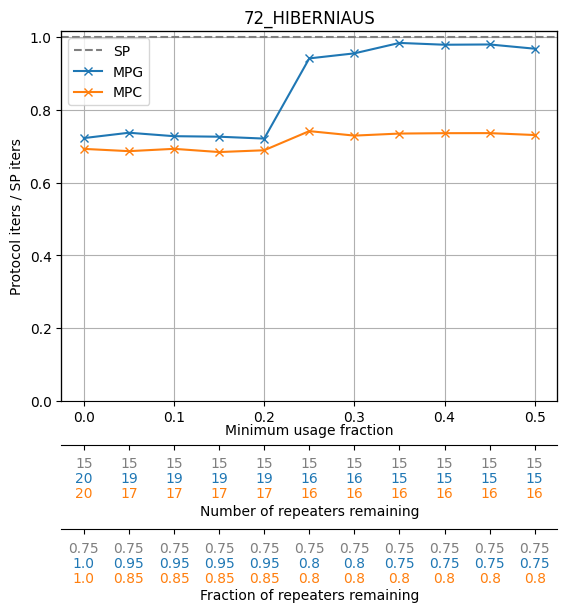

<Figure size 700x600 with 0 Axes>

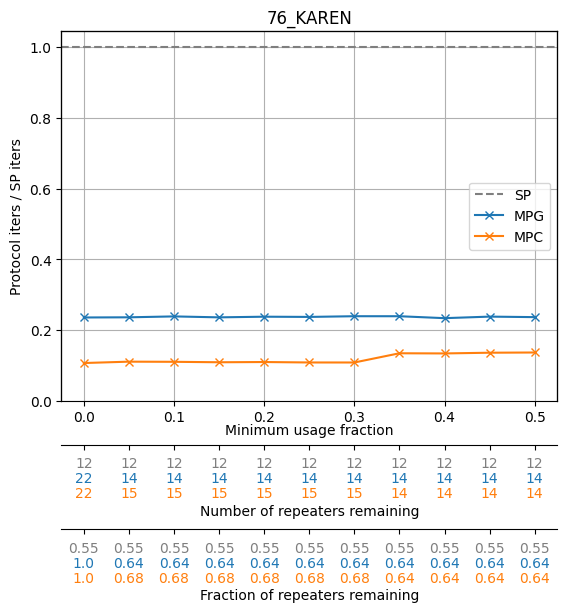

<Figure size 700x600 with 0 Axes>

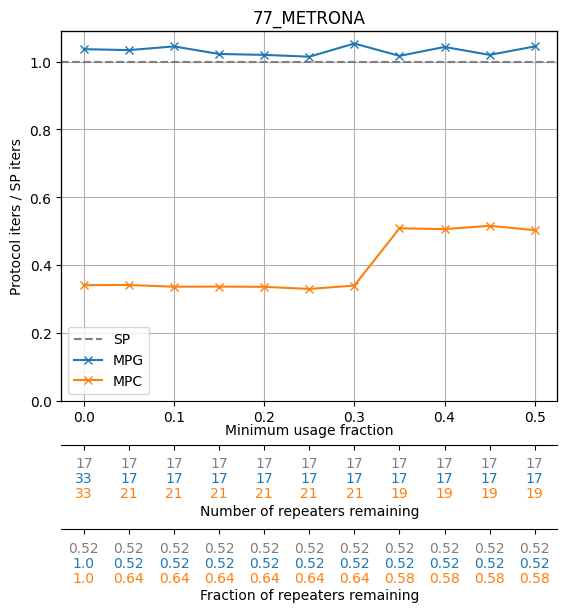

<Figure size 700x600 with 0 Axes>

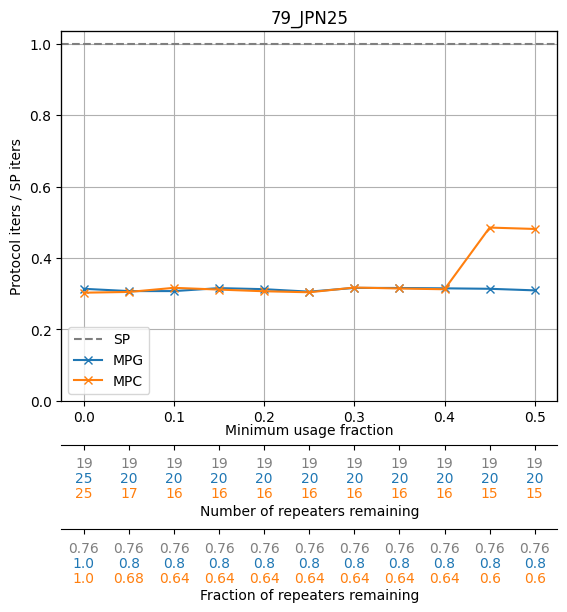

<Figure size 700x600 with 0 Axes>

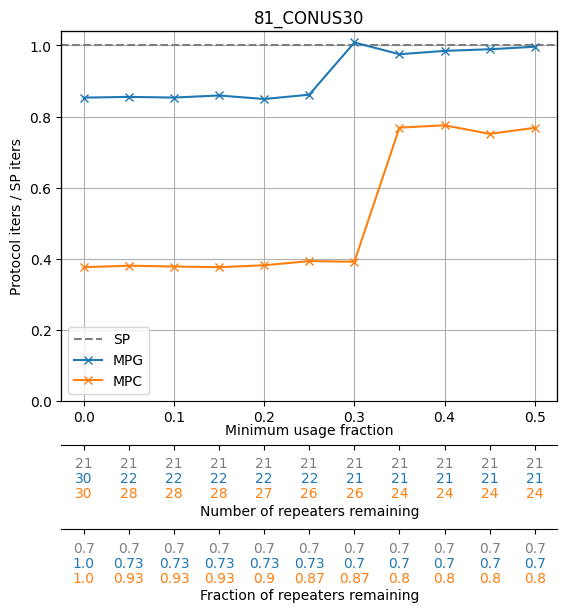

<Figure size 700x600 with 0 Axes>

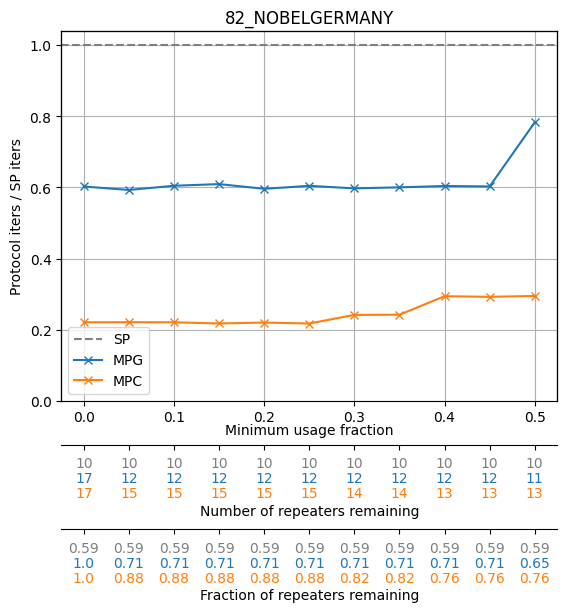

<Figure size 700x600 with 0 Axes>

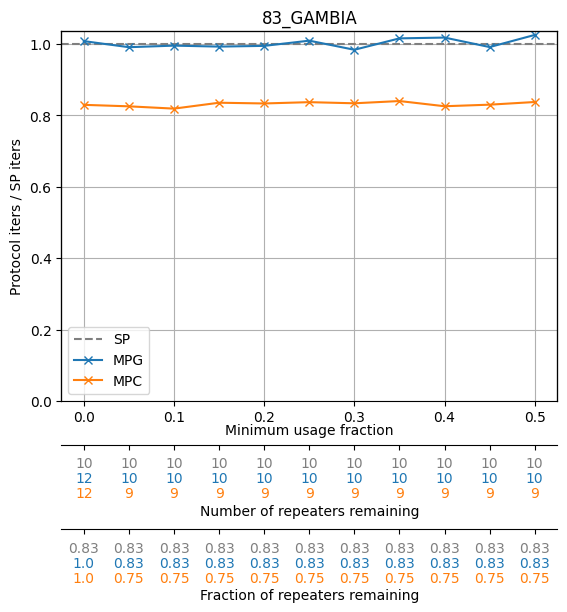

<Figure size 700x600 with 0 Axes>

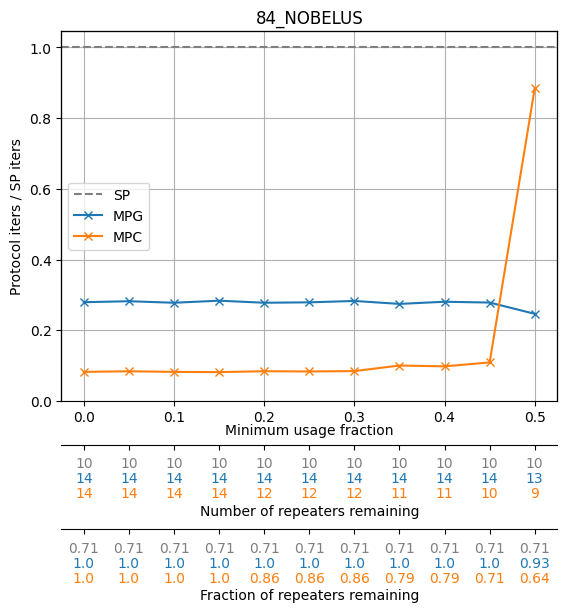

<Figure size 700x600 with 0 Axes>

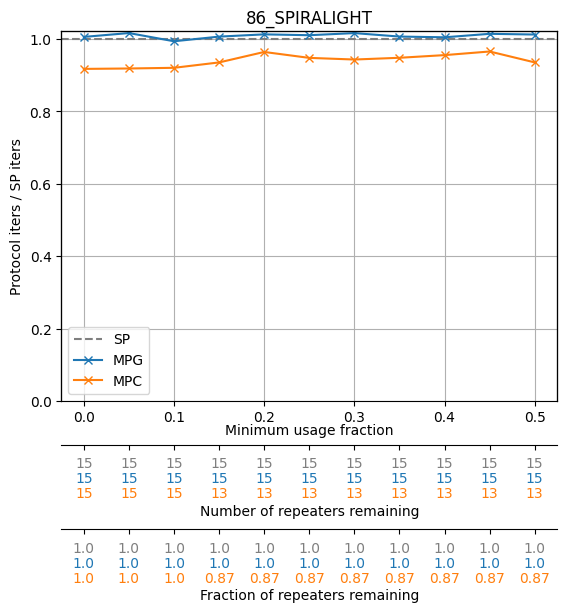

<Figure size 700x600 with 0 Axes>

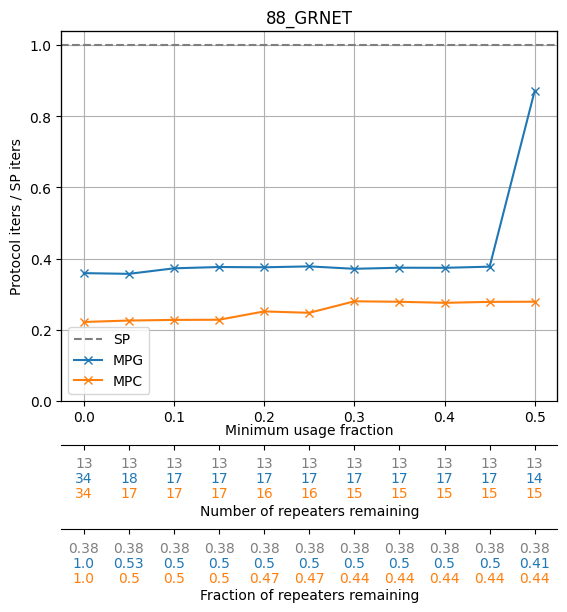

<Figure size 700x600 with 0 Axes>

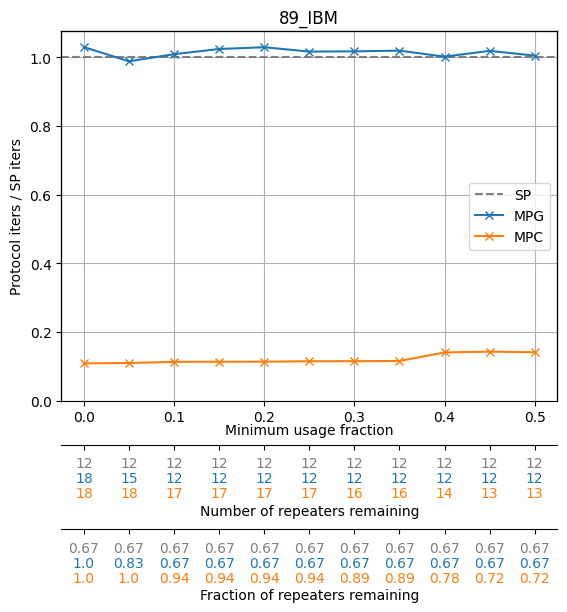

<Figure size 700x600 with 0 Axes>

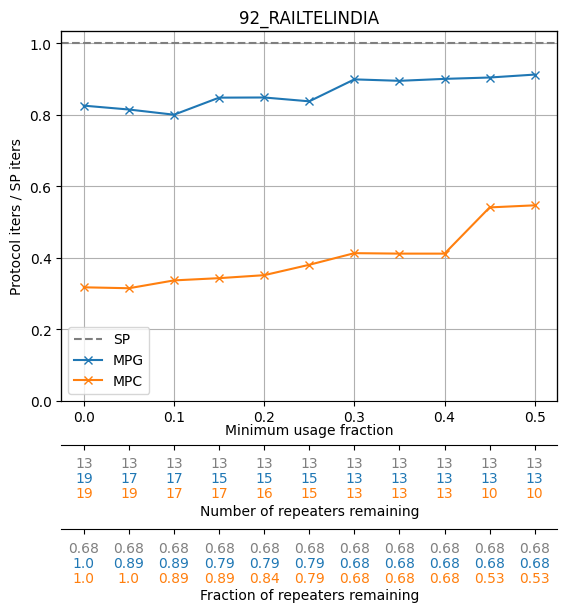

<Figure size 700x600 with 0 Axes>

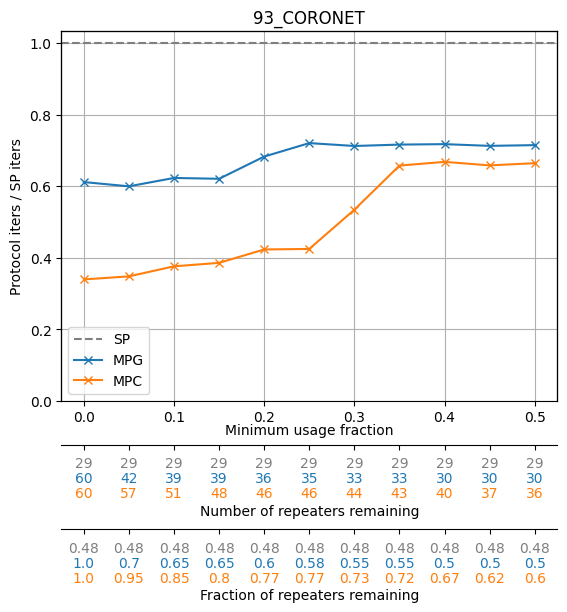

<Figure size 700x600 with 0 Axes>

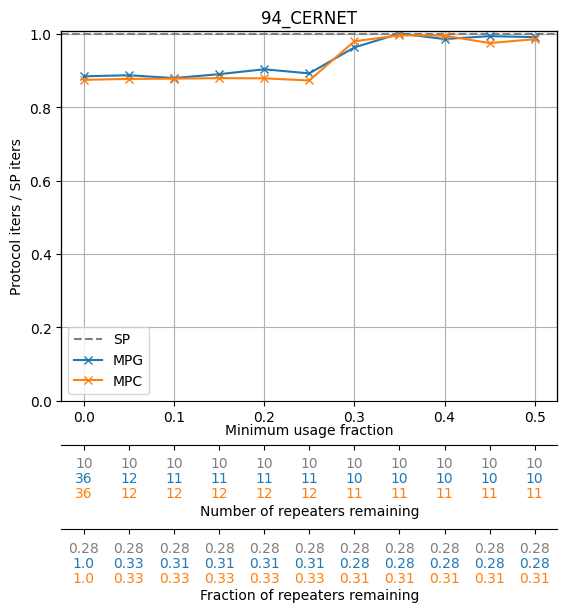

<Figure size 700x600 with 0 Axes>

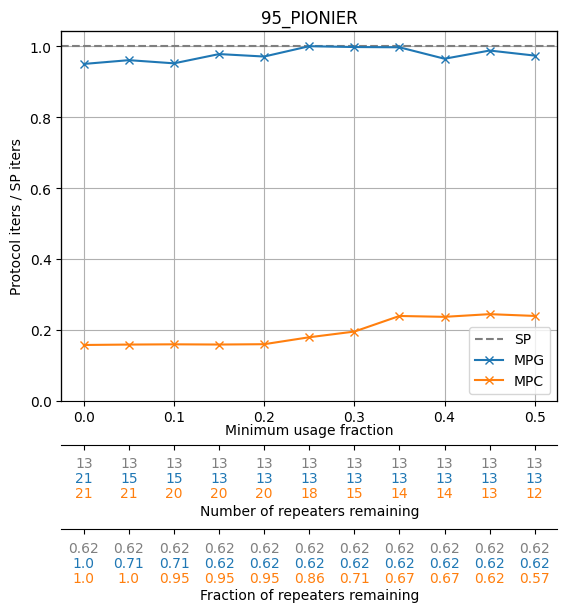

<Figure size 700x600 with 0 Axes>

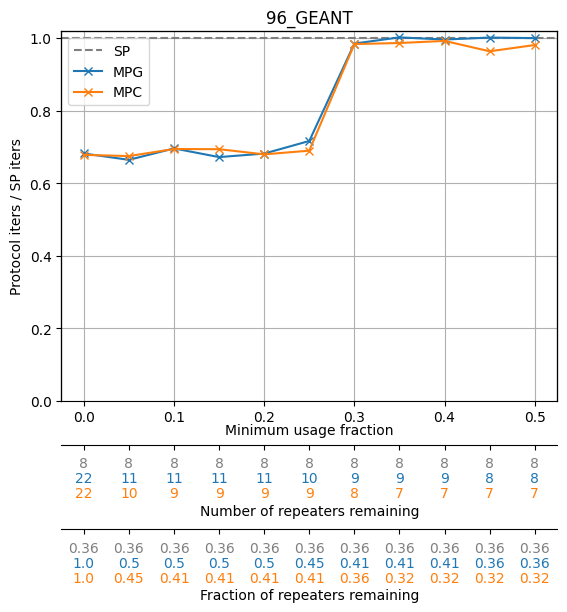

<Figure size 700x600 with 0 Axes>

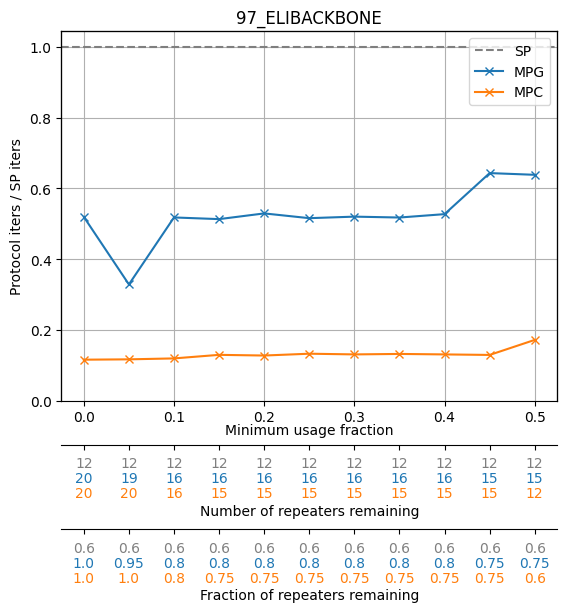

<Figure size 700x600 with 0 Axes>

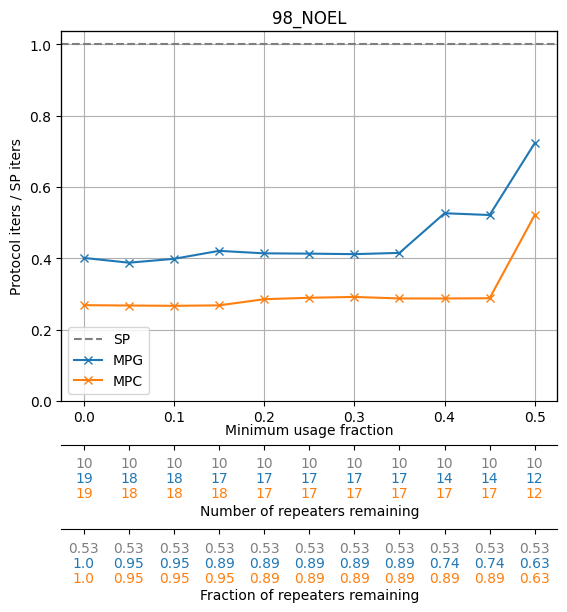

<Figure size 700x600 with 0 Axes>

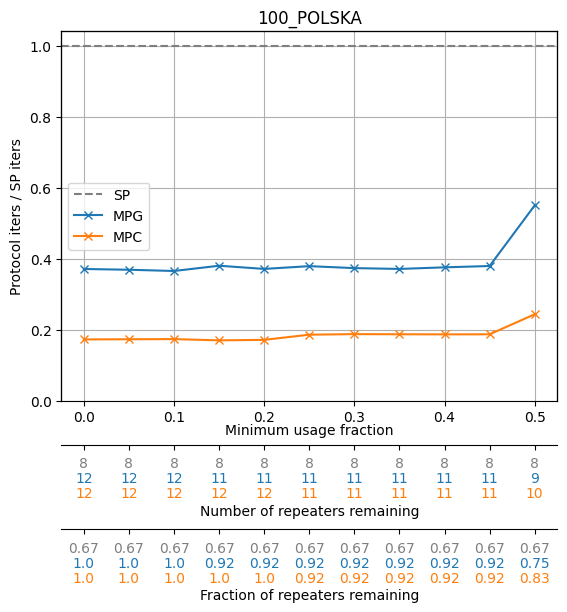

<Figure size 700x600 with 0 Axes>

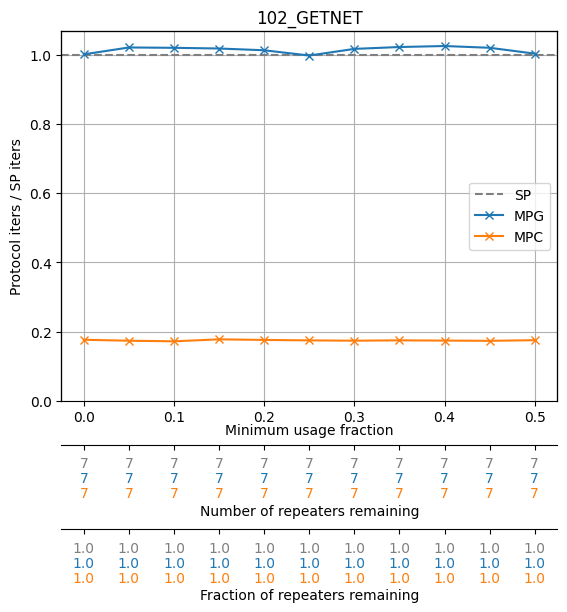

<Figure size 700x600 with 0 Axes>

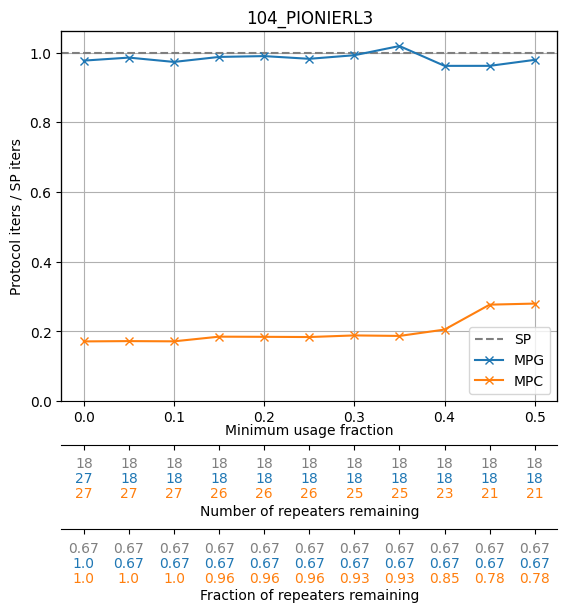

<Figure size 700x600 with 0 Axes>

In [102]:
for i in mpc_trimmed_iters_dict:

    # remove this if need to run!
    #break

    if i in bad_indices or i in temp_filter or i==101:
        continue

    SP_iter = sp_iters_mean_dict[i]

    mufs = np.arange(0,0.55,0.05)
    mpg_iters_y = list(mpg_trimmed_iters_dict[i].values())
    mpc_iters_y = list(mpc_trimmed_iters_dict[i].values())

    mpg_iters_y = [_/SP_iter for _ in mpg_iters_y]
    mpc_iters_y = [_/SP_iter for _ in mpc_iters_y]

    fig, ax1 = plt.subplots()

    plt.figure(figsize=(7, 6))

    ax1.axhline(y=1, linestyle='--', color='tab:gray', label='SP')
    ax1.plot(mufs, mpg_iters_y, marker='x', label='MPG')
    ax1.plot(mufs, mpc_iters_y, marker='x', label='MPC')


    rep_num_l_sp = []
    rep_frac_l_sp = []
    rep_num_l_mpg = []
    rep_frac_l_mpg = []
    rep_num_l_mpc = []
    rep_frac_l_mpc = []
    rep_num_l_sp = []

    for muf,iter in zip(mufs, mpg_iters_y):
        rep_num = trimmed_real_topos_reps_mpg[(i,round(float(muf),2))]
        rep_frac = round(rep_num/real_topo[i].number_of_nodes(),2)
        rep_num_l_mpg.append(rep_num)
        rep_frac_l_mpg.append(rep_frac)

        rep_num_l_sp.append(len(real_topo_reps_SP[i]))
        rep_frac_l_sp.append(round(len(real_topo_reps_SP[i])/real_topo[i].number_of_nodes(),2))
            
    for muf,iter in zip(mufs, mpc_iters_y):
        rep_num = trimmed_real_topos_reps_mpc[(i,round(float(muf),2))]
        rep_frac = round(rep_num/real_topo[i].number_of_nodes(),2)
        rep_num_l_mpc.append(rep_num)
        rep_frac_l_mpc.append(rep_frac)



    ax1.set_xlabel('Minimum usage fraction', labelpad=-1)
    ax1.set_ylabel('Protocol iters / SP iters')
    ax1.set_ylim(ymin=0)


    ax2 = ax1.twiny()
    ax2.xaxis.set_ticks_position('bottom')
    ax2.xaxis.set_label_position('bottom')
    ax2.spines['bottom'].set_position(('outward', 32))
    ax2.set_xticks(np.arange(0,0.55,0.05))
    ax2.set_xbound(ax1.get_xbound())
    ax2.set_xticklabels([f' \n ' for _ in rep_num_l_mpg])
    ax2.set_xlabel('Number of repeaters remaining', labelpad=14)
    for muf, mpg_n, mpc_n, sp_n in zip(mufs, rep_num_l_mpg, rep_num_l_mpc, rep_num_l_sp):
        ax2.text(muf, -0.15, f'{sp_n}', color='tab:gray', ha='center', va='top', fontsize=10, transform=ax2.get_xaxis_transform())
        ax2.text(muf, -0.19, f'{mpg_n}', color='tab:blue', ha='center', va='top', fontsize=10, transform=ax2.get_xaxis_transform())
        ax2.text(muf, -0.23, f'{mpc_n}', color='tab:orange', ha='center', va='top', fontsize=10, transform=ax2.get_xaxis_transform())


    ax3 = ax2.twiny()
    ax3.xaxis.set_ticks_position('bottom')
    ax3.xaxis.set_label_position('bottom')
    ax3.spines['bottom'].set_position(('outward', 92))
    ax3.set_xticks(np.arange(0,0.55,0.05))
    ax3.set_xbound(ax1.get_xbound())
    ax3.set_xticklabels([f' \n ' for _ in rep_num_l_mpg])
    ax3.set_xlabel('Fraction of repeaters remaining', labelpad=14)
    for muf, mpg_f, mpc_f, sp_f in zip(mufs, rep_frac_l_mpg, rep_frac_l_mpc, rep_frac_l_sp):
        ax3.text(muf, -0.38, f'{sp_f}', color='tab:gray', ha='center', va='top', fontsize=10, transform=ax3.get_xaxis_transform())
        ax3.text(muf, -0.42, f'{mpg_f}', color='tab:blue', ha='center', va='top', fontsize=10, transform=ax3.get_xaxis_transform())
        ax3.text(muf, -0.46, f'{mpc_f}', color='tab:orange', ha='center', va='top', fontsize=10, transform=ax3.get_xaxis_transform())



    ax1.grid(True)
    ax1.legend()
    ax1.set_title(f'{i}_{file_names[i]}')

    save_remove_rep_stats = True
    if save_remove_rep_stats:
        for clus in iters_clusters:
             if i in iters_clusters[clus]:
                break
        fig.savefig(f'images\\muf_remove_graph\\ratio_of_SP\\cluster {clus}\\' + f'{i}_{file_names[i]}_removerepstats_SPscaled.png', bbox_inches='tight')
        fig.savefig(f'images\\muf_remove_graph\\ratio_of_SP\\all\\' + f'{i}_{file_names[i]}_removerepstats_SPscaled.png', bbox_inches='tight')
    plt.show()

#### All

cluster 1
MPG: [0.91, 0.91, 0.92, 0.92, 0.93, 0.93, 0.96, 0.97, 0.97, 0.99, 0.99]
MPC: [0.71, 0.72, 0.72, 0.73, 0.73, 0.74, 0.75, 0.79, 0.78, 0.8, 0.85]
cluster 2
MPG: [0.97, 0.97, 0.97, 0.97, 0.98, 0.98, 0.99, 0.99, 0.98, 0.99, 0.99]
MPC: [0.22, 0.22, 0.22, 0.22, 0.22, 0.23, 0.23, 0.25, 0.26, 0.27, 0.29]
cluster 3
MPG: [0.37, 0.35, 0.37, 0.38, 0.38, 0.42, 0.43, 0.43, 0.45, 0.47, 0.48]
MPC: [0.23, 0.23, 0.23, 0.24, 0.25, 0.25, 0.27, 0.29, 0.31, 0.32, 0.37]
cluster 4
MPG: [0.68, 0.67, 0.68, 0.7, 0.74, 0.75, 0.8, 0.79, 0.87, 0.88, 0.93]
MPC: [0.42, 0.42, 0.43, 0.44, 0.45, 0.46, 0.5, 0.54, 0.57, 0.6, 0.64]
all topos
MPG: [0.71, 0.71, 0.71, 0.72, 0.74, 0.75, 0.78, 0.77, 0.8, 0.82, 0.83]
MPC: [0.36, 0.36, 0.36, 0.37, 0.37, 0.38, 0.4, 0.42, 0.44, 0.46, 0.49]


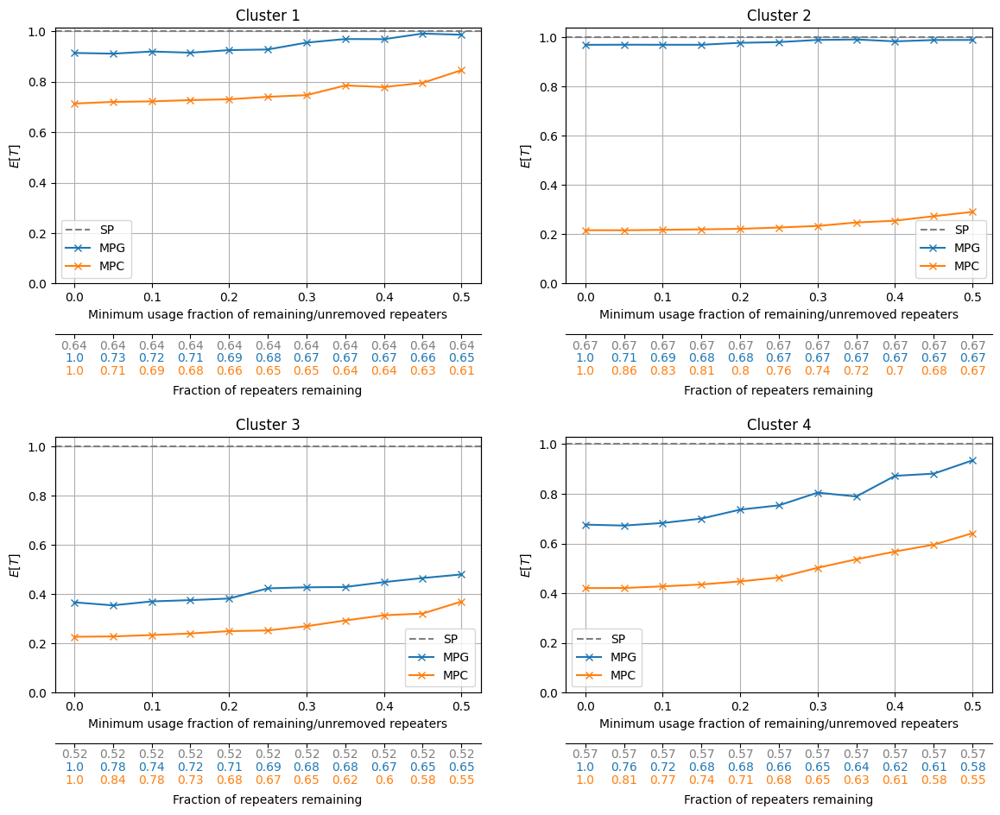

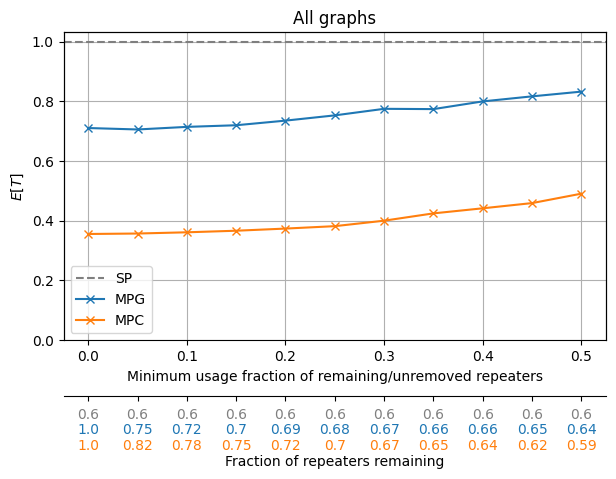

In [137]:
clusters_d_l_mpg = {n:[] for n in range(1,5)}
clusters_d_l_mpc = {n:[] for n in range(1,5)}

clusters_d_repfrac_sp = {n:[] for n in range(1,5)}
clusters_d_repfrac_mpg = {n:[] for n in range(1,5)}
clusters_d_repfrac_mpc = {n:[] for n in range(1,5)}


for i in mpc_trimmed_iters_dict:
    if i in bad_indices or i in temp_filter or i==101:
        continue

    SP_iter = sp_iters_mean_dict[i]

    mpg_iters_y = list(mpg_trimmed_iters_dict[i].values())
    mpc_iters_y = list(mpc_trimmed_iters_dict[i].values())

    mpg_iters_y = [_/SP_iter for _ in mpg_iters_y]
    mpc_iters_y = [_/SP_iter for _ in mpc_iters_y]        

    rep_frac_l_sp = []
    rep_frac_l_mpg = []
    for muf, iter in zip(mufs, mpg_iters_y):
        rep_num = trimmed_real_topos_reps_mpg[(i, round(float(muf), 2))]
        rep_frac = round(rep_num / real_topo[i].number_of_nodes(), 2)
        rep_frac_l_mpg.append(rep_frac)
        
        rep_frac_l_sp.append(round(len(real_topo_reps_SP[i])/real_topo[i].number_of_nodes(),2))
    rep_frac_l_mpc = []
    for muf, iter in zip(mufs, mpc_iters_y):
        rep_num = trimmed_real_topos_reps_mpc[(i, round(float(muf), 2))]
        rep_frac = round(rep_num / real_topo[i].number_of_nodes(), 2)
        rep_frac_l_mpc.append(rep_frac)
    
    
    for n in range(1,5):
        if i in iters_clusters[n]:
            clusters_d_l_mpg[n].append(mpg_iters_y)
            clusters_d_l_mpc[n].append(mpc_iters_y)
            clusters_d_repfrac_mpg[n].append(rep_frac_l_mpg)
            clusters_d_repfrac_mpc[n].append(rep_frac_l_mpc)
            clusters_d_repfrac_sp[n].append(rep_frac_l_sp)


clusters_d_mean_mpg = {}
clusters_d_mean_mpc = {}
clusters_d_mean_repfrac_mpg = {}
clusters_d_mean_repfrac_mpc = {}
clusters_d_mean_repfrac_sp = {}
for n in range(1,5):
    l = []
    for muf in range(11):
        l.append(np.mean([g[muf] for g in clusters_d_l_mpg[n] if g[muf]!=np.inf]))
    clusters_d_mean_mpg[n] = l

    l = []
    for muf in range(11):
        l.append(np.mean([g[muf] for g in clusters_d_l_mpc[n] if g[muf]!=np.inf]))
    clusters_d_mean_mpc[n] = l

    l = []
    for muf in range(11):
        l.append(round(np.mean([g[muf] for g in clusters_d_repfrac_mpg[n]]),2))
    clusters_d_mean_repfrac_mpg[n] = l

    l = []
    for muf in range(11):
        l.append(round(np.mean([g[muf] for g in clusters_d_repfrac_mpc[n]]),2))
    clusters_d_mean_repfrac_mpc[n] = l

    l = []
    for muf in range(11):
        l.append(round(np.mean([g[muf] for g in clusters_d_repfrac_sp[n]]),2))
    clusters_d_mean_repfrac_sp[n] = l


mufs = np.arange(0, 0.55, 0.05)
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0.6)

for clus in range(1,5):
    ax1 = axes[clus-1]    
    ax1.axhline(y=1, linestyle='--', color='tab:gray', label='SP')
    ax1.plot(mufs, clusters_d_mean_mpg[clus], marker='x', label='MPG')
    ax1.plot(mufs, clusters_d_mean_mpc[clus], marker='x', label='MPC')
    ax1.set_xlabel('Minimum usage fraction of remaining/unremoved repeaters')
    ax1.set_ylabel('$E[T]$')
    ax1.set_ylim(ymin=0)

    ax2 = ax1.twiny()
    ax2.xaxis.set_ticks_position('bottom')
    ax2.xaxis.set_label_position('bottom')
    ax2.spines['bottom'].set_position(('outward', 42))
    ax2.set_xticks(np.arange(0,0.55,0.05))
    ax2.set_xbound(ax1.get_xbound())
    ax2.set_xticklabels([f' \n ' for _ in range(11)])
    ax2.set_xlabel('Fraction of repeaters remaining', labelpad=14)
    for muf, mpg_f, mpc_f, sp_f in zip(mufs, clusters_d_mean_repfrac_mpg[clus], clusters_d_mean_repfrac_mpc[clus],clusters_d_mean_repfrac_sp[clus]):
        ax2.text(muf, -0.22, f'{sp_f}', color='tab:gray', ha='center', va='top', fontsize=10, transform=ax2.get_xaxis_transform())
        ax2.text(muf, -0.27, f'{mpg_f}', color='tab:blue', ha='center', va='top', fontsize=10, transform=ax2.get_xaxis_transform())
        ax2.text(muf, -0.32, f'{mpc_f}', color='tab:orange', ha='center', va='top', fontsize=10, transform=ax2.get_xaxis_transform())

    ax1.grid(True)
    ax1.legend()
    ax1.set_title(f'Cluster {clus}')

    print(f'cluster {clus}')
    print(f'MPG: {[float(round(clusters_d_mean_mpg[clus][i],2)) for i in range(11)]}')
    print(f'MPC: {[float(round(clusters_d_mean_mpc[clus][i],2)) for i in range(11)]}')



clusters_all_mpg = [item for sublist in clusters_d_l_mpg.values() for item in sublist]
clusters_all_mpc = [item for sublist in clusters_d_l_mpc.values() for item in sublist]
clusters_all_repfrac_mpg = [item for sublist in clusters_d_repfrac_mpg.values() for item in sublist]
clusters_all_repfrac_mpc = [item for sublist in clusters_d_repfrac_mpc.values() for item in sublist]
clusters_all_repfrac_sp = [item for sublist in clusters_d_repfrac_sp.values() for item in sublist]

clusters_all_mpg_mean = [ np.mean([g[muf] for g in clusters_all_mpg if g[muf]!=np.inf]) for muf in range(11)]
clusters_all_mpc_mean = [ np.mean([g[muf] for g in clusters_all_mpc if g[muf]!=np.inf]) for muf in range(11)]
clusters_all_repfrac_mpg = [ np.mean([g[muf] for g in clusters_all_repfrac_mpg]) for muf in range(11)]
clusters_all_repfrac_mpc = [ np.mean([g[muf] for g in clusters_all_repfrac_mpc]) for muf in range(11)]
clusters_all_repfrac_sp = [ np.mean([g[muf] for g in clusters_all_repfrac_sp]) for muf in range(11)]


mufs = np.arange(0,0.55,0.05)


fig, ax1 = plt.subplots(figsize=(7, 4))

ax1.axhline(y=1, linestyle='--', color='tab:gray', label='SP')
ax1.plot(mufs, clusters_all_mpg_mean, marker='x', label='MPG')
ax1.plot(mufs, clusters_all_mpc_mean, marker='x', label='MPC')

ax1.set_xlabel('Minimum usage fraction of remaining/unremoved repeaters')
ax1.set_ylabel('$E[T]$')
ax1.set_ylim(ymin=0)

ax2 = ax1.twiny()
ax2.xaxis.set_ticks_position('bottom')
ax2.xaxis.set_label_position('bottom')
ax2.spines['bottom'].set_position(('outward', 40))
ax2.set_xticks(np.arange(0,0.55,0.05))
ax2.set_xbound(ax1.get_xbound())
ax2.set_xticklabels([f' \n ' for _ in range(11)])
ax2.set_xlabel('Fraction of repeaters remaining', labelpad=14)
for muf, mpg_f, mpc_f, sp_f in zip(mufs, clusters_all_repfrac_mpg, clusters_all_repfrac_mpc, clusters_all_repfrac_sp):
    ax2.text(muf, -0.22, f'{round(sp_f,2)}', color='tab:gray', ha='center', va='top', fontsize=10, transform=ax2.get_xaxis_transform())
    ax2.text(muf, -0.27, f'{round(mpg_f,2)}', color='tab:blue', ha='center', va='top', fontsize=10, transform=ax2.get_xaxis_transform())
    ax2.text(muf, -0.32, f'{round(mpc_f,2)}', color='tab:orange', ha='center', va='top', fontsize=10, transform=ax2.get_xaxis_transform())


ax1.grid(True)
ax1.legend()
ax1.set_title(f'All graphs')

print('all topos')
print(f'MPG: {[float(round(clusters_all_mpg_mean[i],2)) for i in range(11)]}')
print(f'MPC: {[float(round(clusters_all_mpc_mean[i],2)) for i in range(11)]}')



Text(0.5, 1.0, 'All graphs')

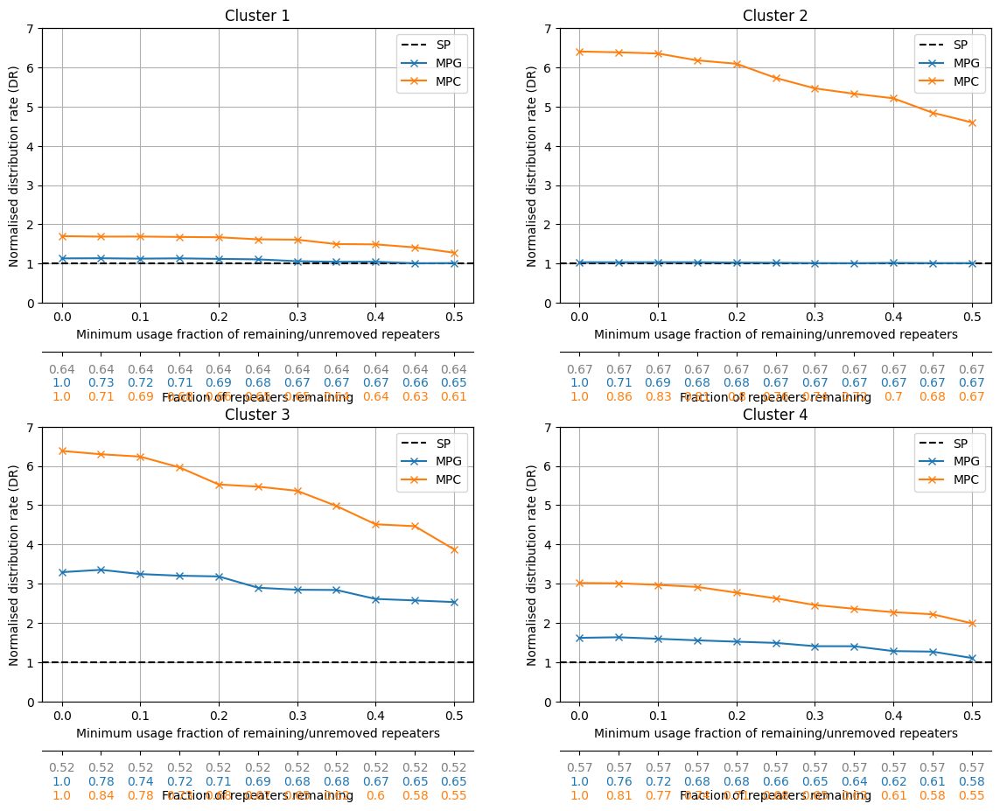

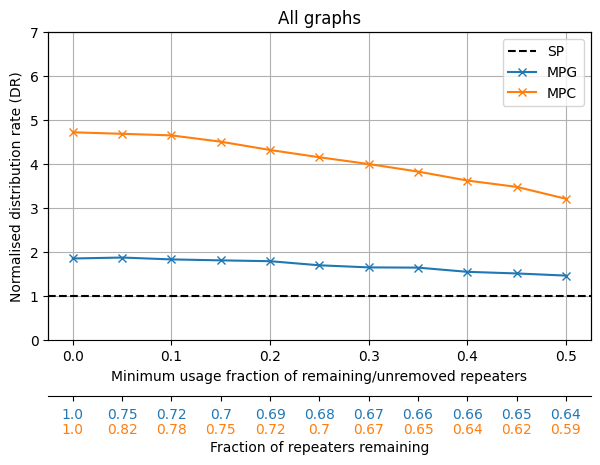

In [140]:
clusters_d_l_mpg = {n:[] for n in range(1,5)}
clusters_d_l_mpc = {n:[] for n in range(1,5)}

clusters_d_repfrac_sp = {n:[] for n in range(1,5)}
clusters_d_repfrac_mpg = {n:[] for n in range(1,5)}
clusters_d_repfrac_mpc = {n:[] for n in range(1,5)}


for i in mpc_trimmed_iters_dict:
    if i in bad_indices or i in temp_filter or i==101:
        continue

    SP_iter = sp_iters_mean_dict[i]

    mpg_iters_y = list(mpg_trimmed_iters_dict[i].values())
    mpc_iters_y = list(mpc_trimmed_iters_dict[i].values())

    mpg_iters_y = [_/SP_iter for _ in mpg_iters_y]
    mpc_iters_y = [_/SP_iter for _ in mpc_iters_y]        

    rep_frac_l_sp = []
    rep_frac_l_mpg = []
    for muf, iter in zip(mufs, mpg_iters_y):
        rep_num = trimmed_real_topos_reps_mpg[(i, round(float(muf), 2))]
        rep_frac = round(rep_num / real_topo[i].number_of_nodes(), 2)
        rep_frac_l_mpg.append(rep_frac)
        
        rep_frac_l_sp.append(round(len(real_topo_reps_SP[i])/real_topo[i].number_of_nodes(),2))
    rep_frac_l_mpc = []
    for muf, iter in zip(mufs, mpc_iters_y):
        rep_num = trimmed_real_topos_reps_mpc[(i, round(float(muf), 2))]
        rep_frac = round(rep_num / real_topo[i].number_of_nodes(), 2)
        rep_frac_l_mpc.append(rep_frac)
    

    
    for n in range(1,5):
        if i in iters_clusters[n]:
            clusters_d_l_mpg[n].append(mpg_iters_y)
            clusters_d_l_mpc[n].append(mpc_iters_y)
            clusters_d_repfrac_mpg[n].append(rep_frac_l_mpg)
            clusters_d_repfrac_mpc[n].append(rep_frac_l_mpc)
            clusters_d_repfrac_sp[n].append(rep_frac_l_sp)

clusters_d_mean_mpg = {}
clusters_d_mean_mpc = {}
clusters_d_mean_repfrac_mpg = {}
clusters_d_mean_repfrac_mpc = {}
clusters_d_mean_repfrac_sp = {}
for n in range(1,5):
    l = []
    for muf in range(11):
        l.append(np.mean([1/g[muf] for g in clusters_d_l_mpg[n] if g[muf]!=np.inf]))
    clusters_d_mean_mpg[n] = l

    l = []
    for muf in range(11):
        l.append(np.mean([1/g[muf] for g in clusters_d_l_mpc[n] if g[muf]!=np.inf]))
    clusters_d_mean_mpc[n] = l

    l = []
    for muf in range(11):
        l.append(round(np.mean([g[muf] for g in clusters_d_repfrac_mpg[n]]),2))
    clusters_d_mean_repfrac_mpg[n] = l

    l = []
    for muf in range(11):
        l.append(round(np.mean([g[muf] for g in clusters_d_repfrac_mpc[n]]),2))
    clusters_d_mean_repfrac_mpc[n] = l

    l = []
    for muf in range(11):
        l.append(round(np.mean([g[muf] for g in clusters_d_repfrac_sp[n]]),2))
    clusters_d_mean_repfrac_sp[n] = l


mufs = np.arange(0, 0.55, 0.05)
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0.45)

for clus in range(1,5):
    ax1 = axes[clus-1]    
    ax1.axhline(y=1, linestyle='--', color='black', label='SP')
    ax1.plot(mufs, clusters_d_mean_mpg[clus], marker='x', label='MPG')
    ax1.plot(mufs, clusters_d_mean_mpc[clus], marker='x', label='MPC')
    ax1.set_xlabel('Minimum usage fraction of remaining/unremoved repeaters')
    ax1.set_ylabel('Normalised distribution rate (DR)')
    ax1.set_ylim(ymin=0,ymax=7)

    ax2 = ax1.twiny()
    ax2.xaxis.set_ticks_position('bottom')
    ax2.xaxis.set_label_position('bottom')
    ax2.spines['bottom'].set_position(('outward', 40))
    ax2.set_xticks(np.arange(0,0.55,0.05))
    ax2.set_xbound(ax1.get_xbound())
    ax2.set_xticklabels([f' \n ' for _ in range(11)])
    ax2.set_xlabel('Fraction of repeaters remaining')
    for muf, mpg_f, mpc_f, sp_f in zip(mufs, clusters_d_mean_repfrac_mpg[clus], clusters_d_mean_repfrac_mpc[clus],clusters_d_mean_repfrac_sp[clus]):
        ax2.text(muf, -0.22, f'{sp_f}', color='tab:gray', ha='center', va='top', fontsize=10, transform=ax2.get_xaxis_transform())
        ax2.text(muf, -0.27, f'{mpg_f}', color='tab:blue', ha='center', va='top', fontsize=10, transform=ax2.get_xaxis_transform())
        ax2.text(muf, -0.32, f'{mpc_f}', color='tab:orange', ha='center', va='top', fontsize=10, transform=ax2.get_xaxis_transform())


    ax1.grid(True)
    ax1.legend()
    ax1.set_title(f'Cluster {clus}')

    #print(f'cluster {clus}')
    #print(f'MPG: {[float(round(clusters_d_mean_mpg[clus][i],2)) for i in range(11)]}')
    #print(f'MPC: {[float(round(clusters_d_mean_mpc[clus][i],2)) for i in range(11)]}')



clusters_all_mpg = [item for sublist in clusters_d_l_mpg.values() for item in sublist]
clusters_all_mpc = [item for sublist in clusters_d_l_mpc.values() for item in sublist]
clusters_all_repfrac_mpg = [item for sublist in clusters_d_repfrac_mpg.values() for item in sublist]
clusters_all_repfrac_mpc = [item for sublist in clusters_d_repfrac_mpc.values() for item in sublist]
clusters_all_mpg_mean = [ np.mean([1/g[muf] for g in clusters_all_mpg if g[muf]!=np.inf]) for muf in range(11)]
clusters_all_mpc_mean = [ np.mean([1/g[muf] for g in clusters_all_mpc if g[muf]!=np.inf]) for muf in range(11)]
clusters_all_repfrac_mpg = [ np.mean([g[muf] for g in clusters_all_repfrac_mpg]) for muf in range(11)]
clusters_all_repfrac_mpc = [ np.mean([g[muf] for g in clusters_all_repfrac_mpc]) for muf in range(11)]



mufs = np.arange(0,0.55,0.05)


fig, ax1 = plt.subplots(figsize=(7, 4))

ax1.axhline(y=1, linestyle='--', color='black', label='SP')
ax1.plot(mufs, clusters_all_mpg_mean, marker='x', label='MPG')
ax1.plot(mufs, clusters_all_mpc_mean, marker='x', label='MPC')

ax1.set_xlabel('Minimum usage fraction of remaining/unremoved repeaters')
ax1.set_ylabel('Normalised distribution rate (DR)')
ax1.set_ylim(ymin=0,ymax=7)

ax2 = ax1.twiny()
ax2.xaxis.set_ticks_position('bottom')
ax2.xaxis.set_label_position('bottom')
ax2.spines['bottom'].set_position(('outward', 40))
ax2.set_xticks(np.arange(0,0.55,0.05))
ax2.set_xbound(ax1.get_xbound())
ax2.set_xticklabels([f' \n ' for _ in range(11)])
ax2.set_xlabel('Fraction of repeaters remaining')
for muf, mpg_f, mpc_f in zip(mufs, clusters_all_repfrac_mpg, clusters_all_repfrac_mpc):
    ax2.text(muf, -0.22, f'{round(mpg_f,2)}', color='tab:blue', ha='center', va='top', fontsize=10, transform=ax2.get_xaxis_transform())
    ax2.text(muf, -0.27, f'{round(mpc_f,2)}', color='tab:orange', ha='center', va='top', fontsize=10, transform=ax2.get_xaxis_transform())


ax1.grid(True)
ax1.legend()
ax1.set_title(f'All graphs')

#print('all topos')
#print(f'MPG: {[float(round(clusters_all_mpg_mean[i],2)) for i in range(11)]}')
#print(f'MPC: {[float(round(clusters_all_mpc_mean[i],2)) for i in range(11)]}')

